Notes:

First: Is there a way to see if an image is "inverted" without using ML
Can plot "features" to see if the image is inverted or not

Can ML be used to better identify quantity of scales?

TODO: also figure out a way of reducing the number of scales

Using statistics run hypothesis tests

Overview:

    The goal of this project is to create a tool that can automatically count the number of scales in an image of anoles skin. So far out approach has been one of an initial Image Segmentation: analysis of the data collected from that intial image segmentation through attention to the mean of the scale size and the number of scales. After that,we preform an adaptive segmentation choosing a block size based on the original data analysis.
    
OTSU SEGMENTAION:

    It is an algorithm returns a single intensity threshold that separate pixels into two classes, foreground and background. The way OTSU does this is by iterating through all possible threshold values. It chooses the threshold value that minimizes the sum spread of the color values of the forground and the background after the spread of the forground and background have been multipled by their respective weights (the weights show what percentage of the image the forground and background occupy per threshold) This value is called the Within Class Variance.

<img src="Otsu_visualization1.png"> 
   
MORE:

    The main issue with OTSU is that there seems to be a huge amount of noise. OTSU also does not seem to work well for images where that due to image quality are much darker in some places and much lighter in others: in such cases OTSU is unable to distinguish bettween the foregorund and background in those darker regions and gives usually an undercount. The thresholding errors can be seen with the following images. 
    
    OTSU is a type of simple thresholding: "in simple thresholding, the threshold value is global, i.e., it is same for all the pixels in the image. Adaptive thresholding is the method where the threshold value is calculated for smaller regions and therefore, there will be different threshold values for different regions." "The assumption behind local thresholding is that smaller image regions are more likely to have approximately uniform illumination, thus being more suitable for thresholding."

OTHER TYPES OF THRESHOLDING ALGORITHIMS:

    Adaptive thesholdhing divides the image into subpart/neigborhoods and then applies either a ADAPTIVE_THRESH_MEAN or ADAPTIVE_THRESH_GAUSSIAN to the image: it either takes the mean pixel value of the neighborhood and uses it as the threshold values or takes the weighted sum of the pixel values. This is still not ideal: the neighborhood size has to be chosen carefully. Big niegborhoods may ignore the need for adaptive thresholding in the first place and result in the same issues that OTSU has with images that have uneven illumination. Small neighborhoods can result in a broken up image and in the case of scales, an overcount.
    



Data that may be useful to collect:
    The uniformity of the scales OTSU is able to detect
        - Can be measured by the SD of the distance between the scales: Can plot this
        - The SD of the size of the scales
        - 

The following code creates a heat map for each of the images. It attempts to see the distribution: the density, of the dots.

In [1]:
import cv2
import numpy as np
from datascience import *
import matplotlib as mpl
from matplotlib import pyplot as plt
import sys
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 120
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import pandas

In [2]:
images = []
labeled_imgs = []
original_img = []
original_img1 = []
filter_img = []
image_names = []

In [3]:
#access img directory
dirname = 'Anolis_cristatellus_images/'


#create an iterator object for img directory
directory = os.scandir(dirname)

Anolis_cristatellus_images/212019Ventral-NoFlash-3.png


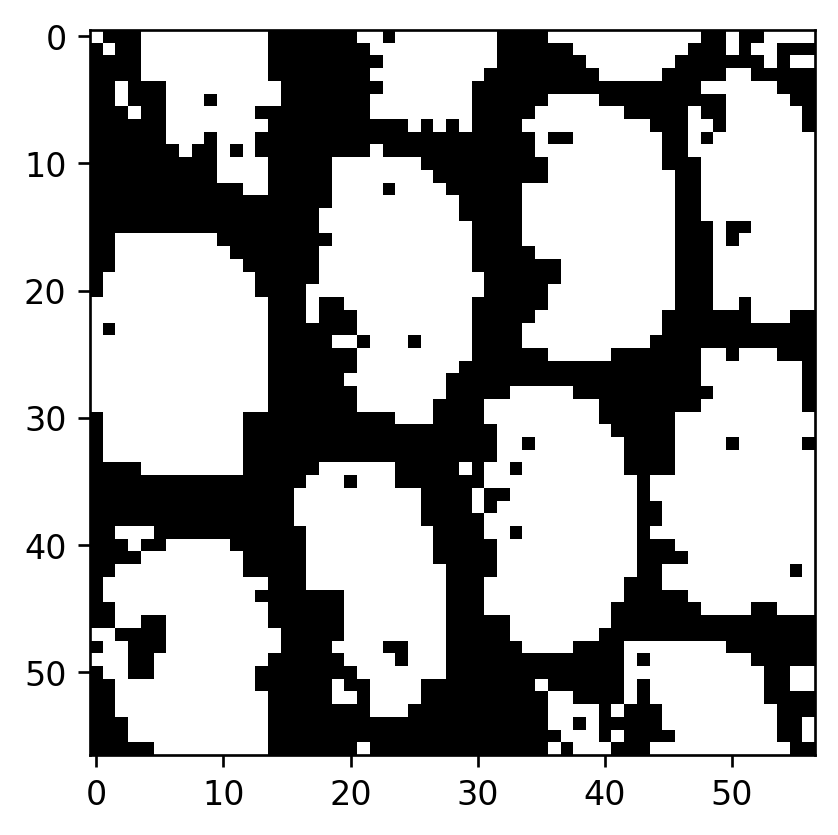

Anolis_cristatellus_images/212019Dorsal-NoFlash-2.png


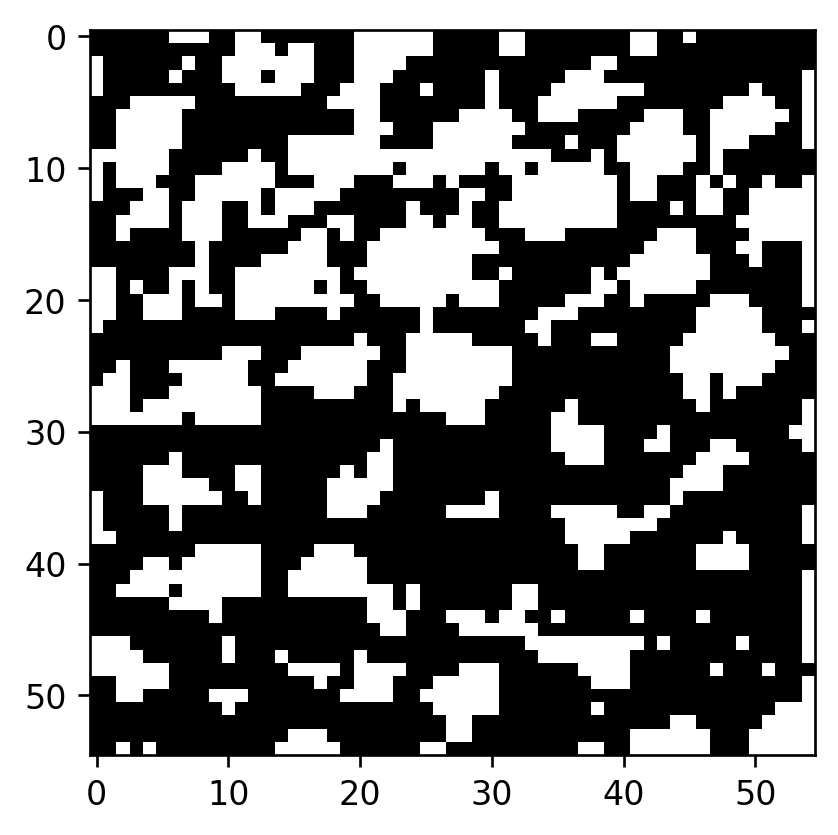

Anolis_cristatellus_images/251165Ventral-NoFlash-2.png


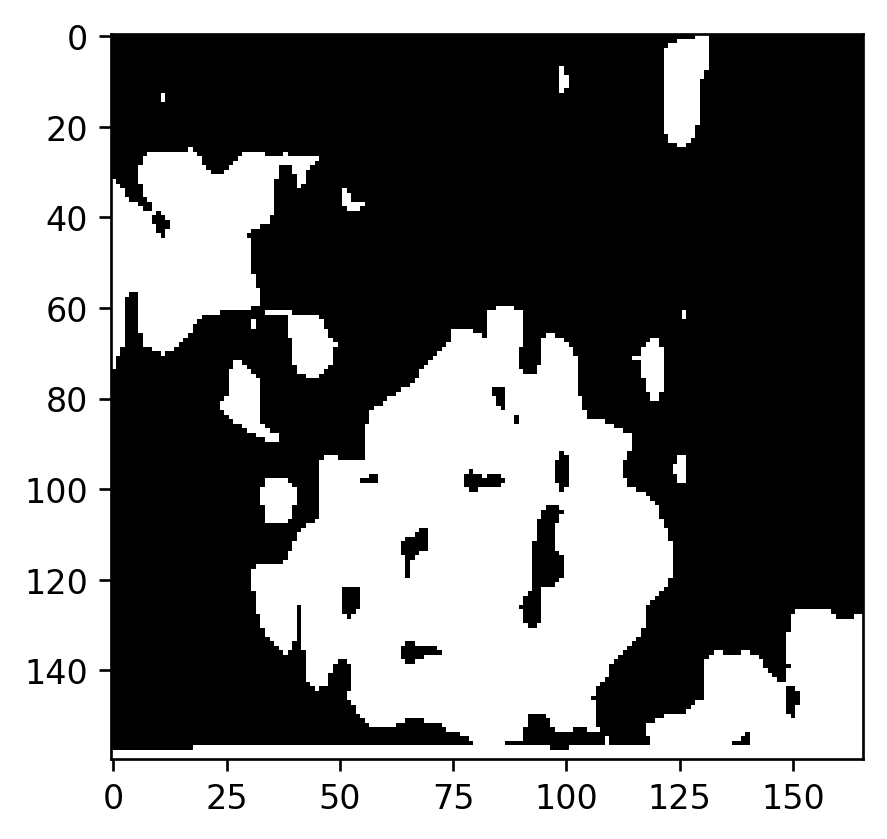

Anolis_cristatellus_images/251165Ventral-Flash-3.png


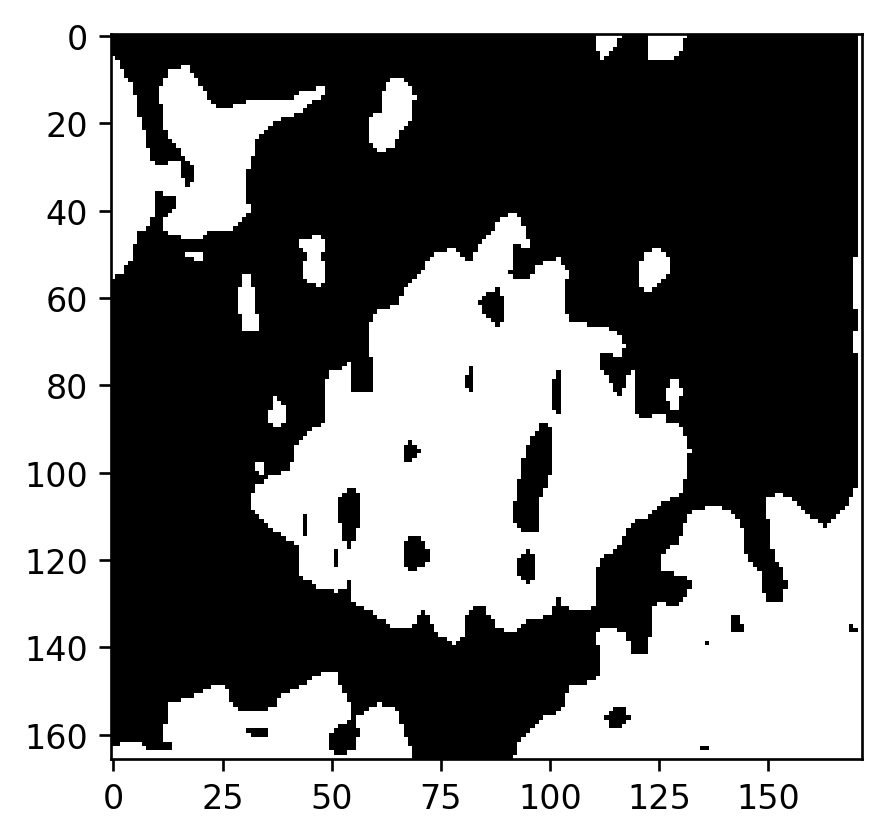

Anolis_cristatellus_images/212018Dorsal-NoFlash-3.png


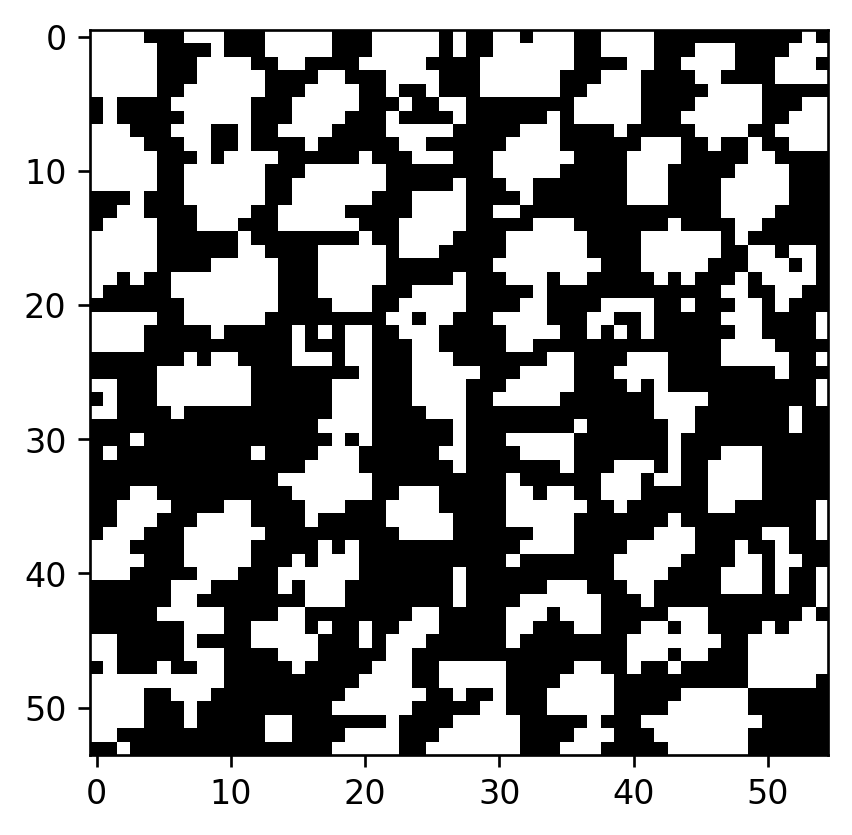

Anolis_cristatellus_images/212018Dorsal-NoFlash-2.png


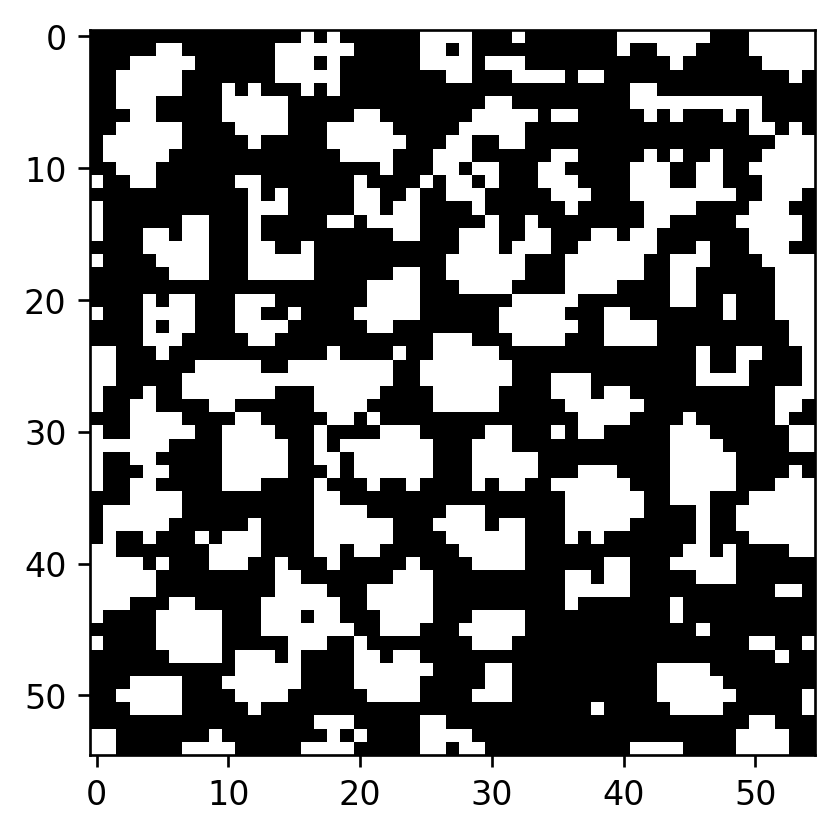

Anolis_cristatellus_images/214993Dorsal-NoFlash-1.png


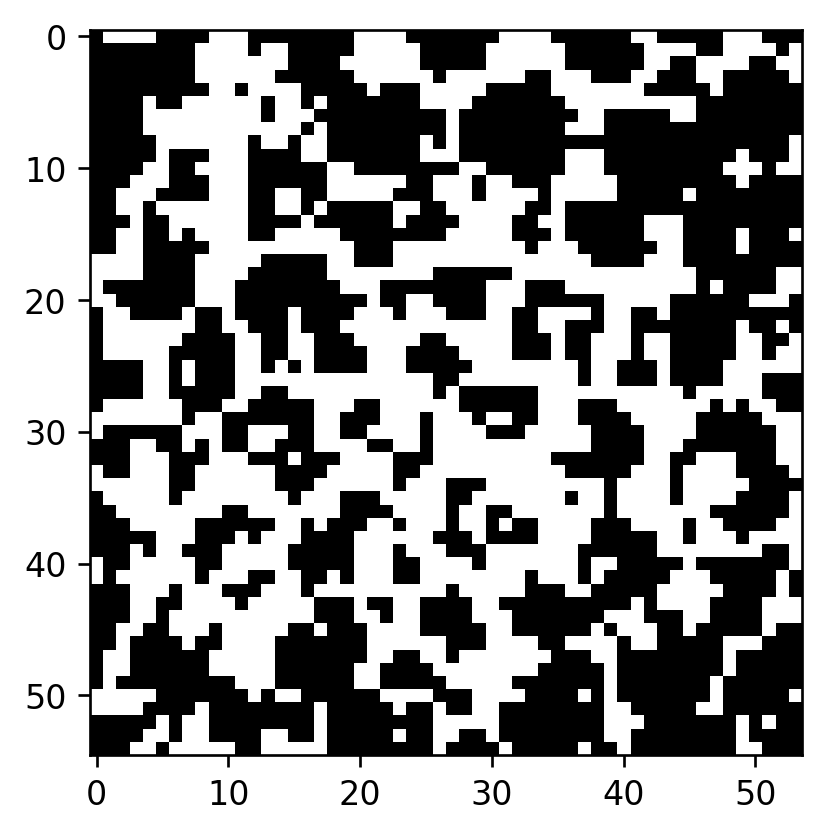

Anolis_cristatellus_images/251165Ventral-Flash-2.png


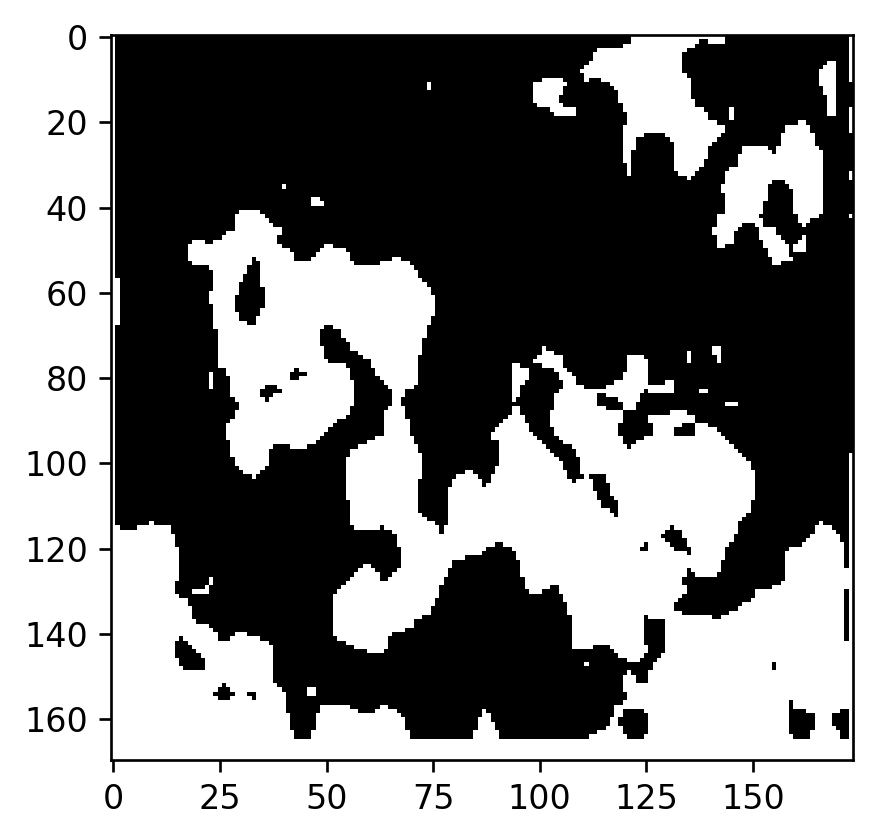

Anolis_cristatellus_images/251165Ventral-NoFlash-3.png


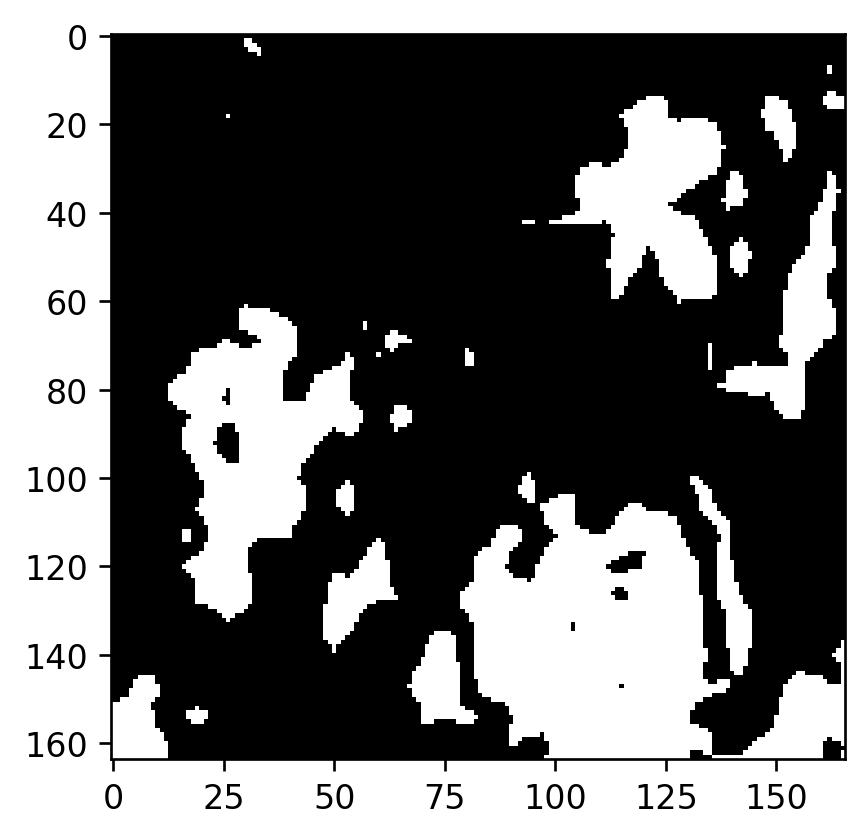

Anolis_cristatellus_images/212019Dorsal-NoFlash-3.png


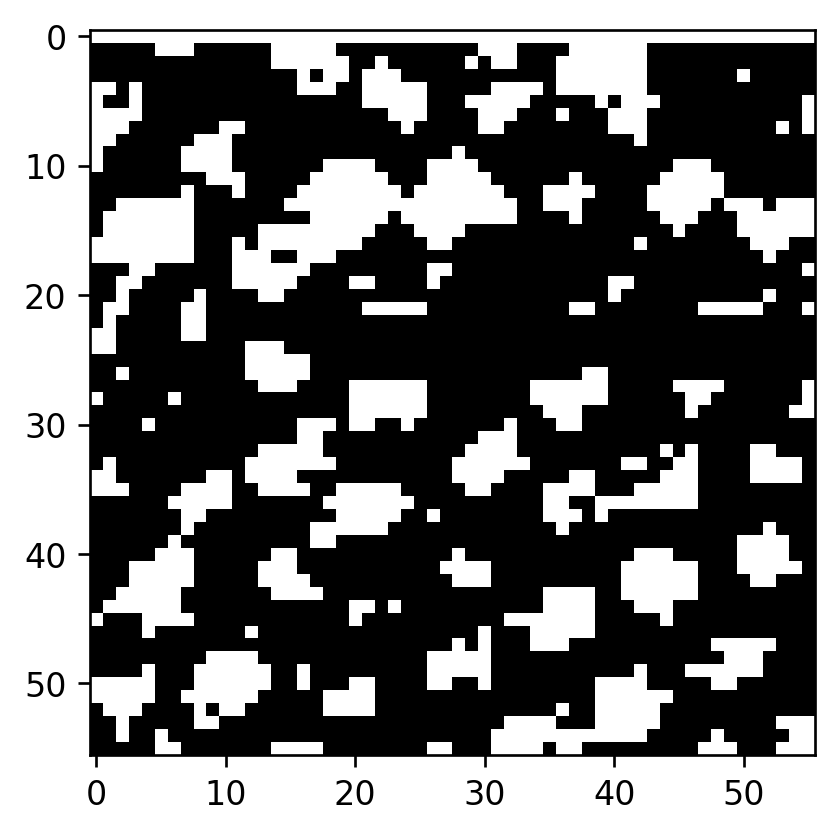

Anolis_cristatellus_images/212019Ventral-NoFlash-2.png


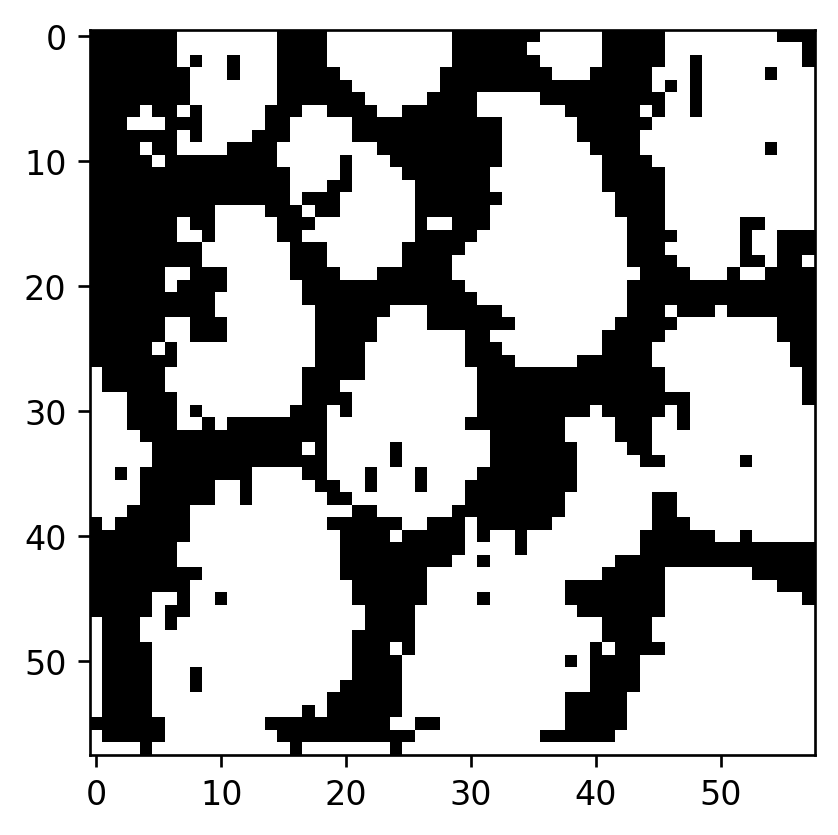

Anolis_cristatellus_images/212019Dorsal-NoFlash-1.png


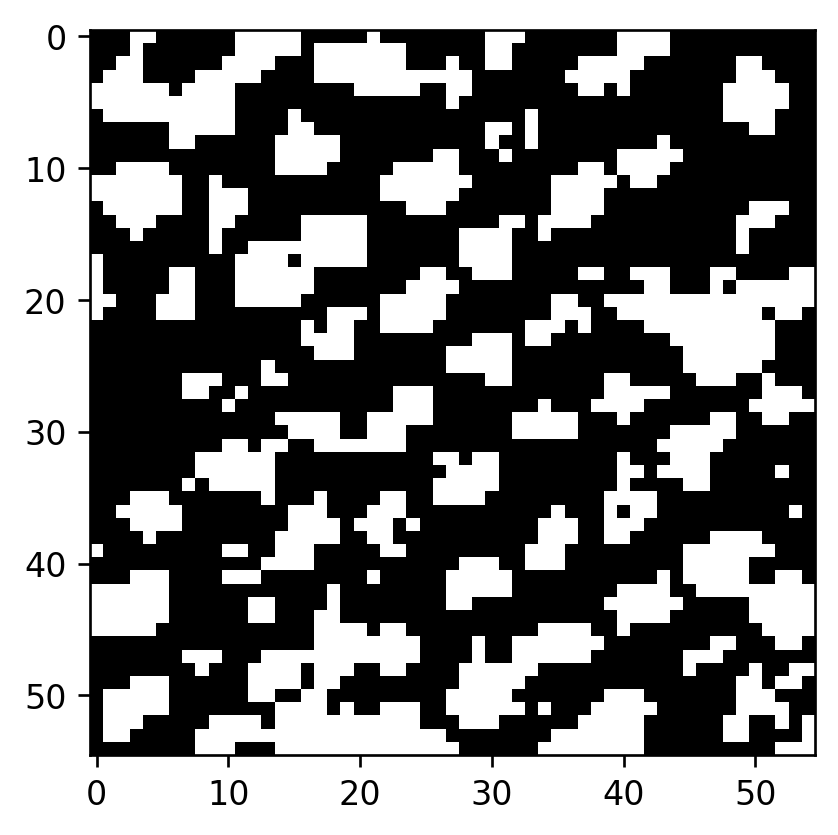

Anolis_cristatellus_images/251165Ventral-NoFlash-1.png


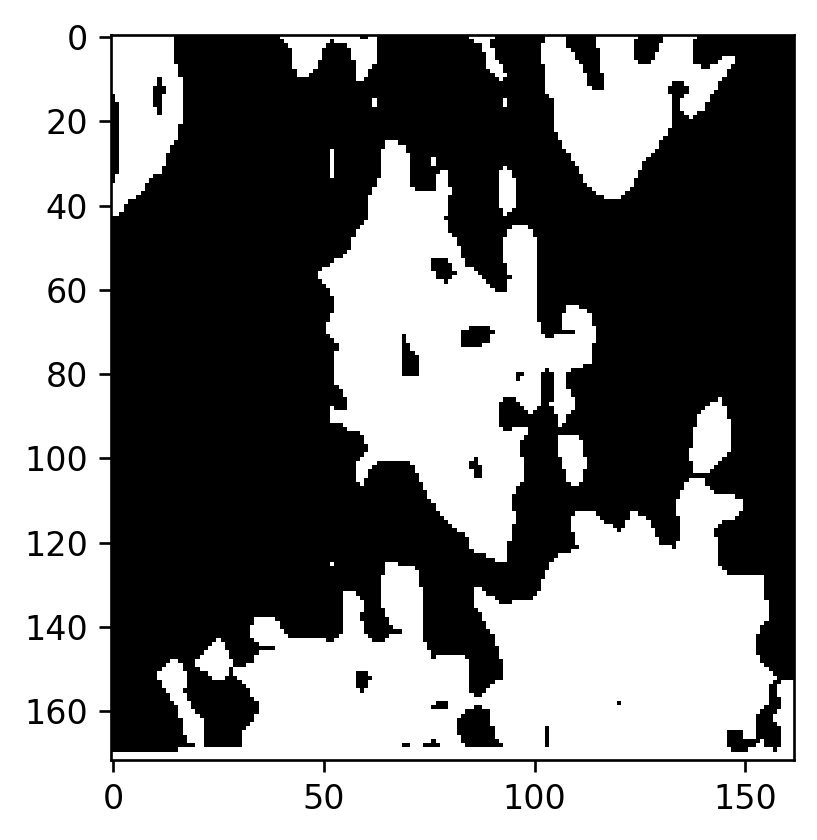

Anolis_cristatellus_images/214993Dorsal-NoFlash-3.png


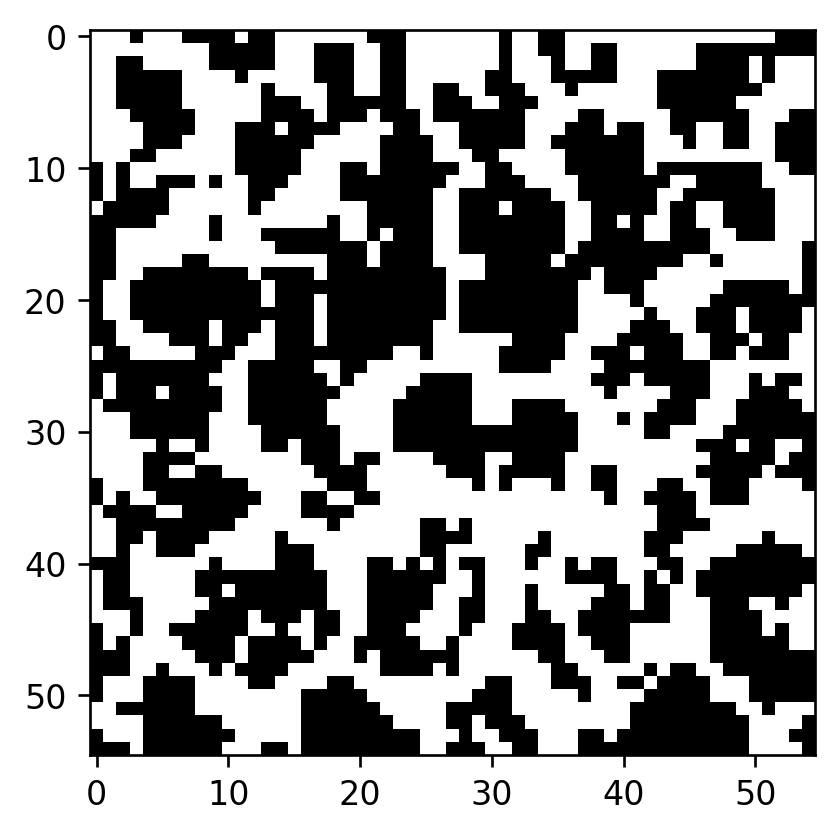

Anolis_cristatellus_images/212018Dorsal-NoFlash-1.png


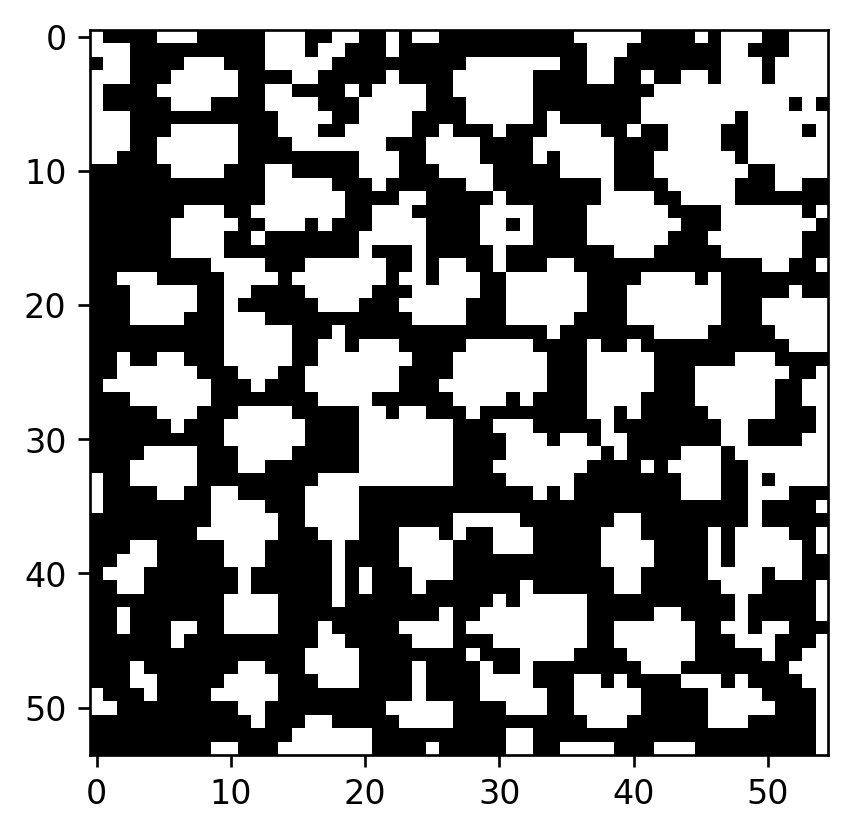

Anolis_cristatellus_images/214993Dorsal-NoFlash-2.png


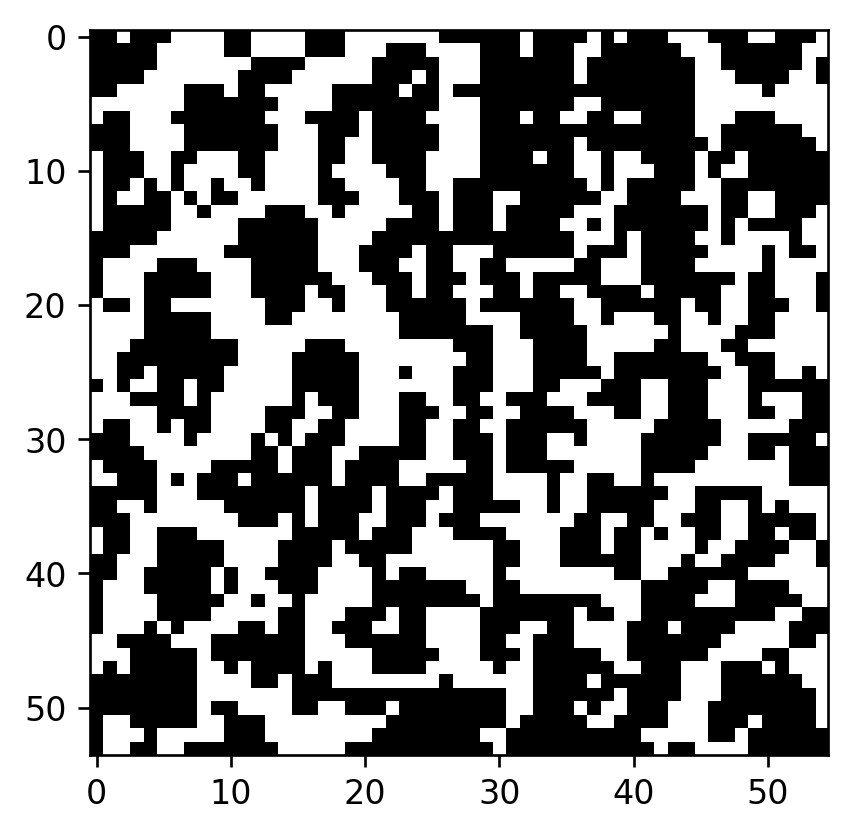

Anolis_cristatellus_images/251165Ventral-Flash-1.png


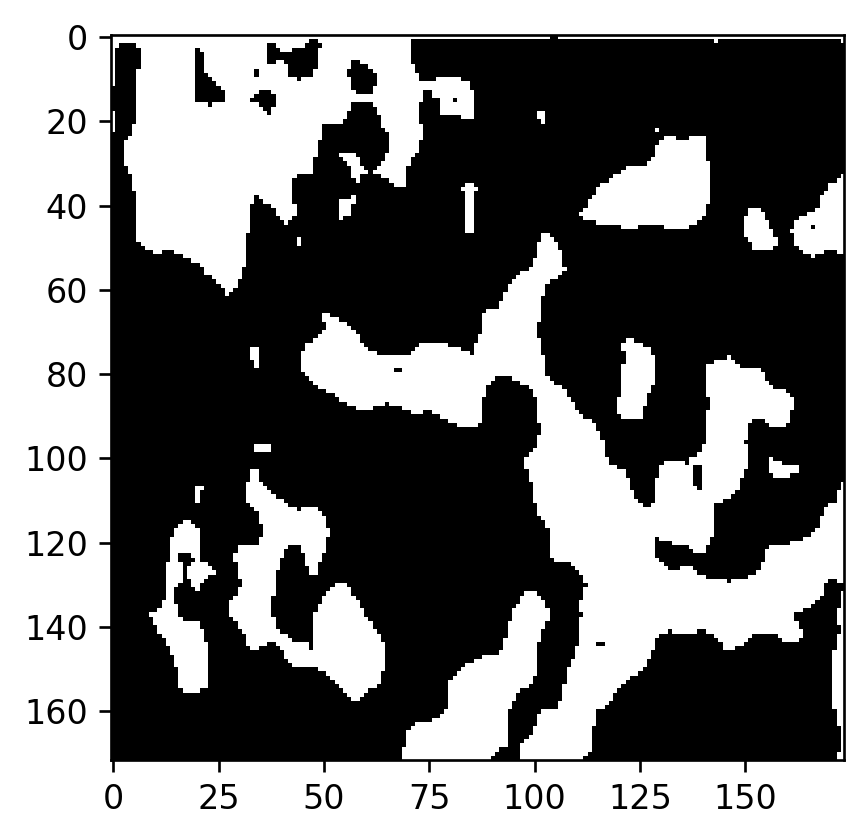

Anolis_cristatellus_images/212019Ventral-NoFlash-1.png


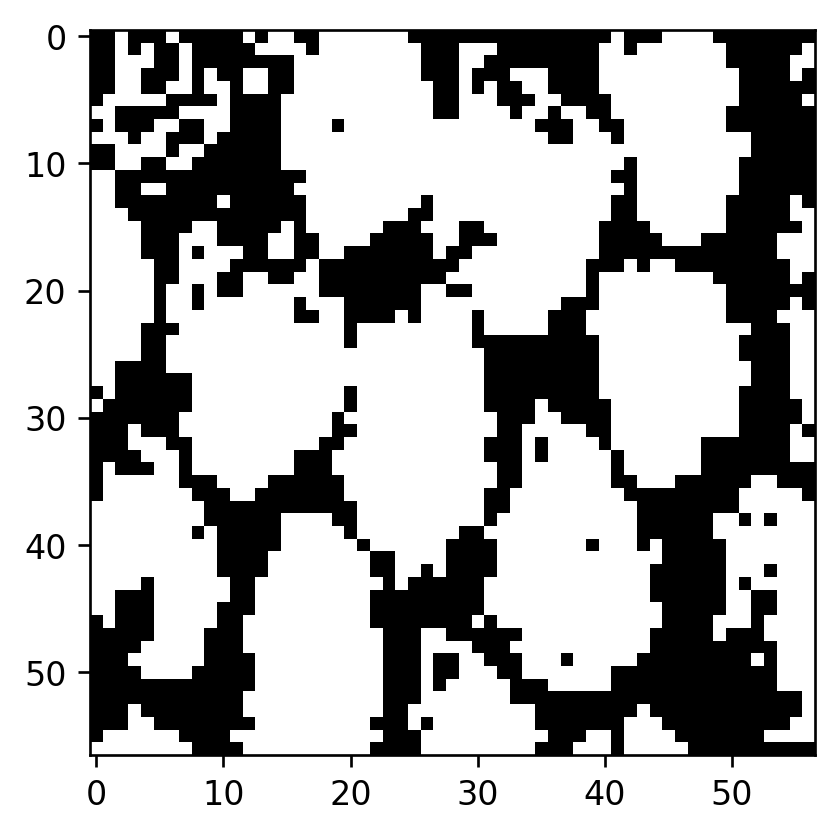

Anolis_cristatellus_images/226121Dorsal-NoFlash-2.png


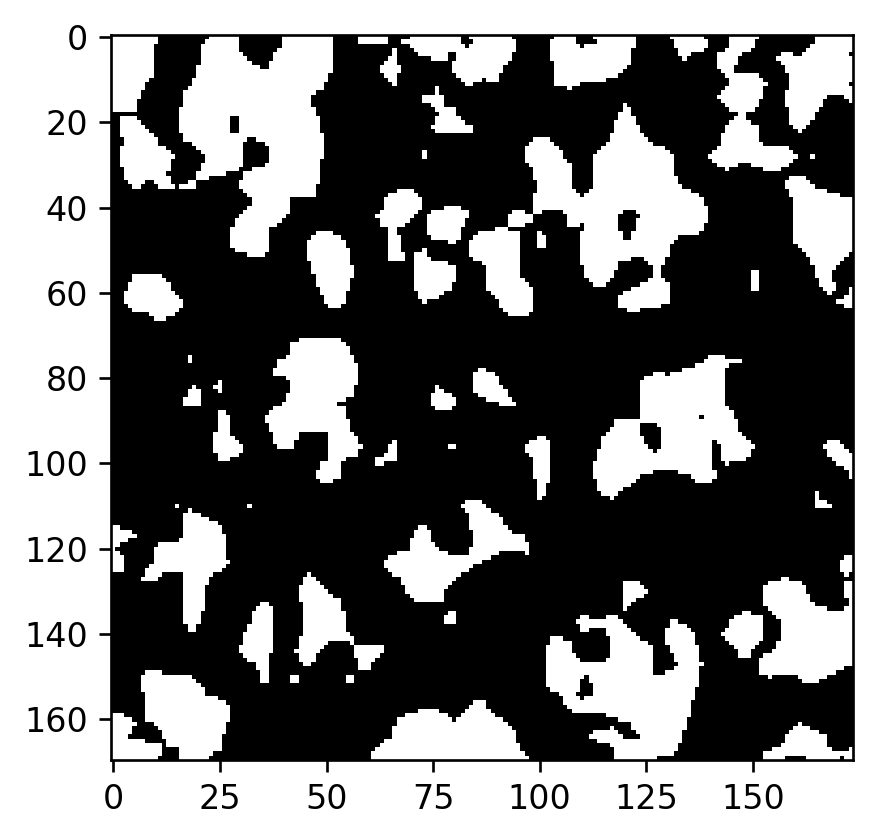

Anolis_cristatellus_images/226123Dorsal-NoFlash-1.png


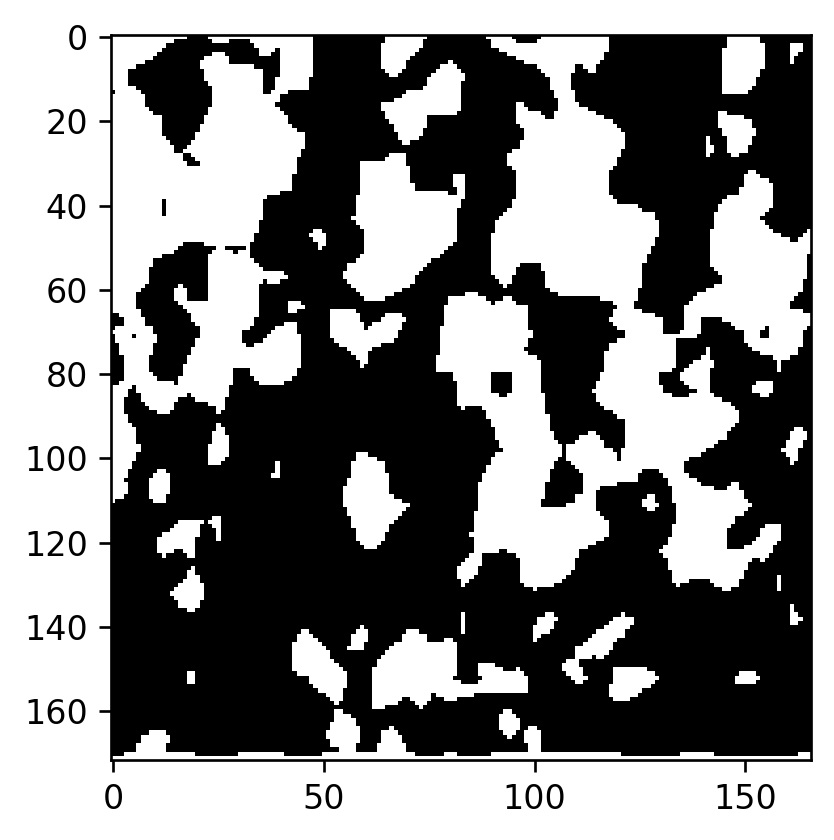

Anolis_cristatellus_images/226121Dorsal-NoFlash-3.png


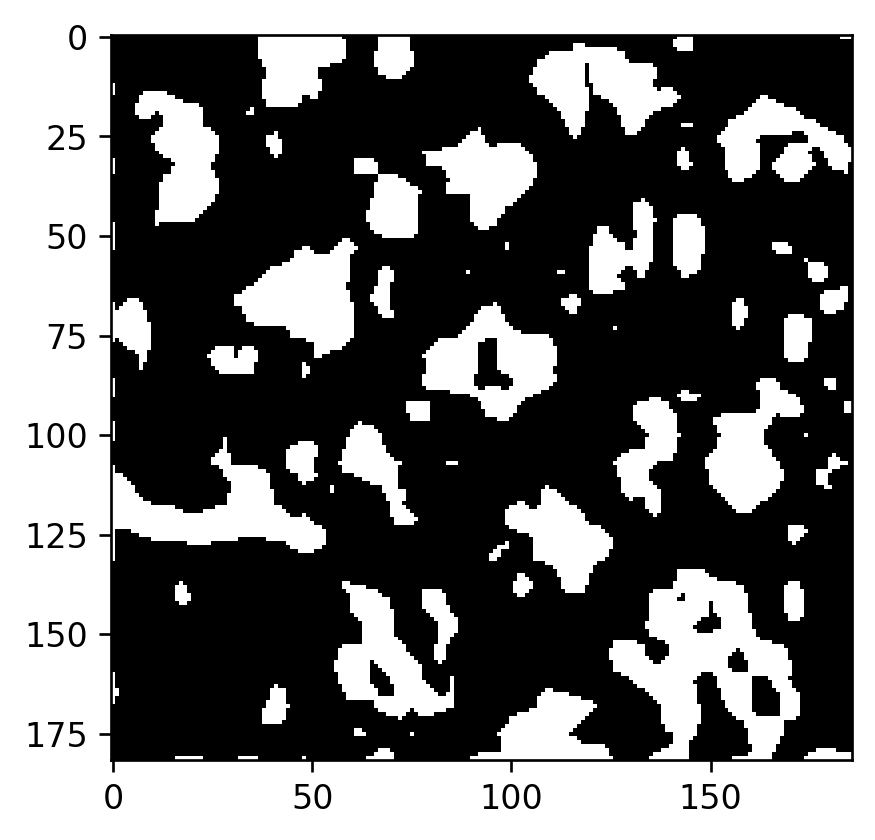

Anolis_cristatellus_images/226121Dorsal-NoFlash-1.png


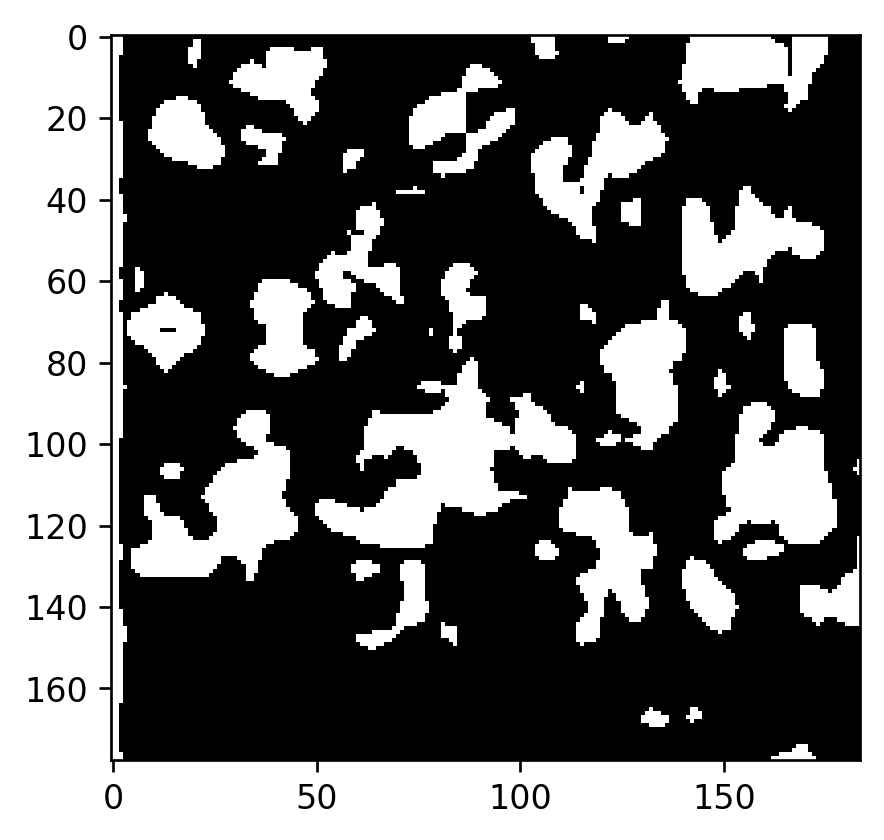

Anolis_cristatellus_images/226123Dorsal-NoFlash-2.png


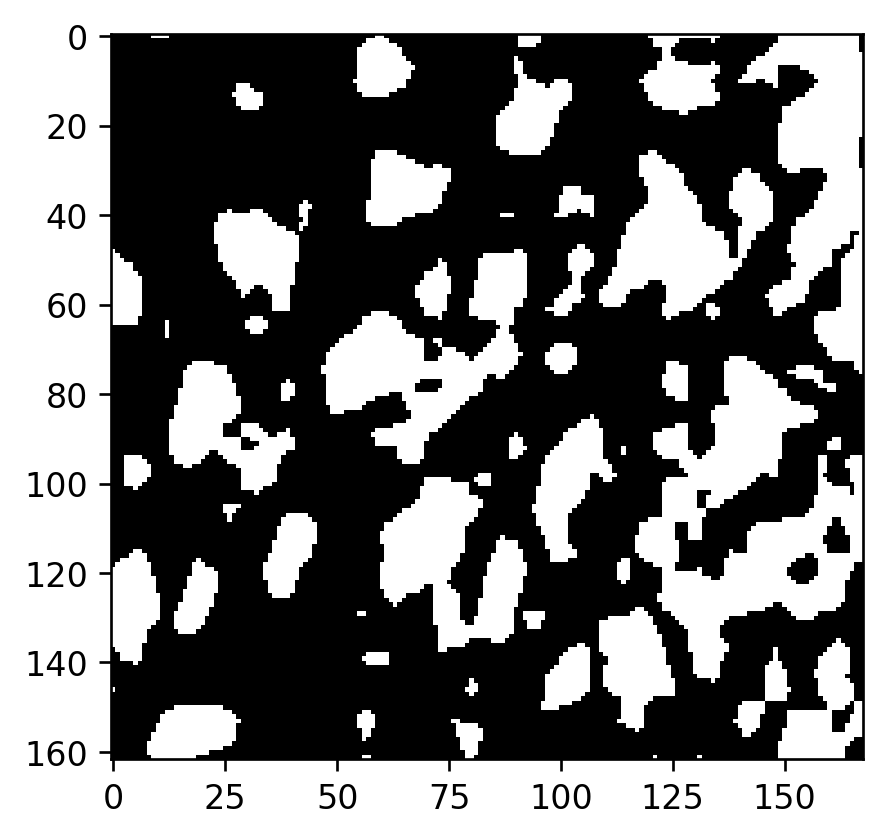

Anolis_cristatellus_images/226123Dorsal-NoFlash-3.png


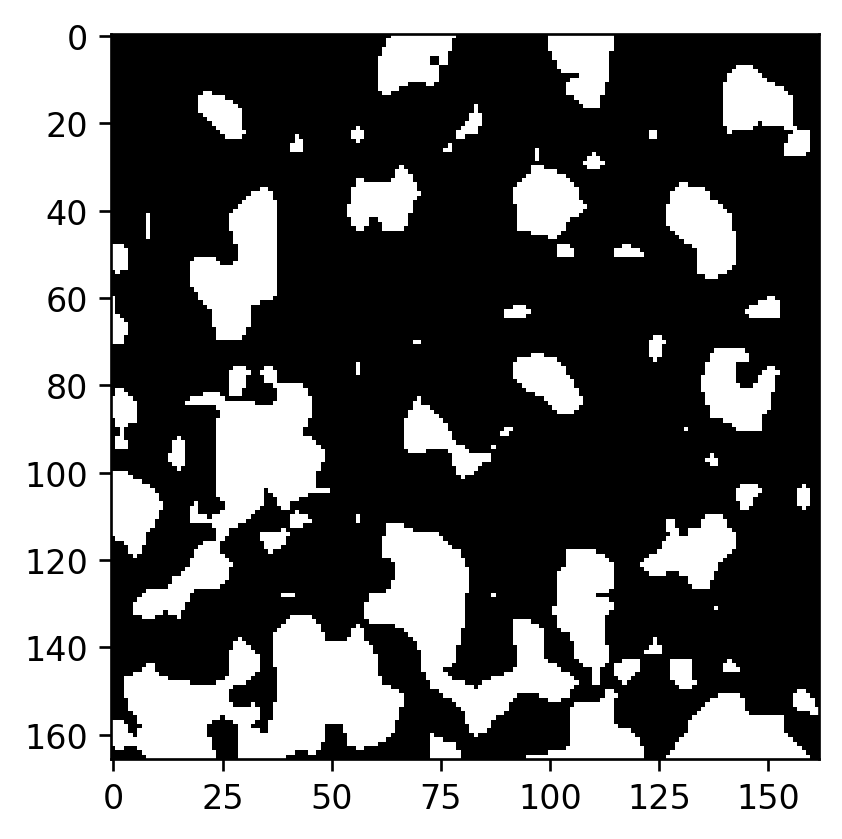

Anolis_cristatellus_images/214993Ventral-Flash-3.png


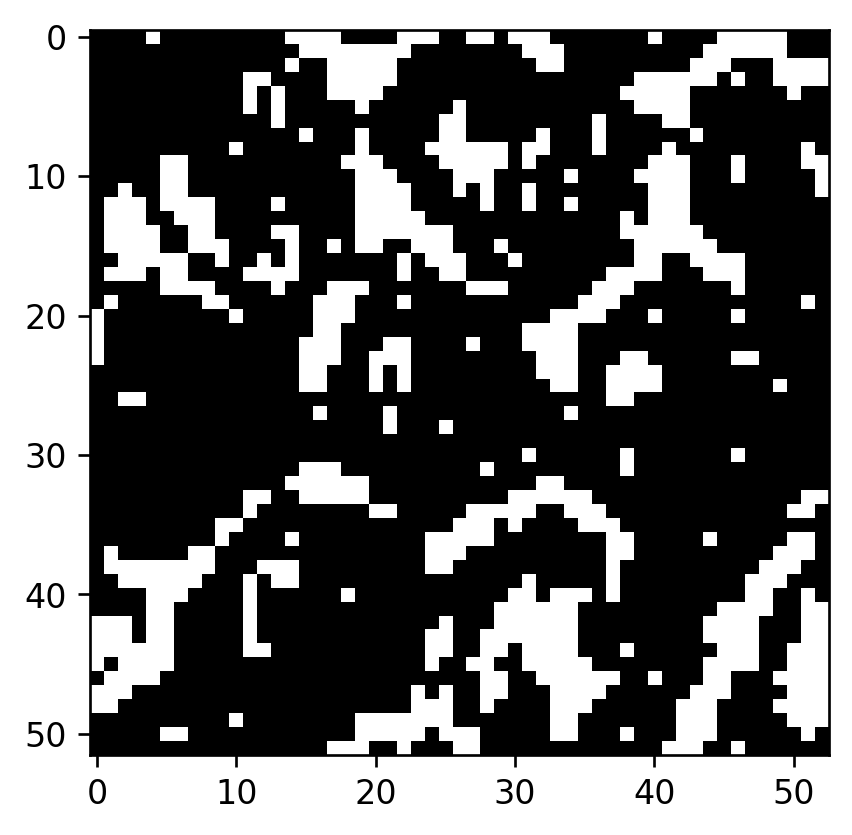

Anolis_cristatellus_images/226123Dorsal-Flash-2.png


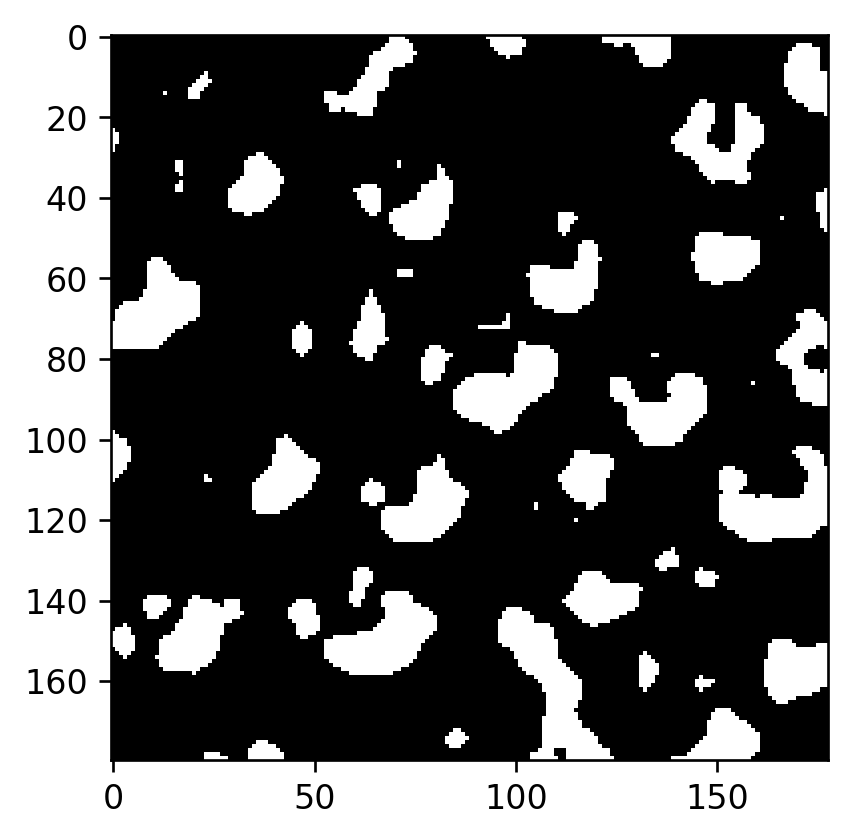

Anolis_cristatellus_images/212018Ventral-NoFlash-1.png


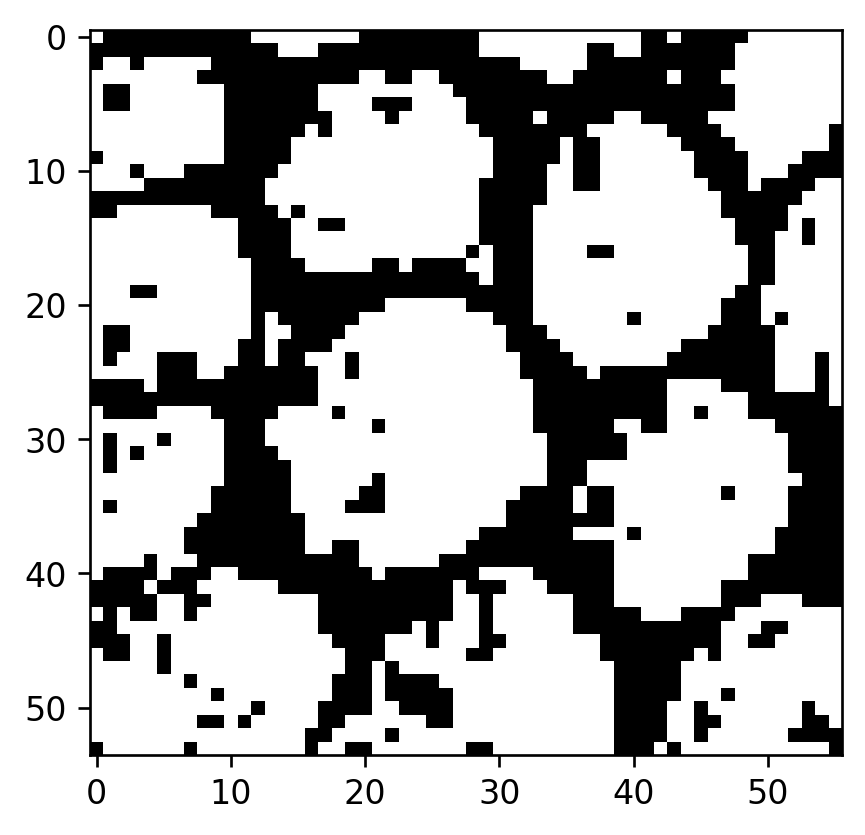

Anolis_cristatellus_images/226123Dorsal-Flash-3.png


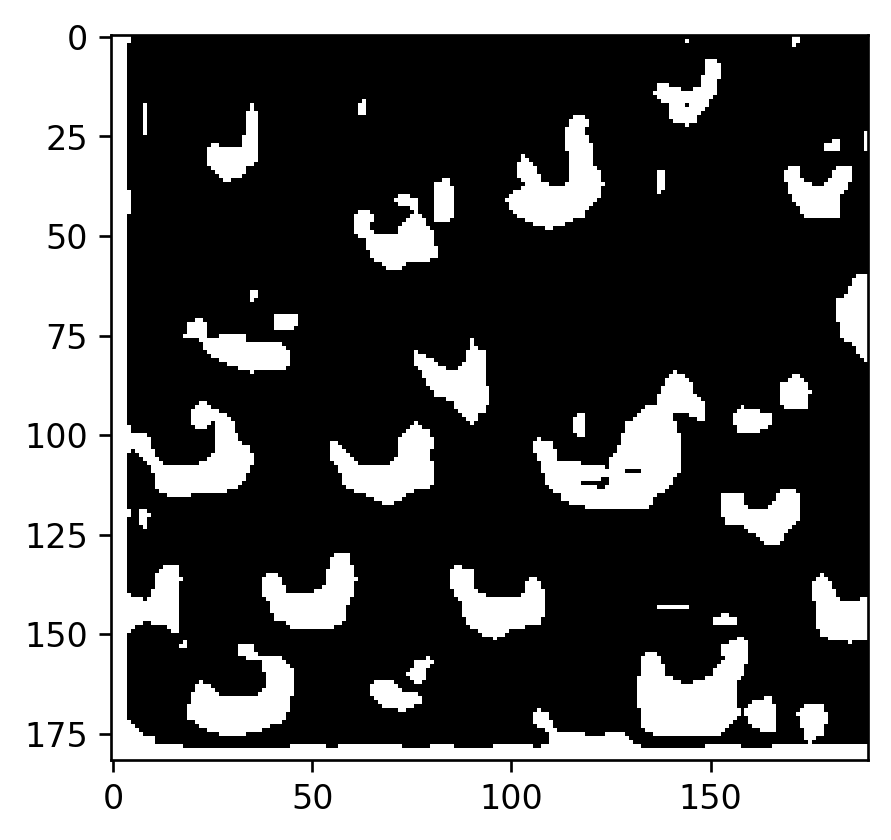

Anolis_cristatellus_images/251165Dorsal-NoFlash-1.png


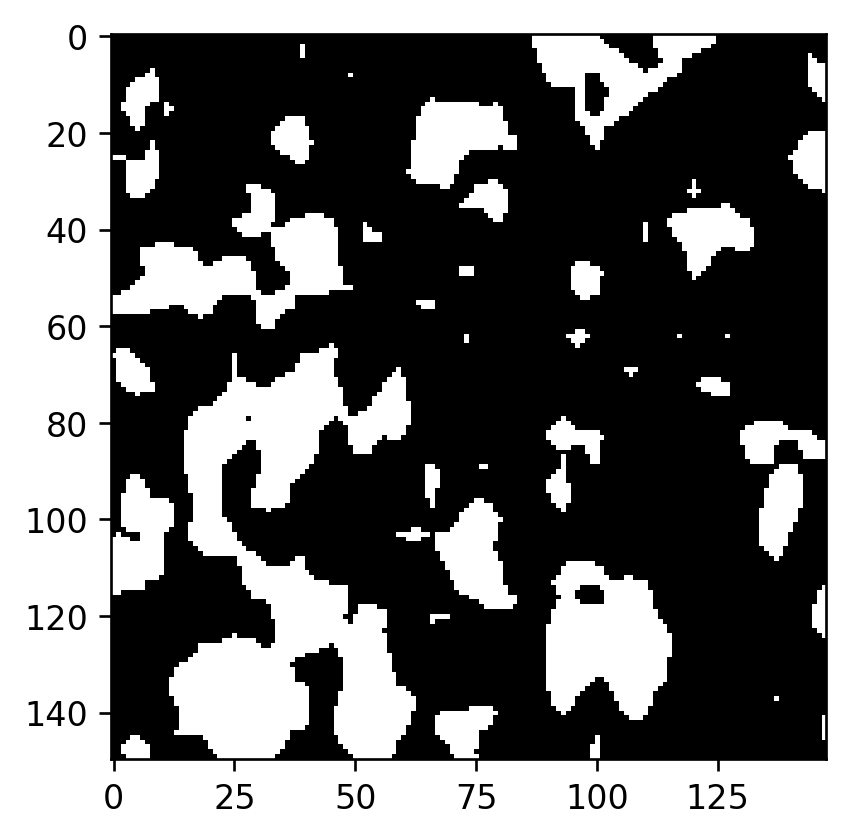

Anolis_cristatellus_images/212020Ventral-NoFlash-1.png


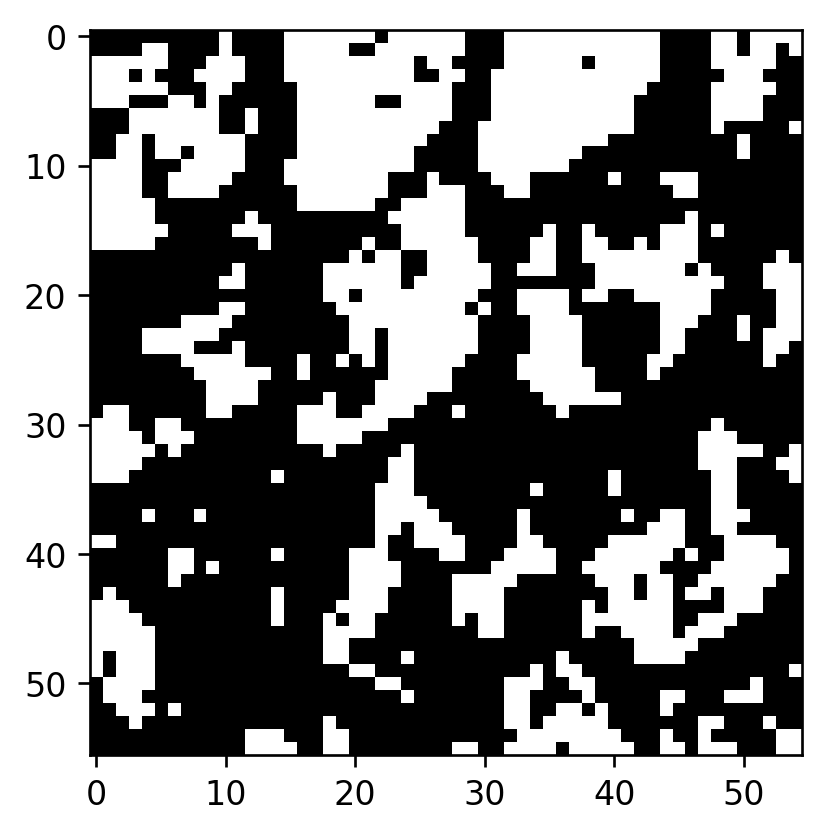

Anolis_cristatellus_images/214993Ventral-Flash-2.png


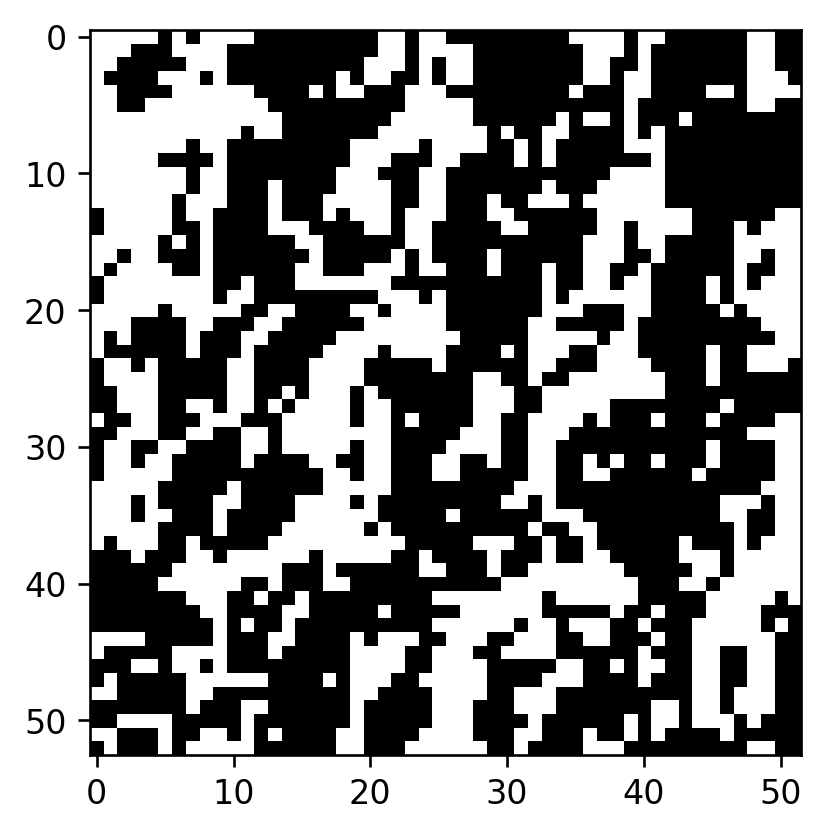

Anolis_cristatellus_images/212020Ventral-NoFlash-3.png


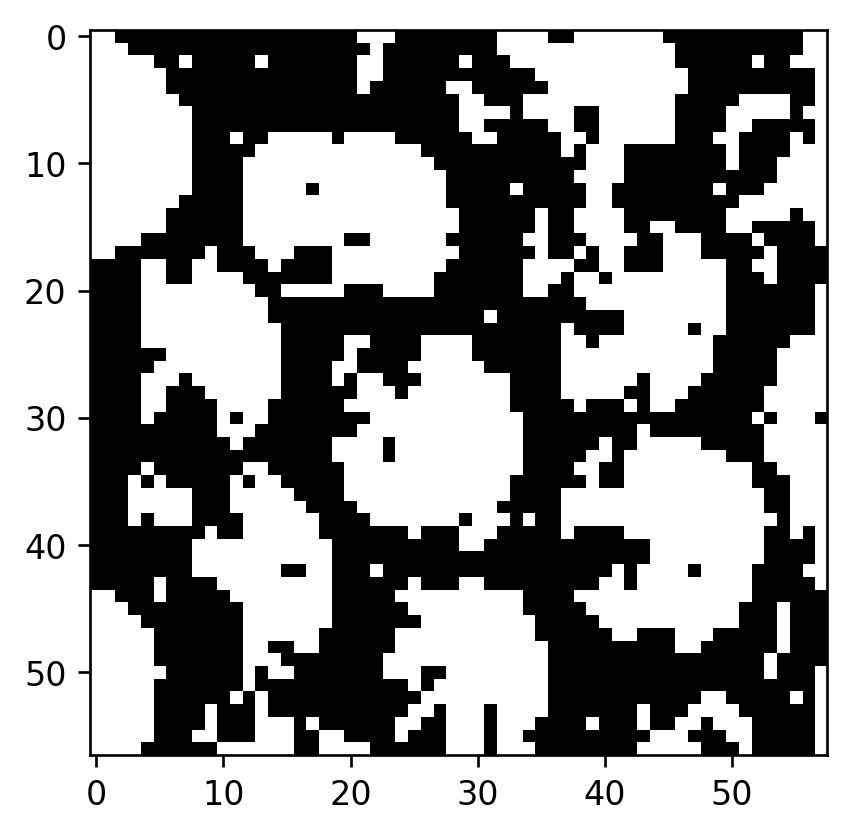

Anolis_cristatellus_images/226123Dorsal-NoFlash-4.png


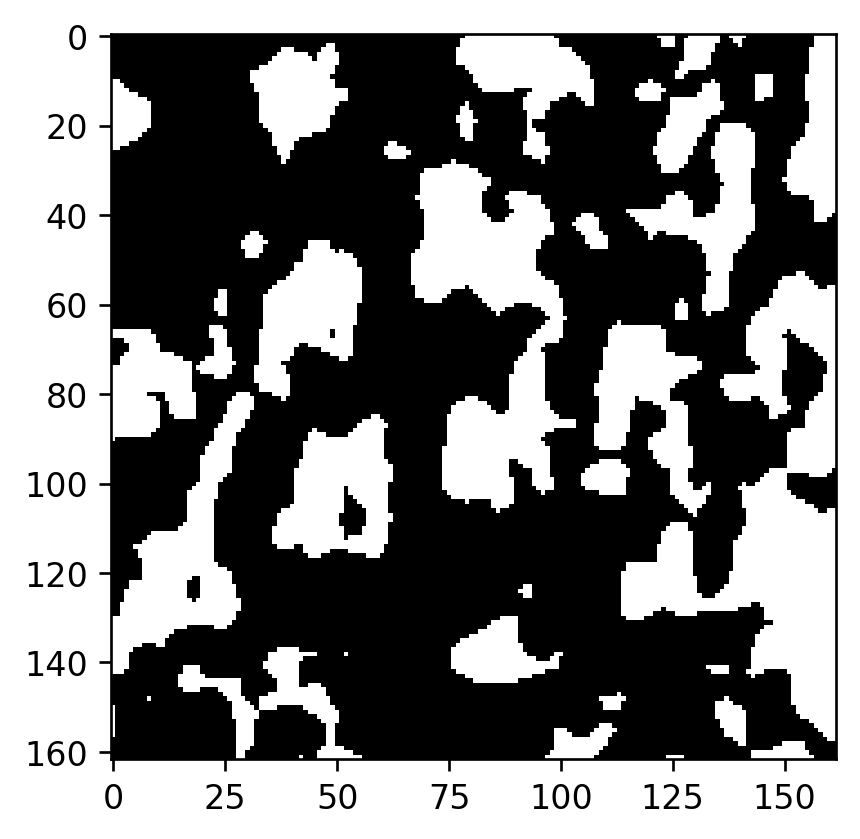

Anolis_cristatellus_images/251165Dorsal-NoFlash-3.png


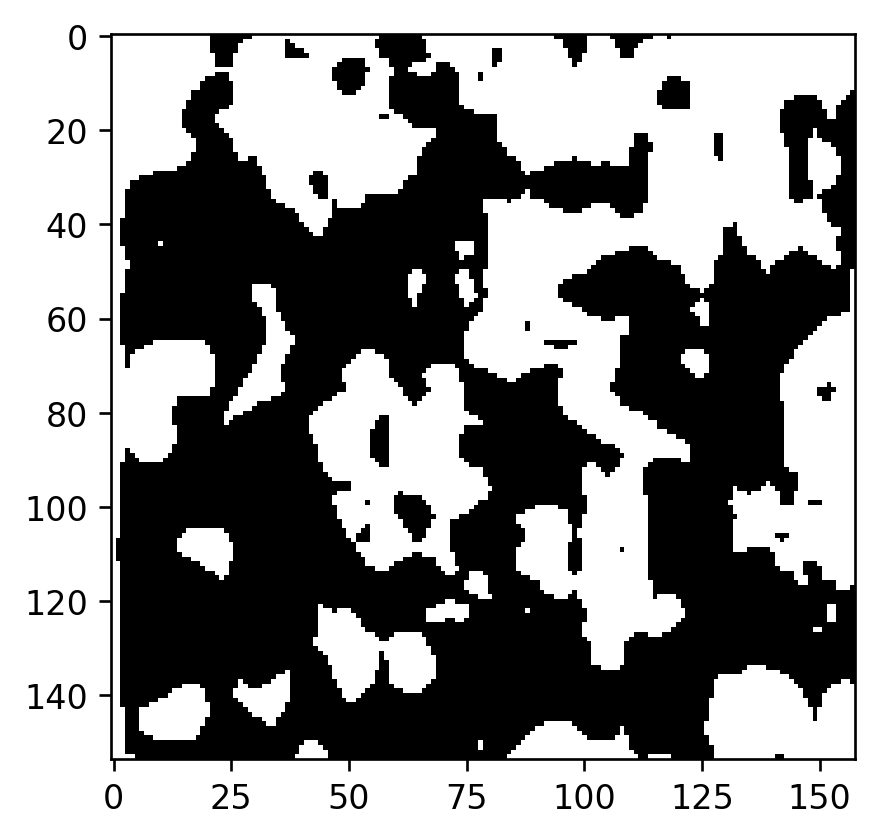

Anolis_cristatellus_images/226123Dorsal-Flash-1.png


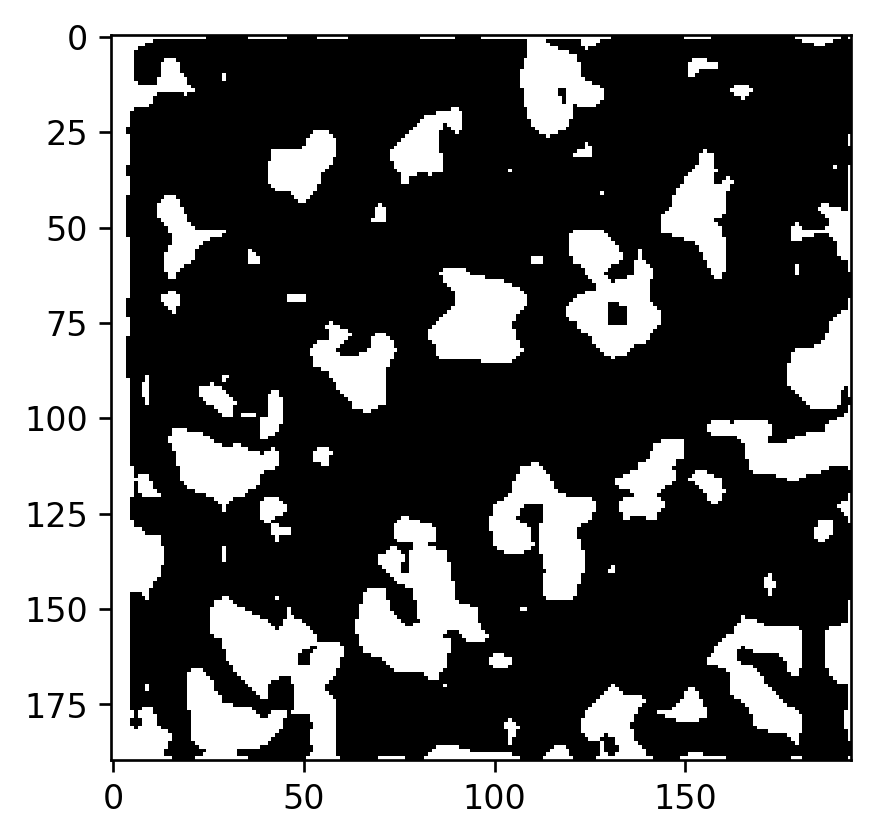

Anolis_cristatellus_images/212018Ventral-NoFlash-3.png


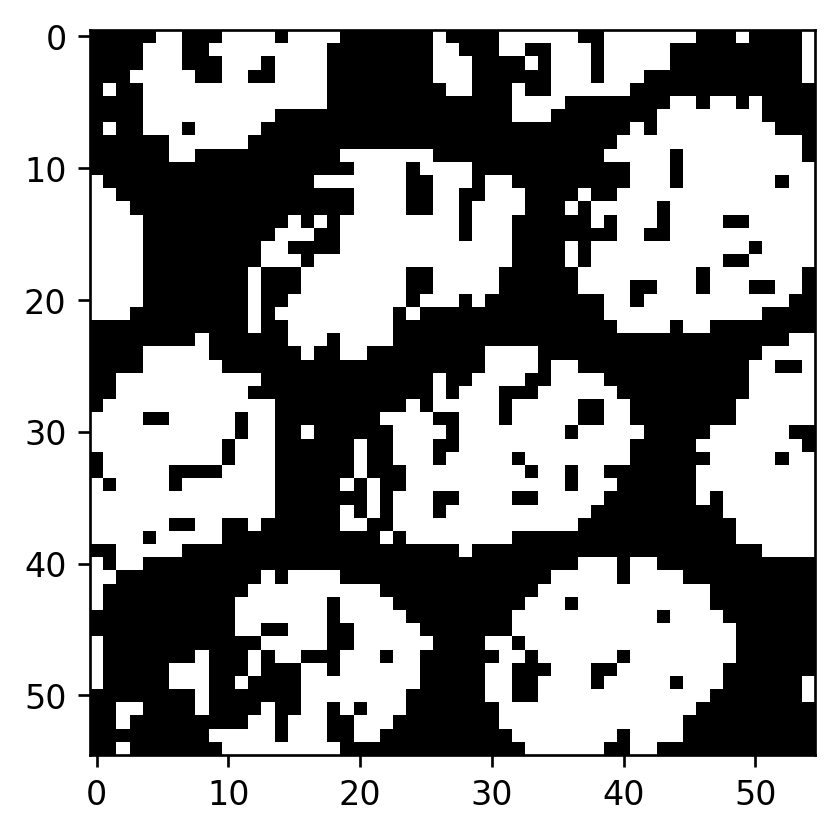

Anolis_cristatellus_images/212018Ventral-NoFlash-2.png


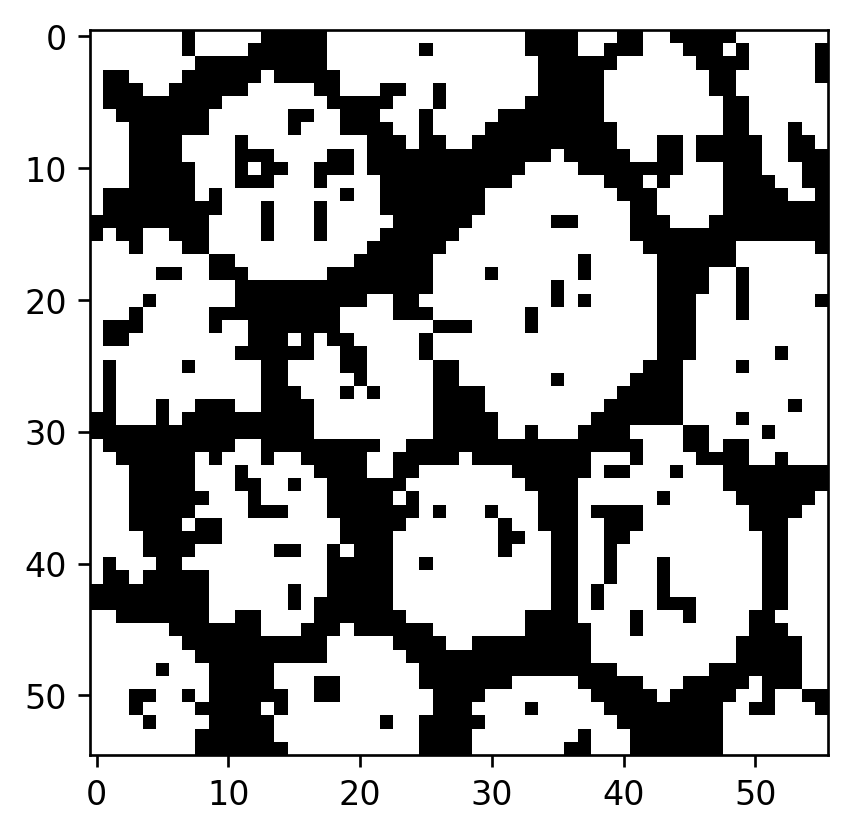

Anolis_cristatellus_images/251165Dorsal-NoFlash-2.png


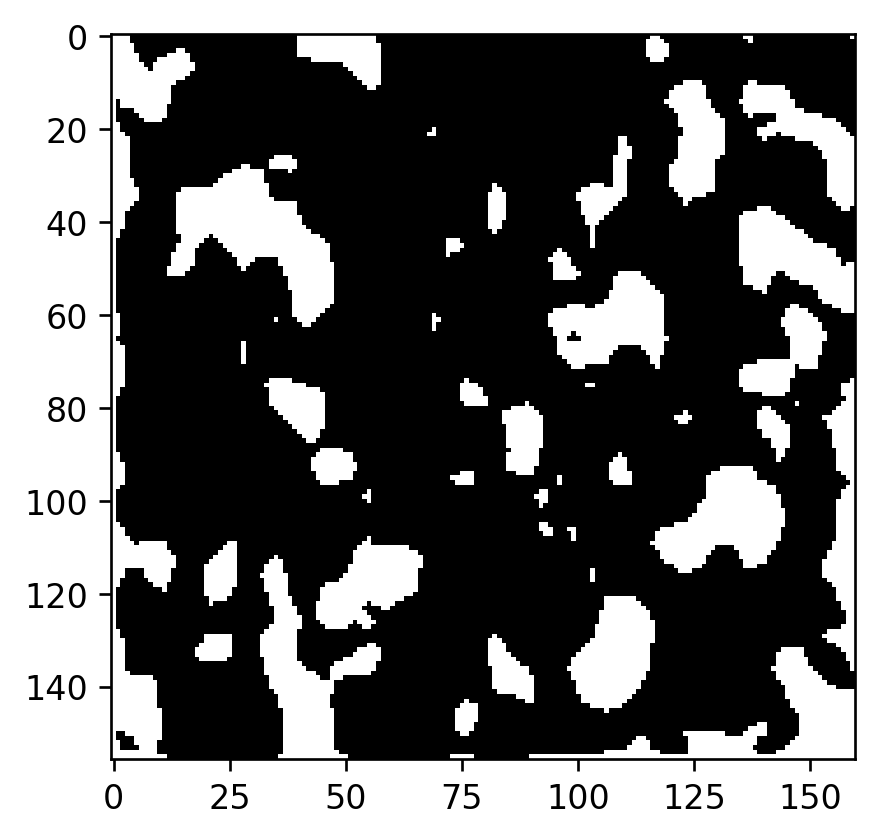

Anolis_cristatellus_images/212020Ventral-NoFlash-2.png


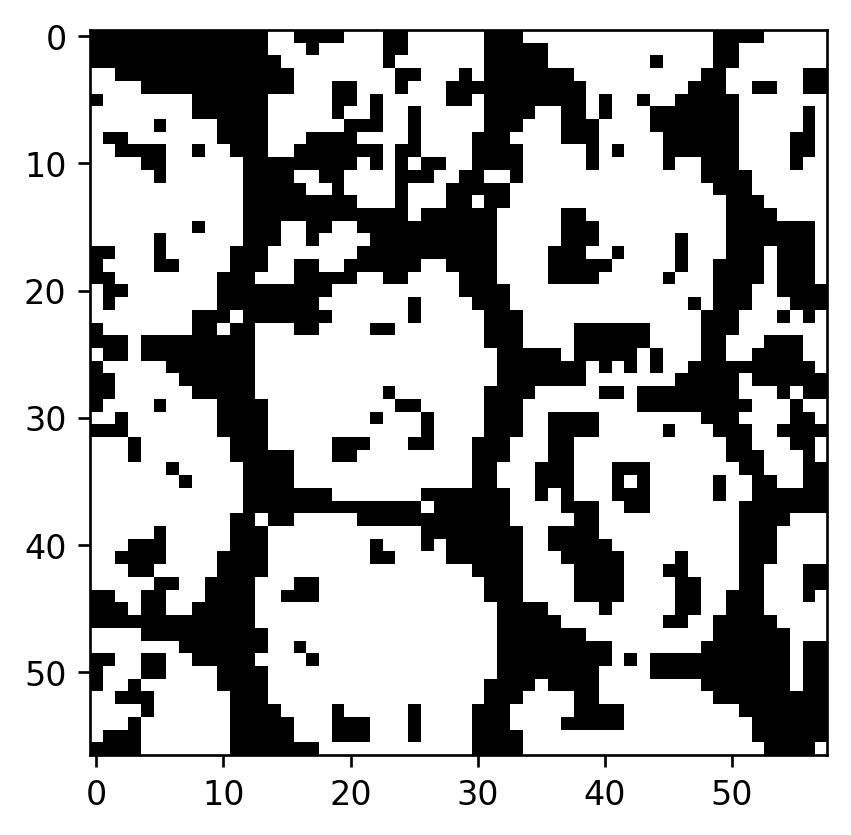

Anolis_cristatellus_images/214993Ventral-Flash-1.png


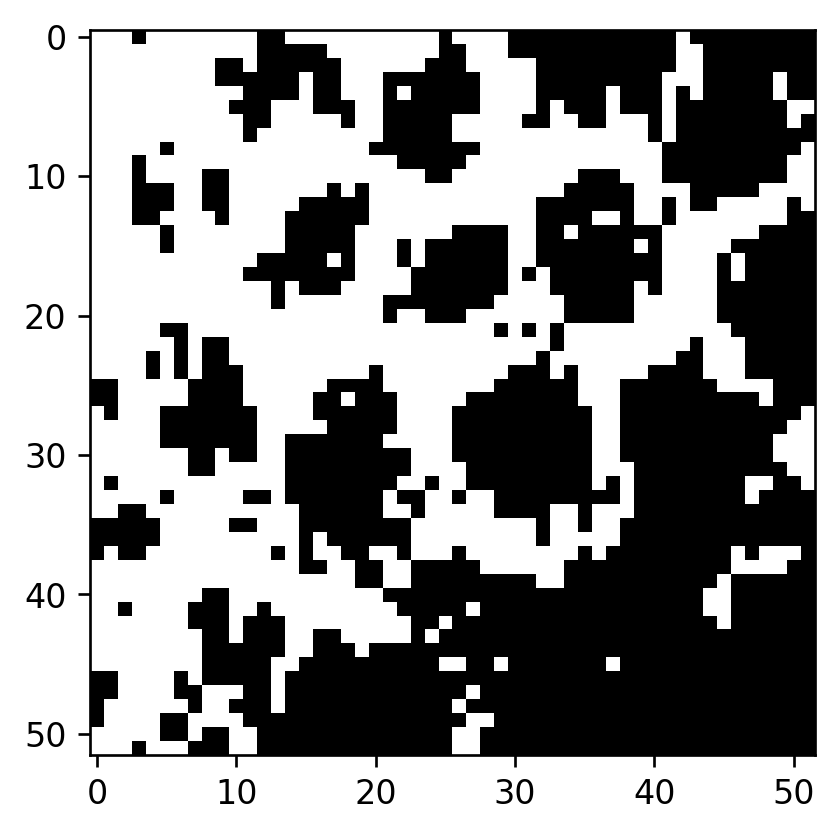

Anolis_cristatellus_images/226123Ventral-Flash-3.png


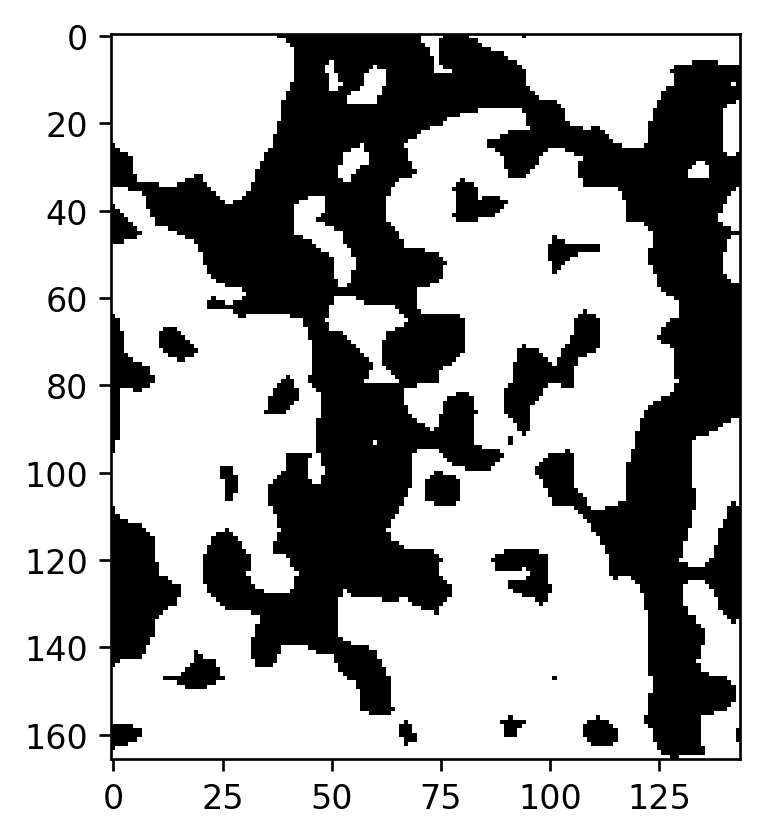

Anolis_cristatellus_images/212020Dorsal-NoFlash-3.png


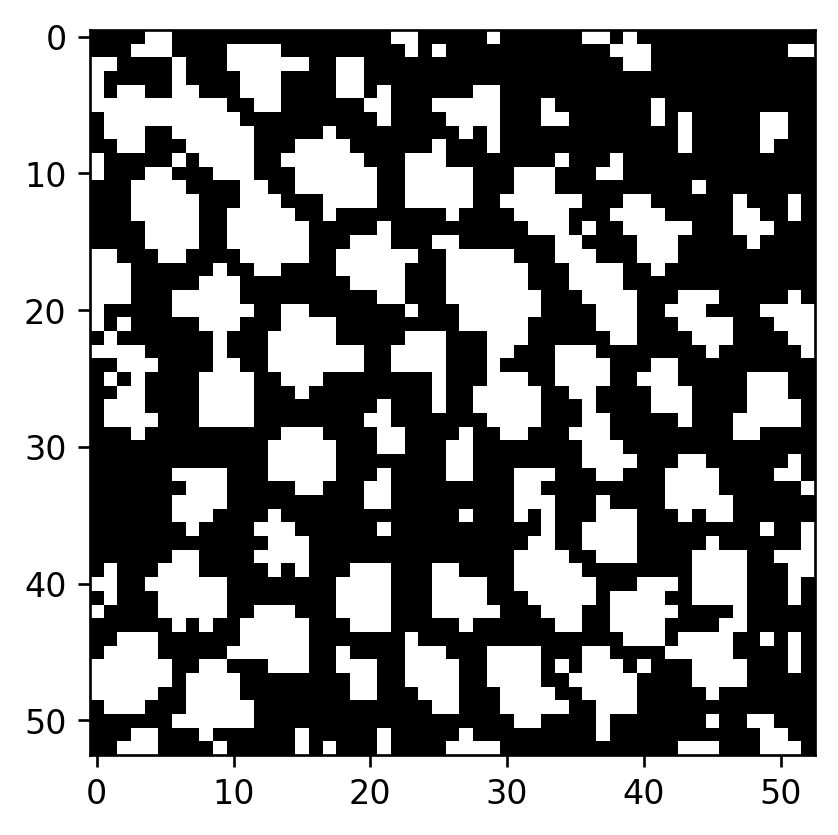

Anolis_cristatellus_images/212020Dorsal-NoFlash-2.png


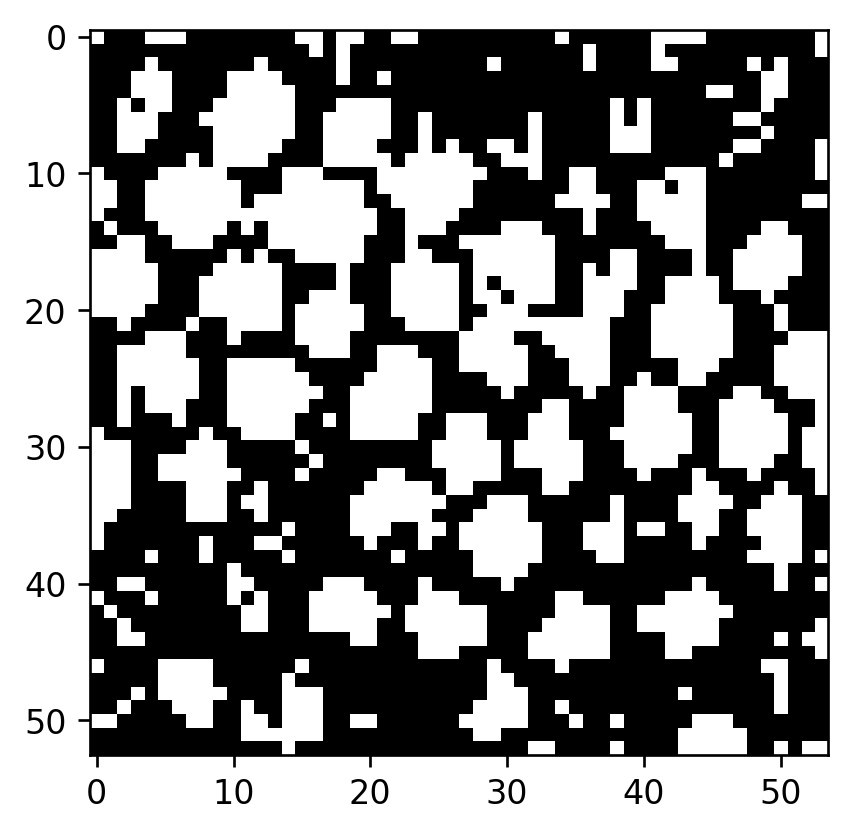

Anolis_cristatellus_images/226123Ventral-Flash-2.png


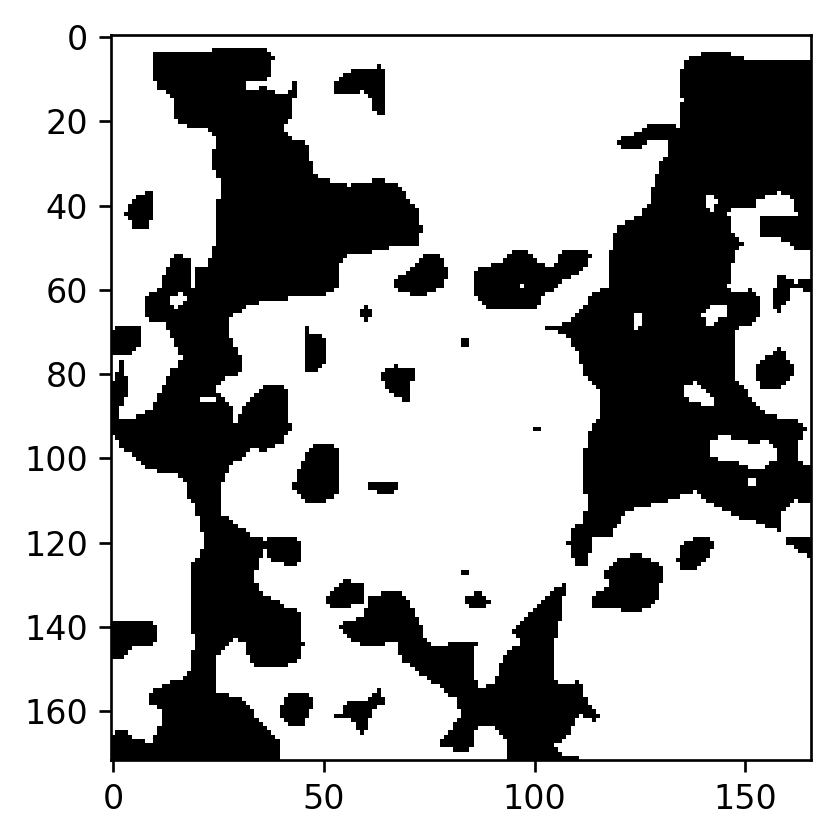

Anolis_cristatellus_images/212020Dorsal-NoFlash-1.png


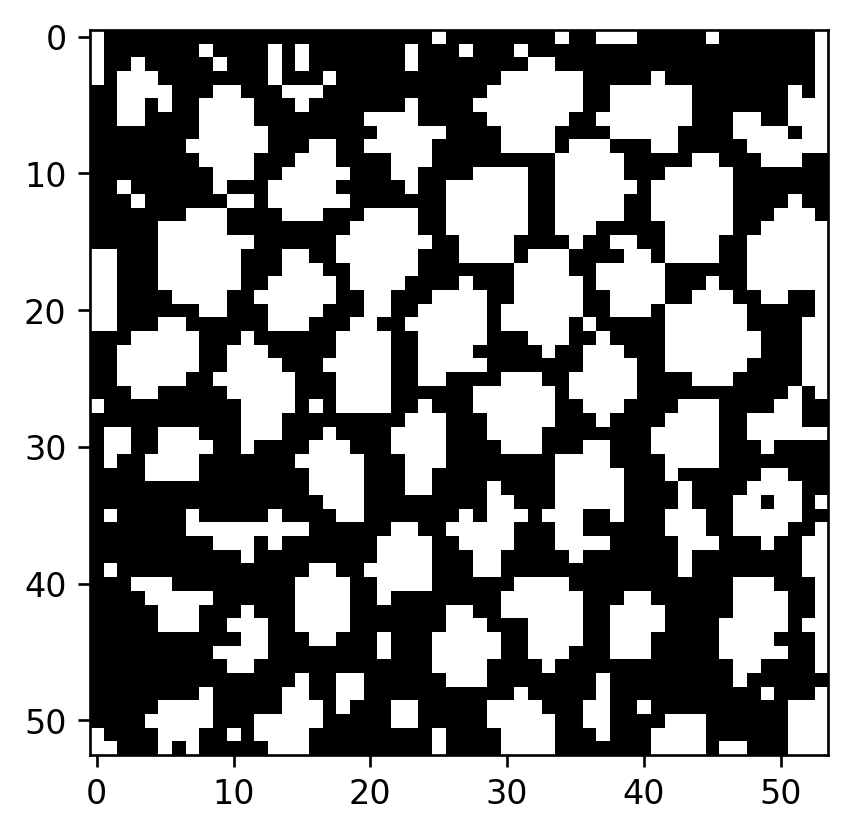

Anolis_cristatellus_images/226123Ventral-Flash-1.png


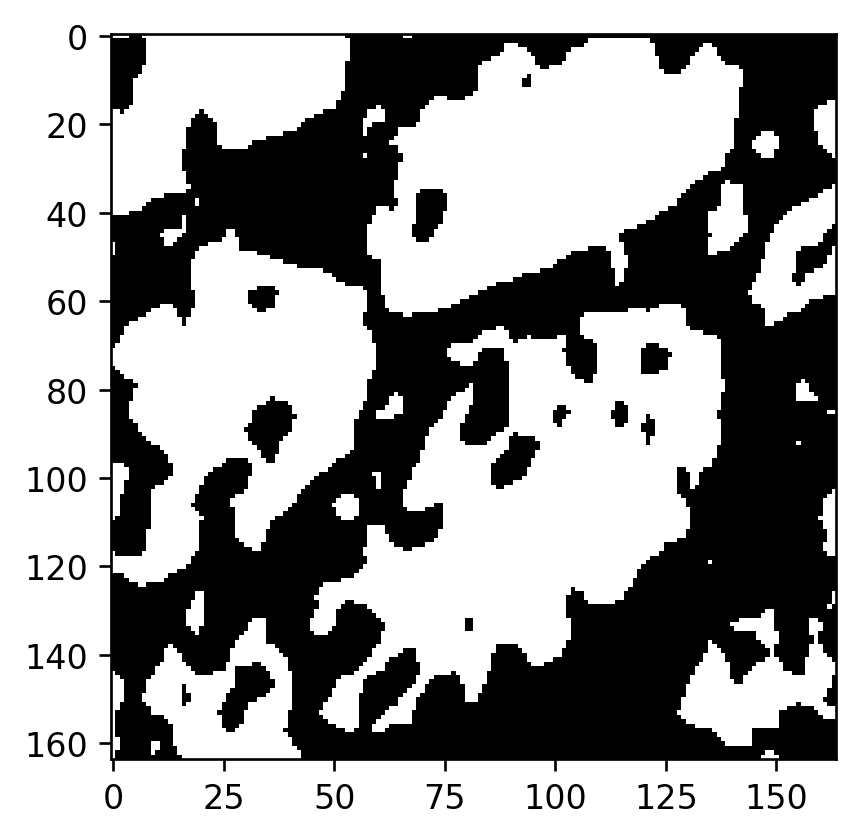

Anolis_cristatellus_images/226121Ventral-NoFlash-3.png


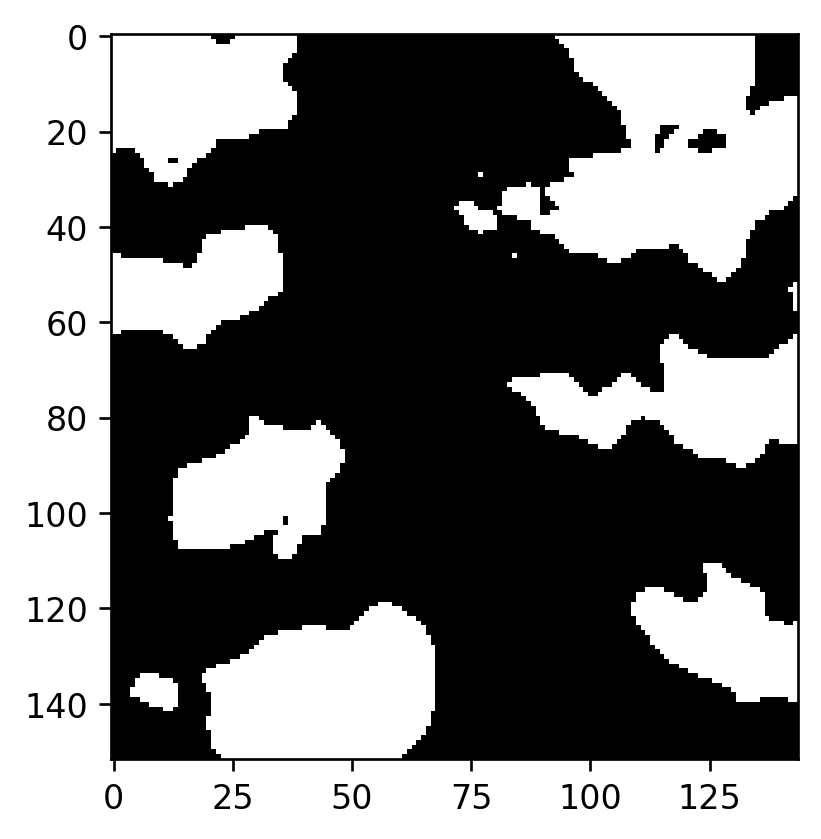

Anolis_cristatellus_images/212010Ventral-NoFlash-2.png


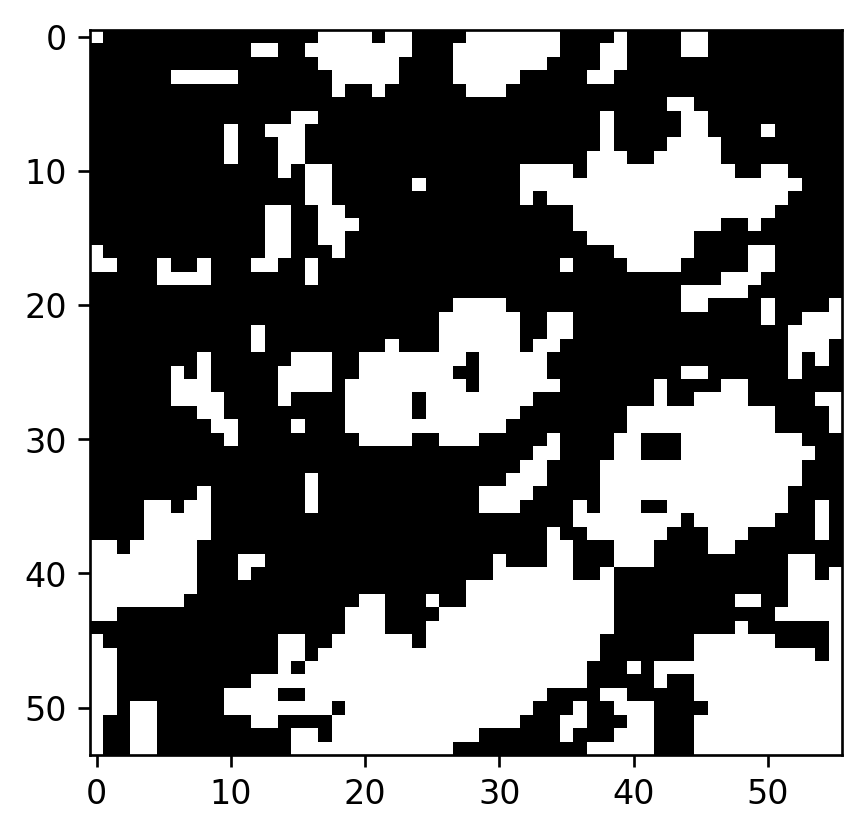

Anolis_cristatellus_images/212010Ventral-NoFlash-3.png


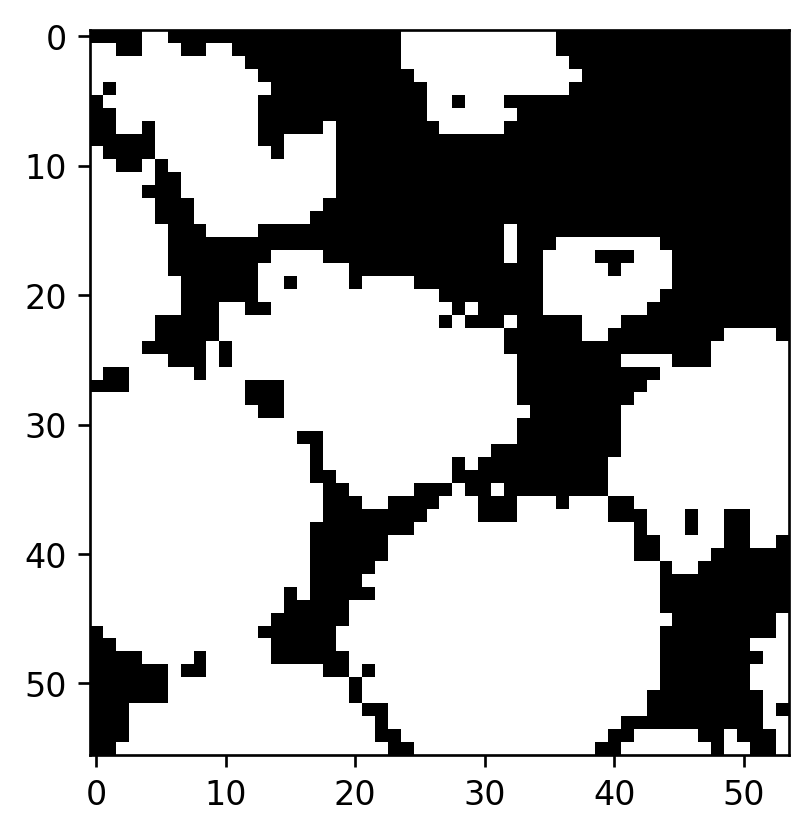

Anolis_cristatellus_images/226121Ventral-NoFlash-2.png


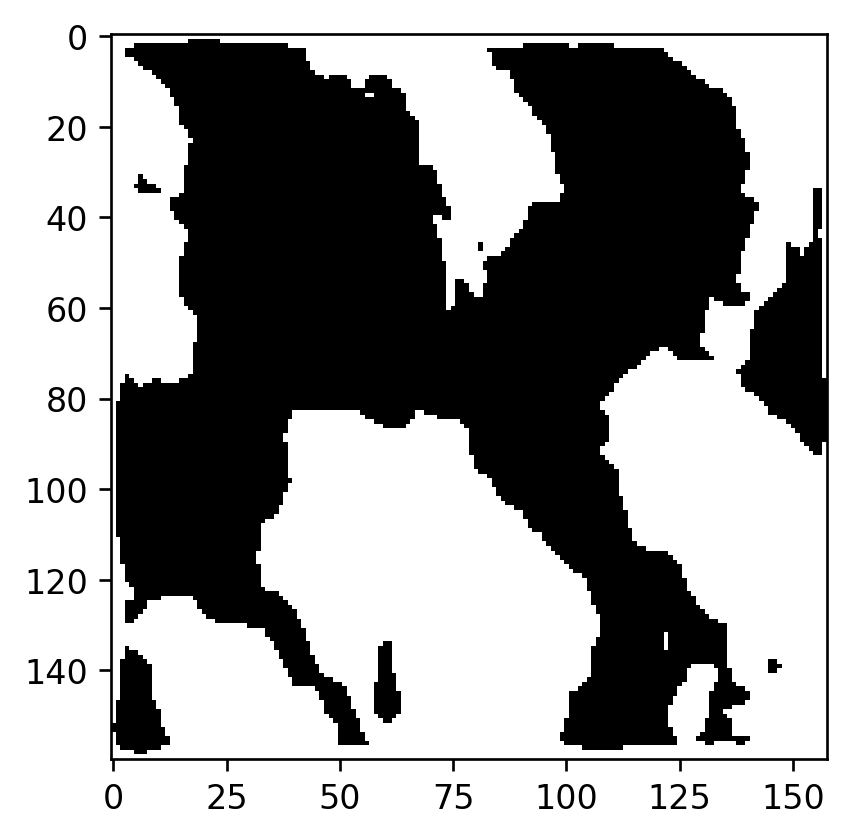

Anolis_cristatellus_images/212010Ventral-NoFlash-1.png


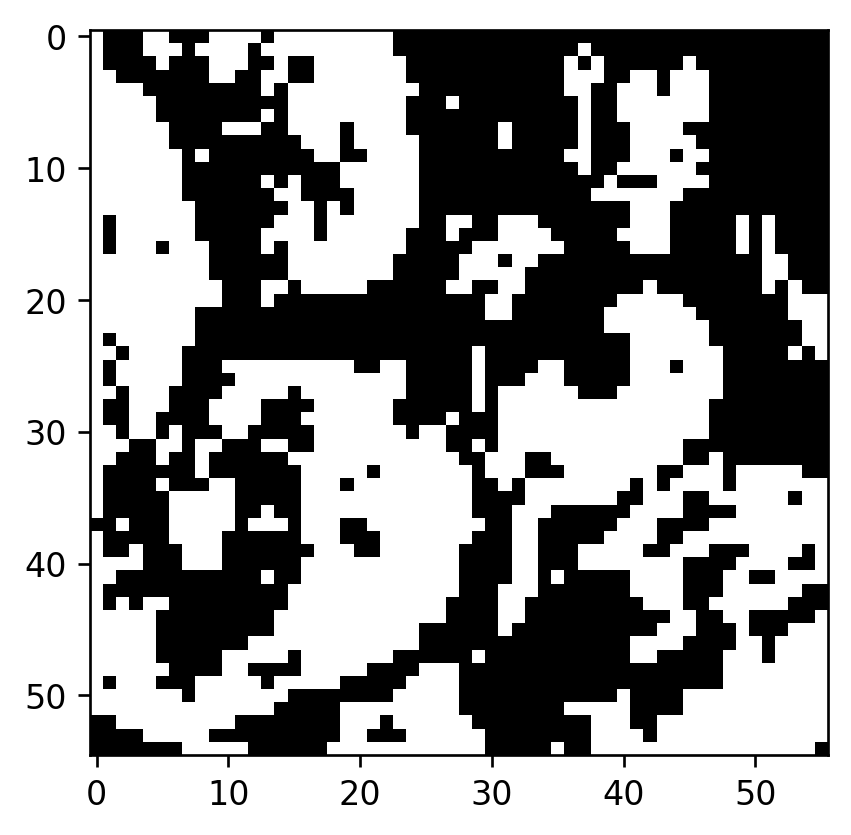

Anolis_cristatellus_images/226121Ventral-NoFlash-1.png


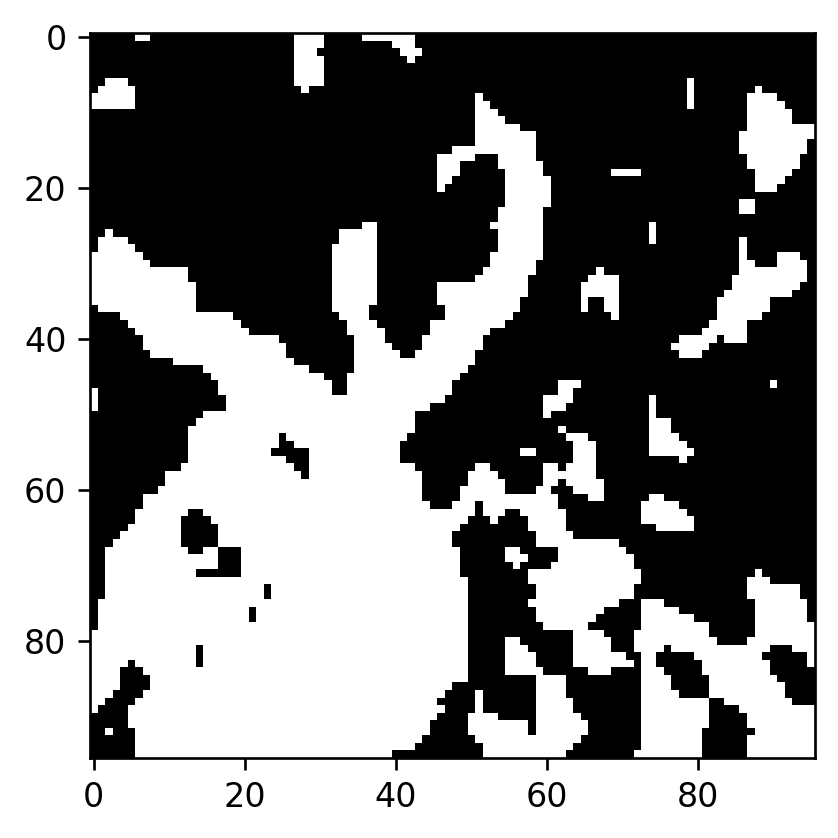

Anolis_cristatellus_images/214993Ventral-NoFlash-1.png


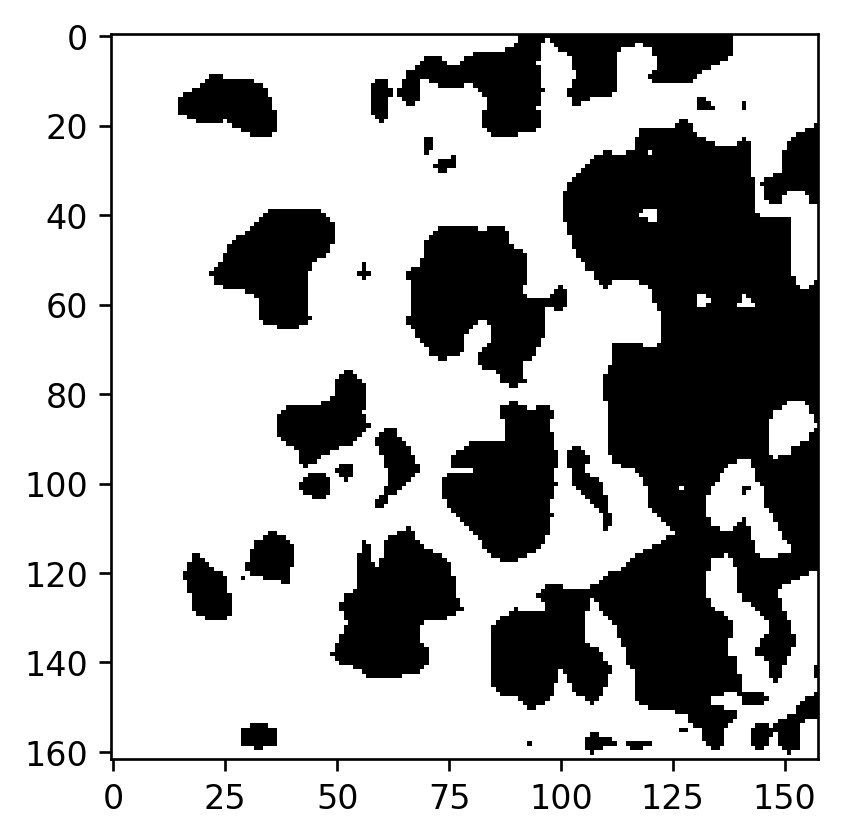

Anolis_cristatellus_images/214993Ventral-NoFlash-3.png


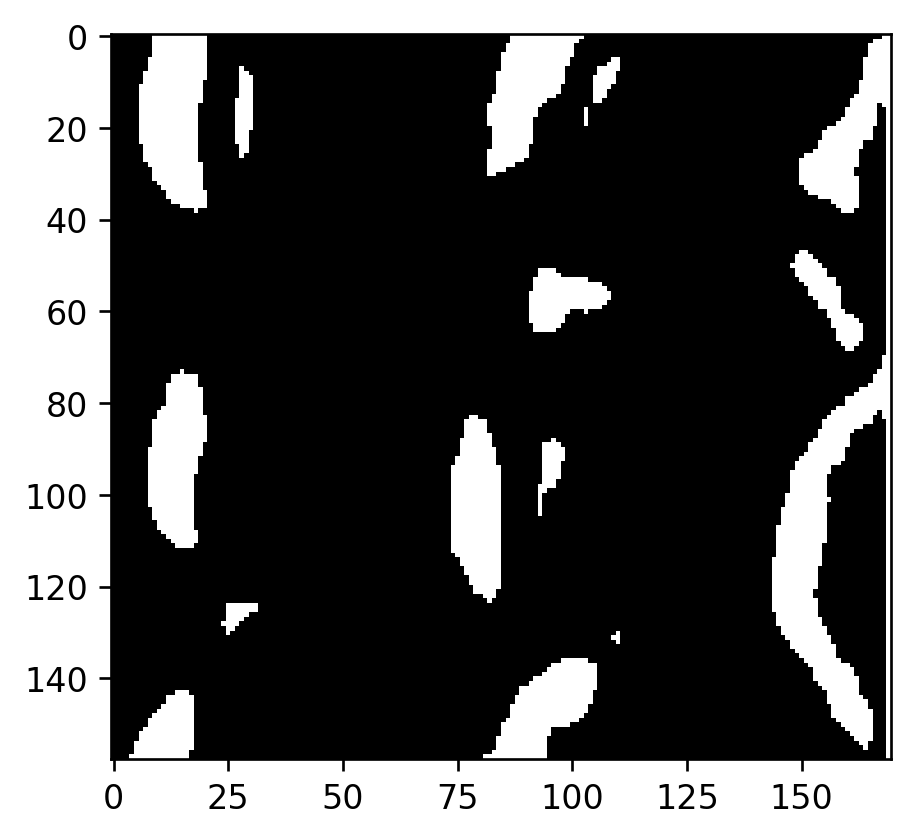

Anolis_cristatellus_images/214993Ventral-NoFlash-2.png


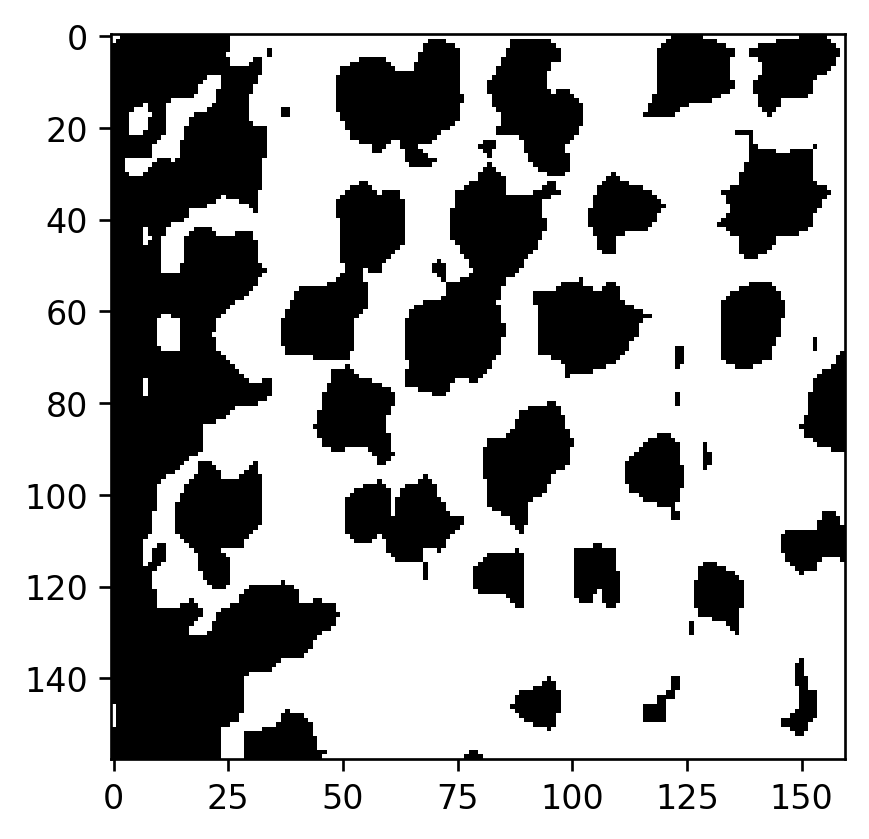

In [4]:
#a different approach: if image has gradient can we split the image up then merge them together: how would we 
#identify where to split the image? --> for loop
#how to measure "density"

heat_maps = []
for img in directory:
    img_name = img.name
    if (img_name != '.ipynb_checkpoints'):
        print(dirname + img_name + "")
        
        orig_img = cv2.imread(dirname + img_name)
        gray = cv2.cvtColor(orig_img, cv2.COLOR_BGR2GRAY)
        img = gray

        ret, thresh = cv2.threshold(img, 0 , 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        #true color of image in RGB
        color = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

        img = thresh
        plt.imshow(img, "gray")
        plt.show()
        images.append(img )        

In [5]:
average_size = []
def centroids(img):
    sizes_of_scales = []
    num_scales_and_average_size = []
    total_stats = []

    binary_map = (img > 0).astype(np.uint8)
    connectivity = 4 # or whatever you prefer
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S) 
    num_labels = output[0]

    # The second cell is the label matrix
    labels = output[1]
    # The third cell is the stat matrix
    stats = output[2]
    # The fourth cell is the centroid matrix
    centroids = output[3]

    sizes_of_scales.append((stats[1:,-1]))
    num_scales_and_average_size.append(([num_labels, np.average(stats[1:,-1])]))
    average_size.append(np.average(stats[1:,-1]))
    total_stats.append([num_labels, stats[1:,-1], stats[1:,-1]])
    
    return centroids
    

In [6]:
def heat_map(img, centroids):
    heat = np.zeros(img.shape)    
    img = heat
    for i in range(len(centroids)):## draw pixels
        x = centroids[i][1].astype(int)
        y = centroids[i][0].astype(int)
        heat[x - 3, y - 3] += 200
    return heat

In [7]:
def display(heat_maps):
    for img in heat_maps:
        plt.imshow(img)
    plt.show()

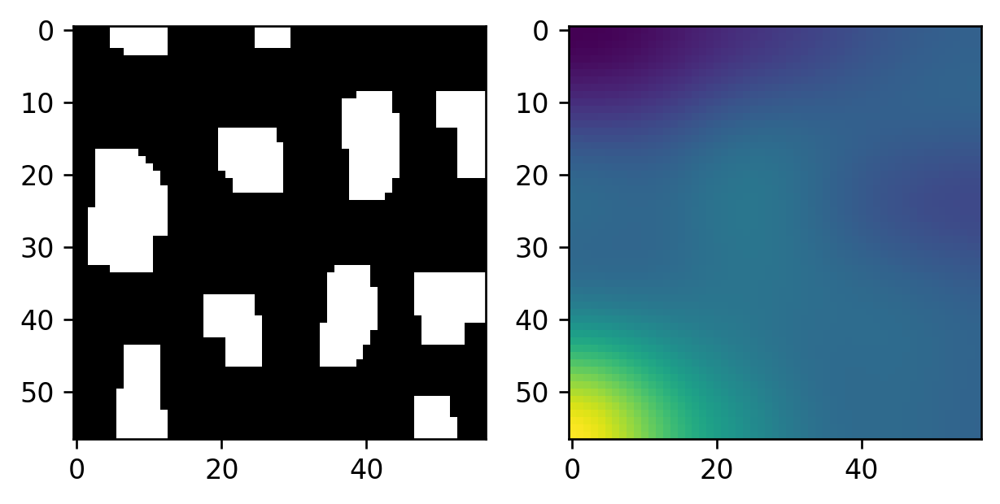

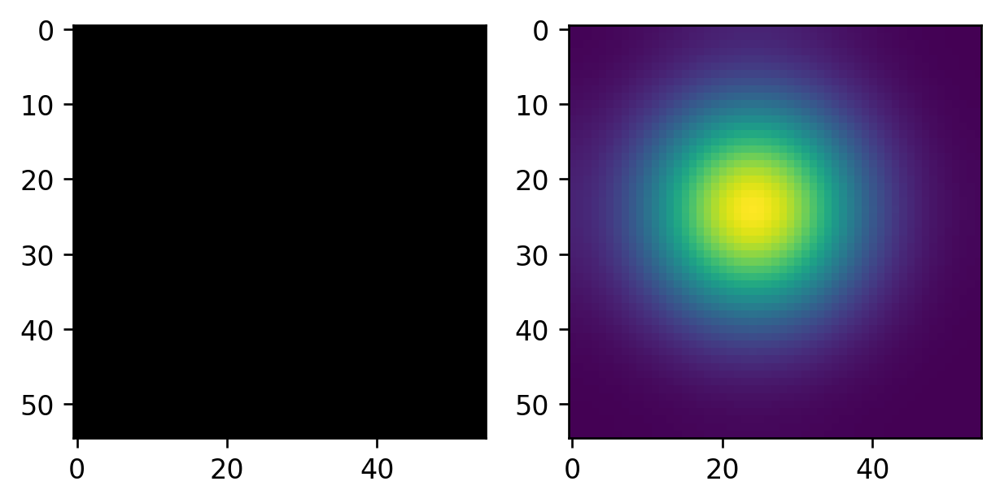

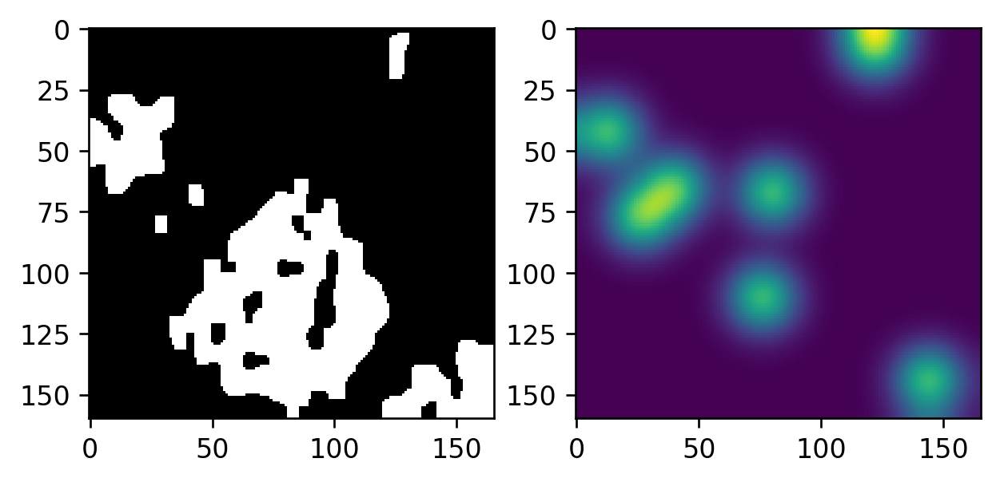

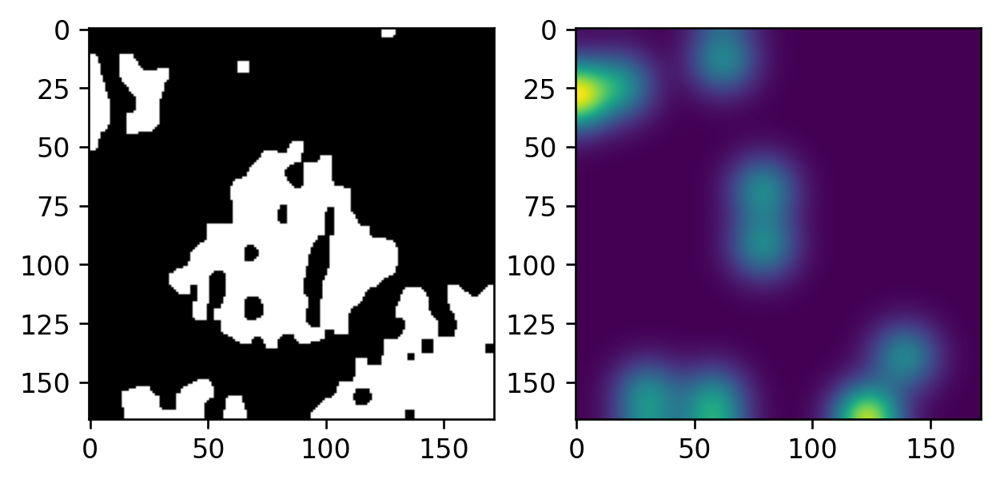

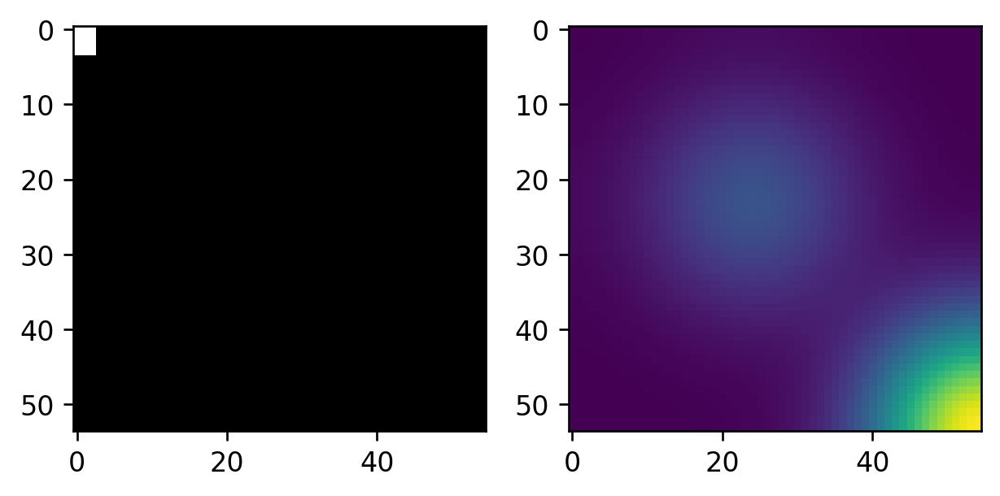

...

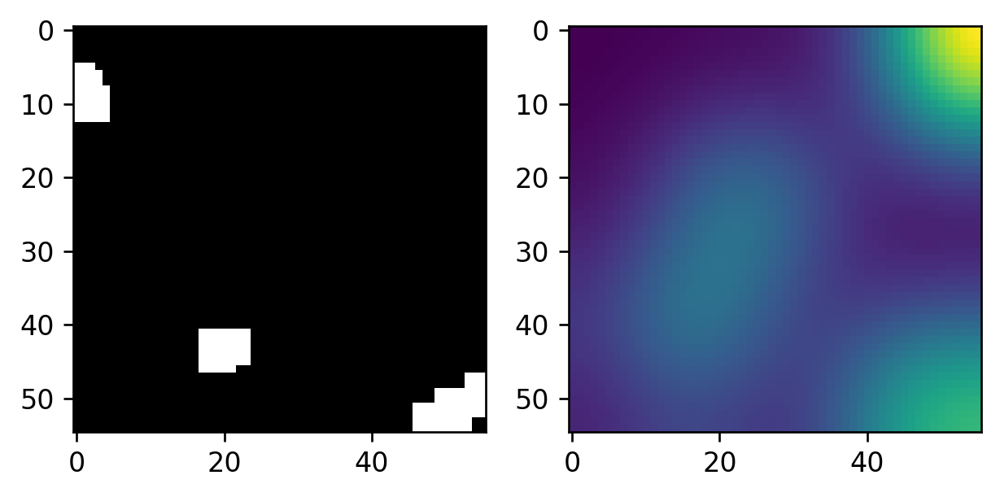

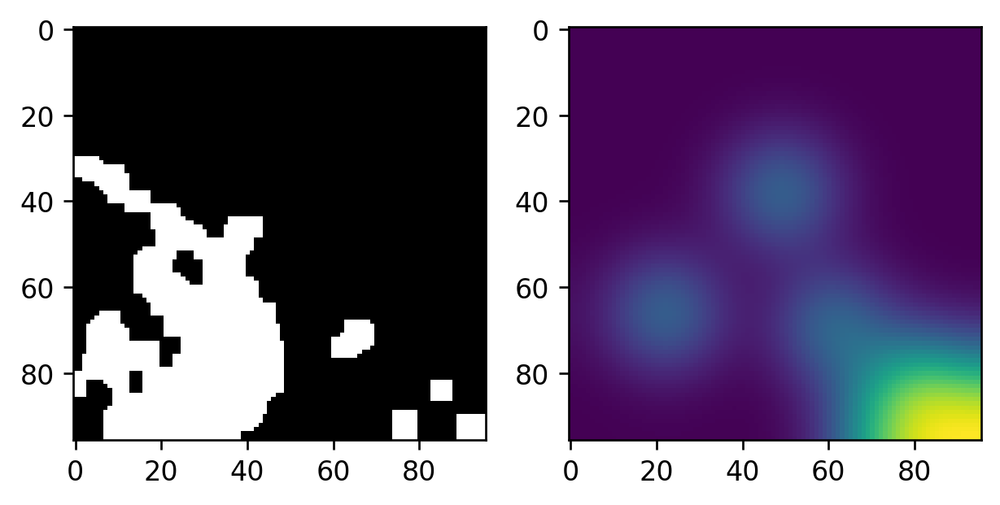

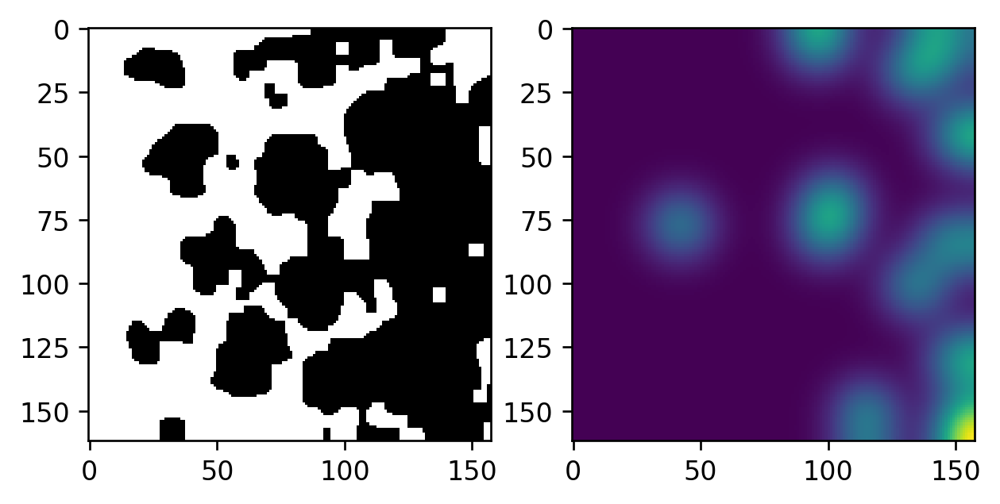

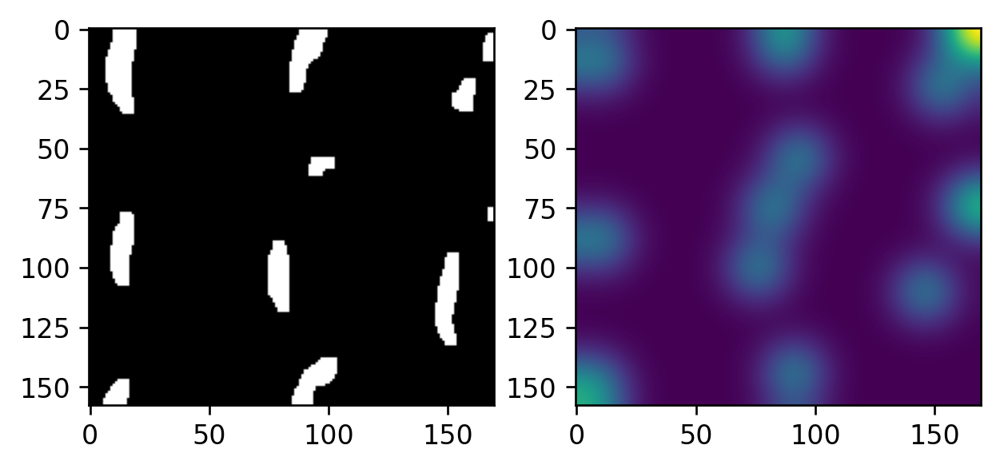

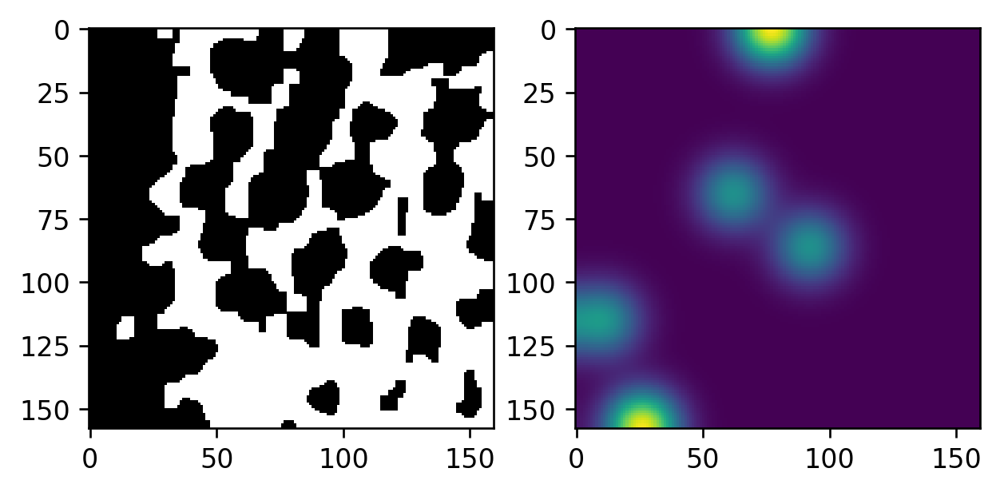

In [8]:
#access img directory
dirname = 'Anolis_cristatellus_images/'

from scipy.ndimage.filters import gaussian_filter

centers = []
thr_images = []
#create an iterator object for img directory
directory = os.scandir(dirname)
for img in directory:
    img_name = img.name
    if (img_name != '.ipynb_checkpoints'):
        
        orig_img = cv2.imread(dirname + img_name)
        gray = cv2.cvtColor(orig_img, cv2.COLOR_BGR2GRAY)
        img = gray

        ret, thresh = cv2.threshold(img, 0 , 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        kernel = np.ones((3,3),np.uint8)

        #if the customized iteration number has not yet been determined this if statement will run

        opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 3)

        # sure background area
        sure_bg = cv2.dilate(opening,kernel,iterations=1)

        dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
        ret, sure_fg = cv2.threshold(dist_transform, 1.5, 255, 0) 

        # Finding unknown region
        sure_fg = np.uint8(sure_fg)
        unknown = cv2.subtract(sure_bg,sure_fg)

        c = centroids(sure_fg)
        hm = heat_map(sure_fg, c)
        
        thr_images.append(sure_fg)
        plt.subplot(1,2,1), plt.imshow(sure_fg, 'gray')
        hm = gaussian_filter(hm, (10, 10))
        plt.subplot(1,2,2), plt.imshow(hm)
        
        centers.append(c)
        
        plt.show()



            
            
            


In [9]:
#to see uniformity can look at the distribution of the surrounding points

In [10]:
#ideas?

split an image until it is uniform??
Then use that to determine block size?

Object `uniform` not found.
Object `size` not found.


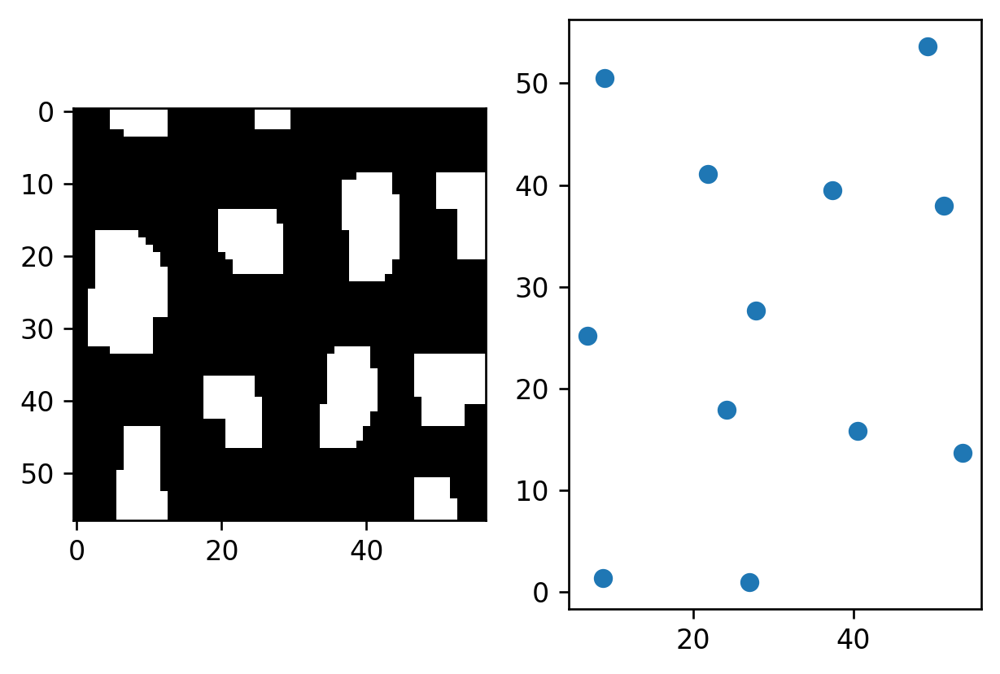

2.5758790290398874
[14.684273311802274]


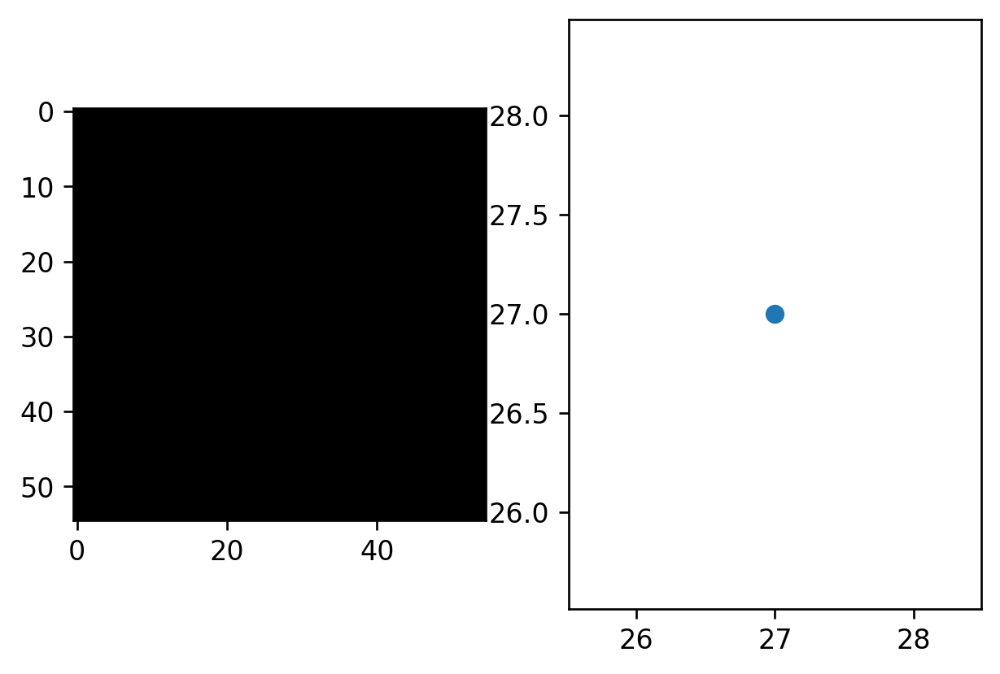

nan
[14.684273311802274, inf]


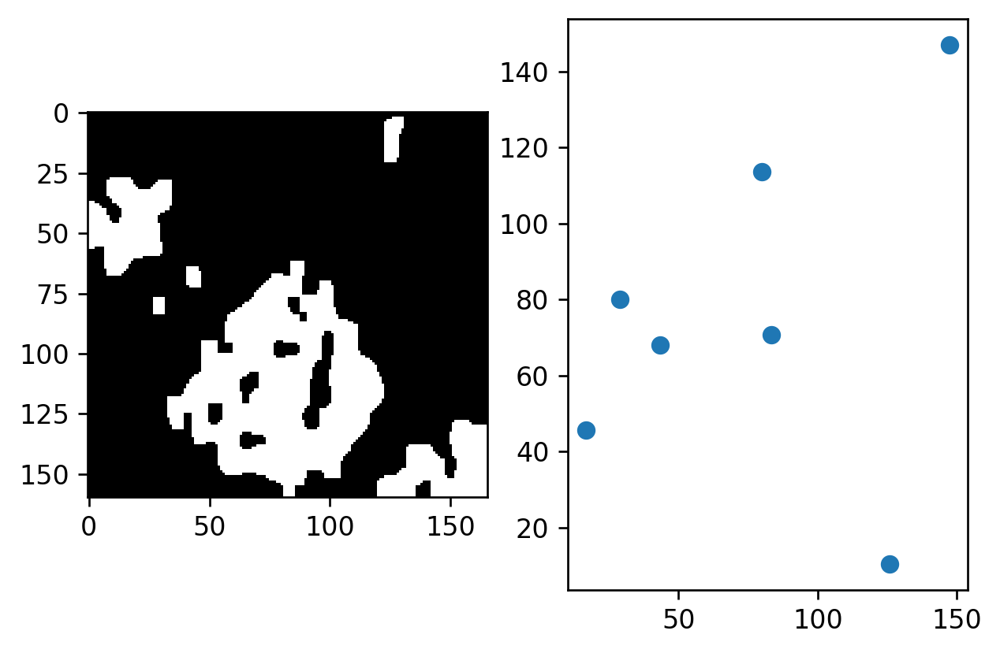

21.541500615994416
[14.684273311802274, inf, 43.49539165079401]


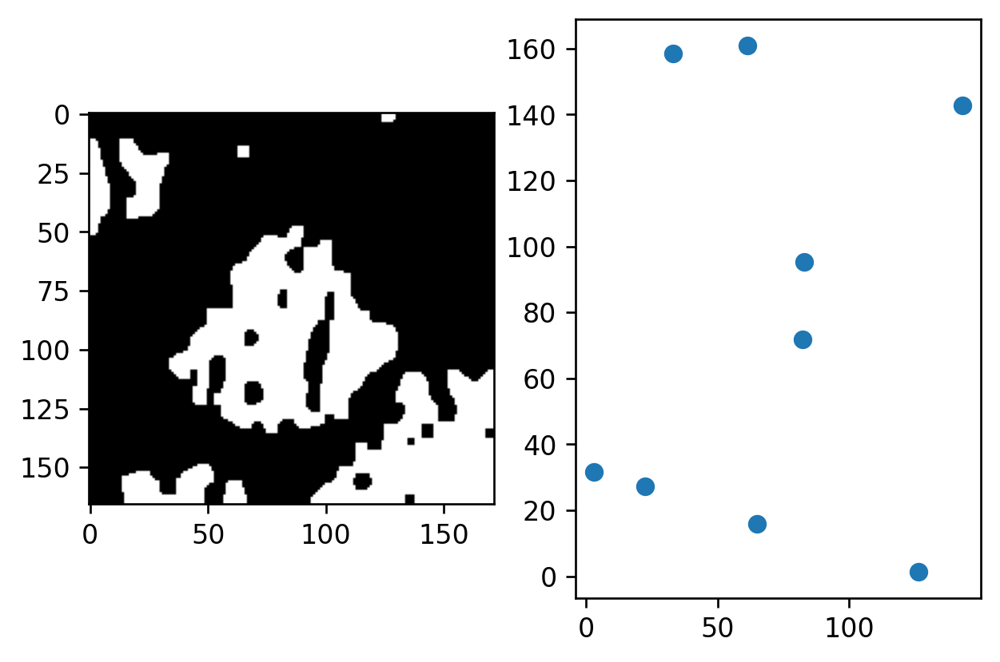

19.41172552526167
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719]


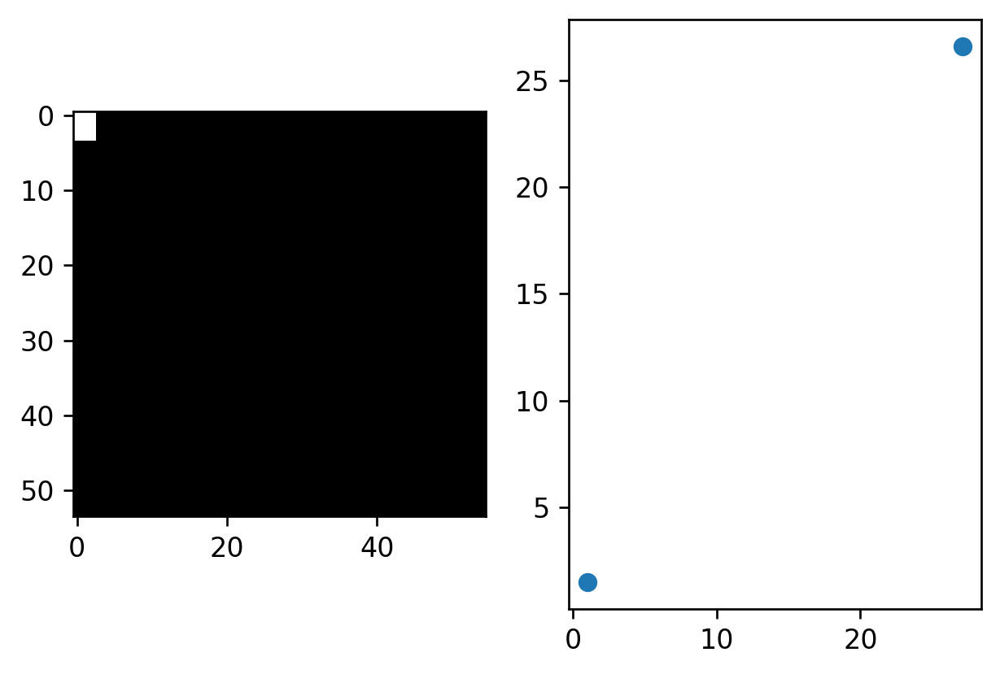

0.0
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387]


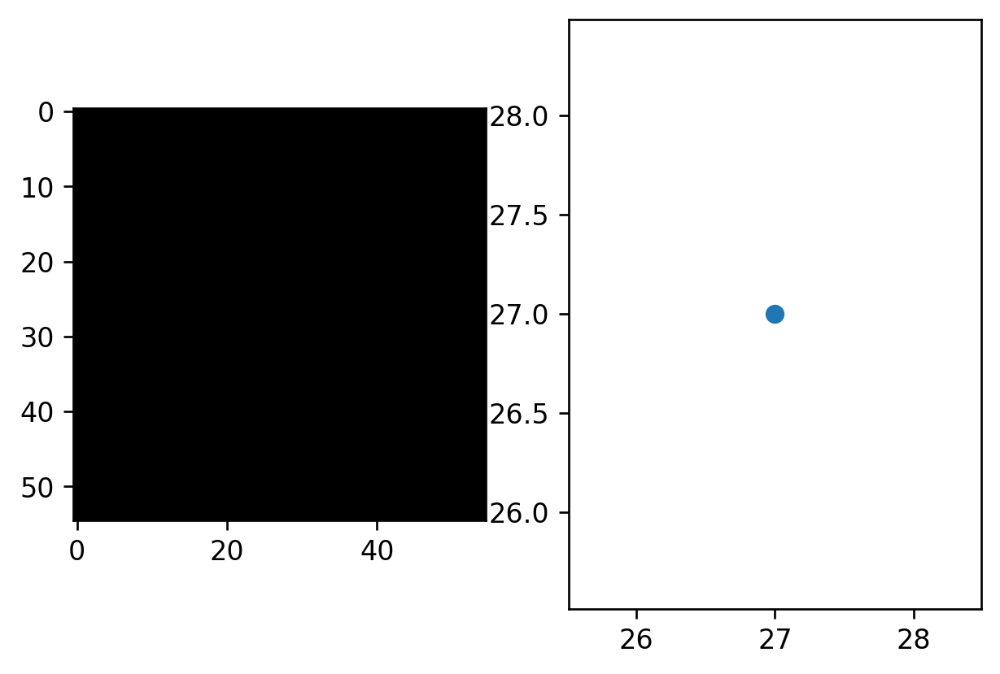

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf]


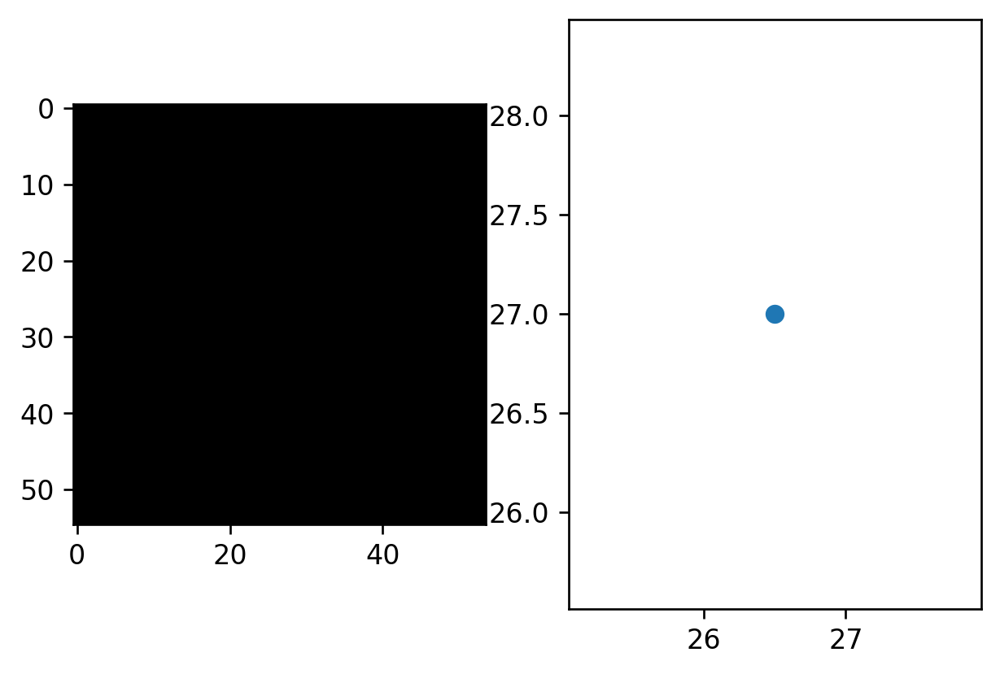

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf]


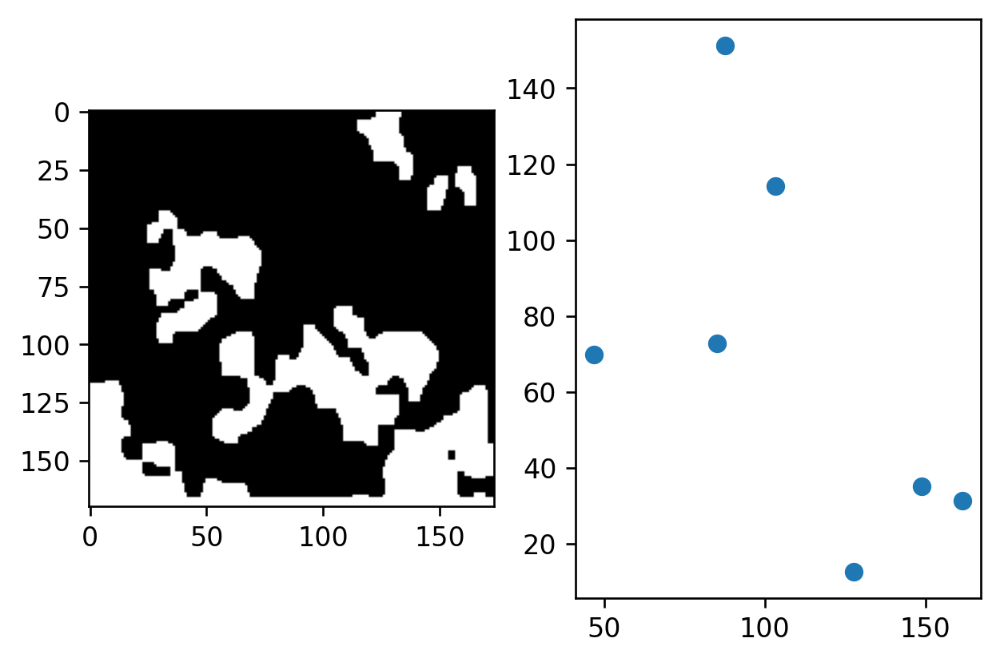

11.456373341260953
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315]


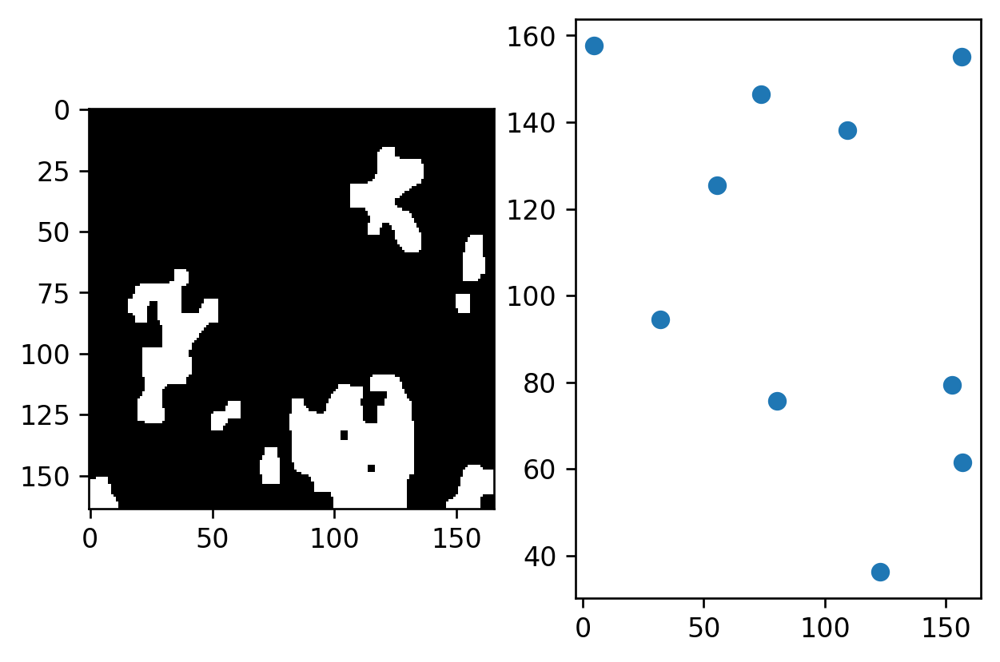

13.491095010609978
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832]


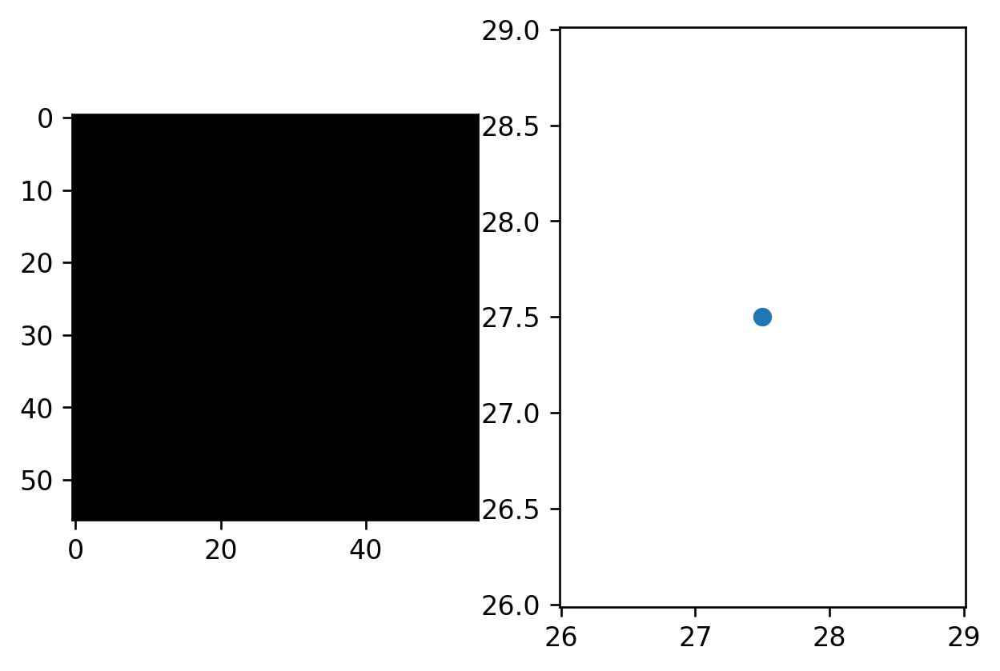

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf]


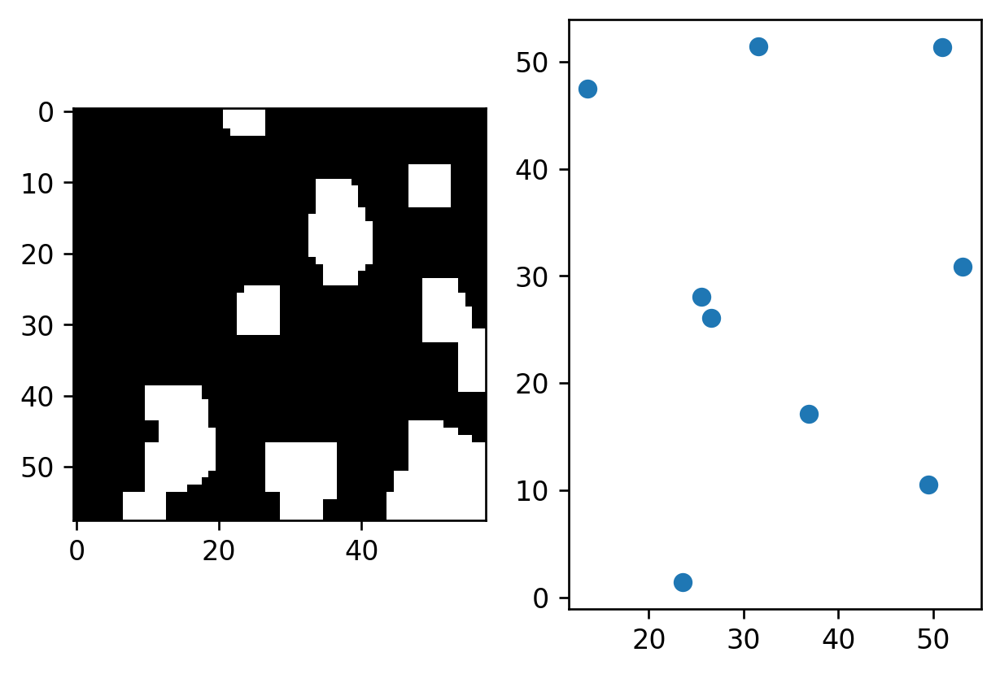

6.92764551685017
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515]


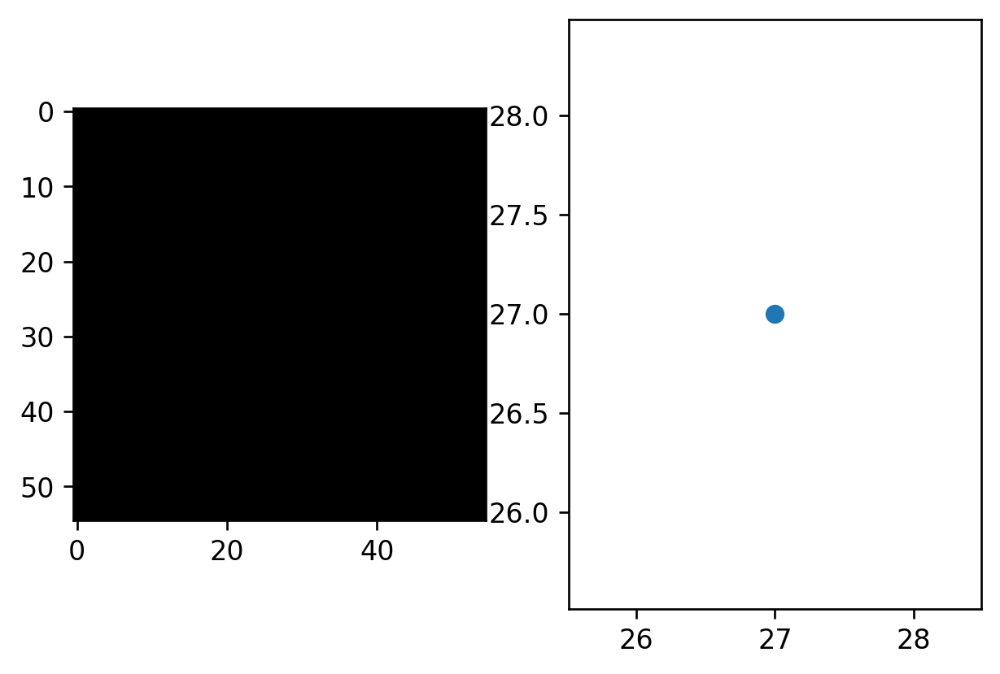

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf]


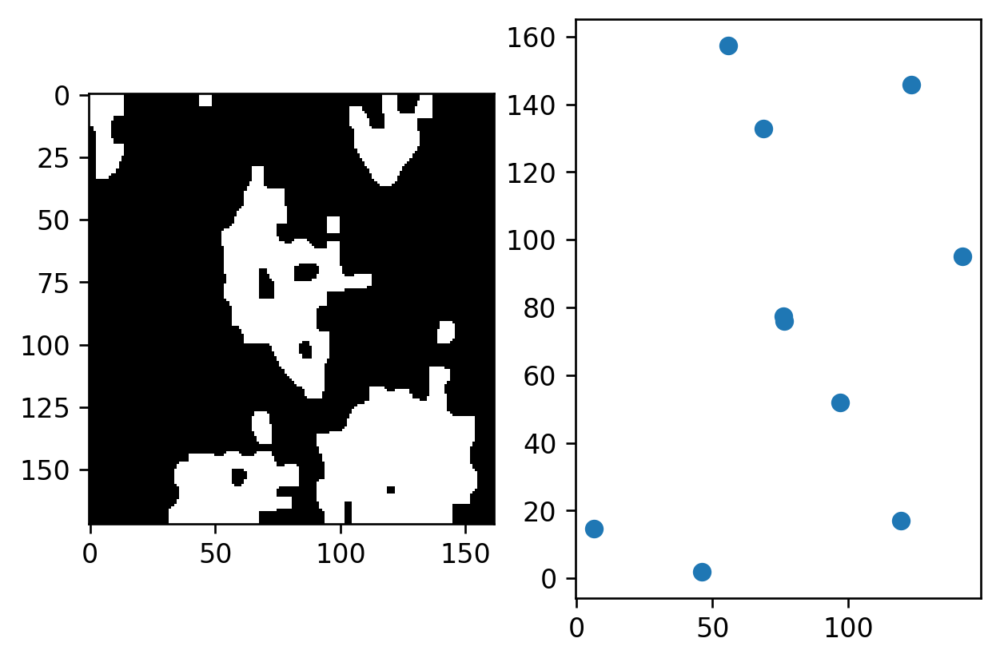

17.80037547575856
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574]


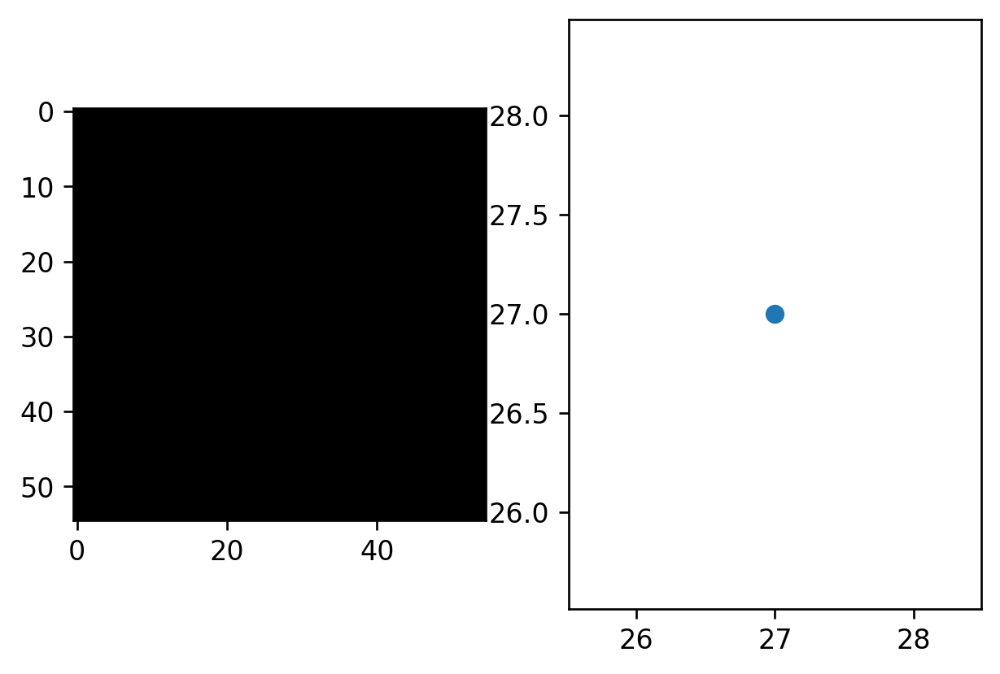

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf]


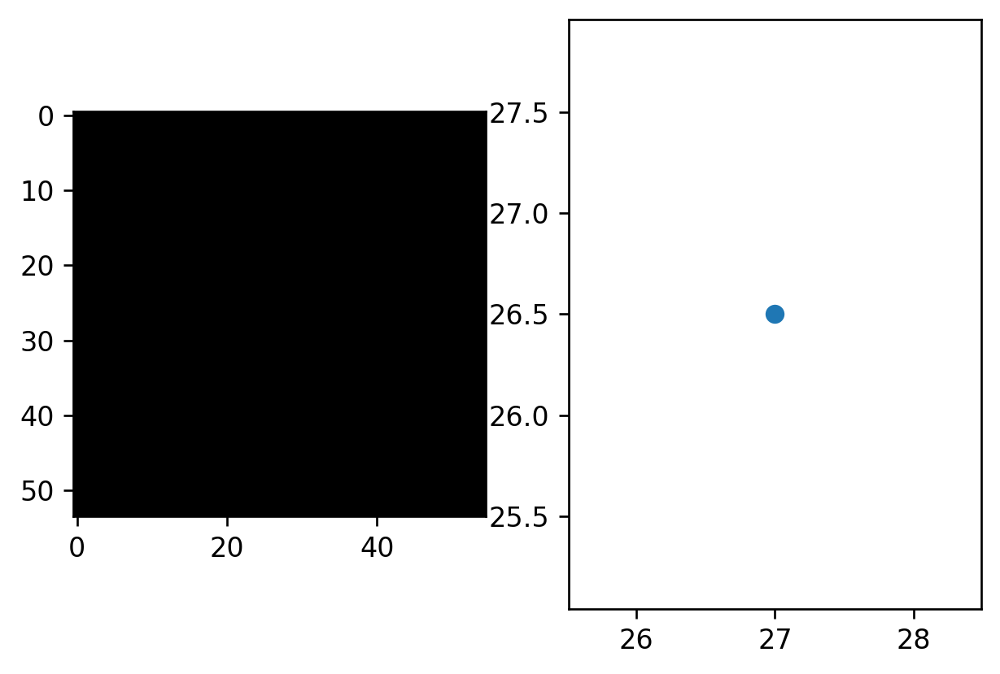

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf]


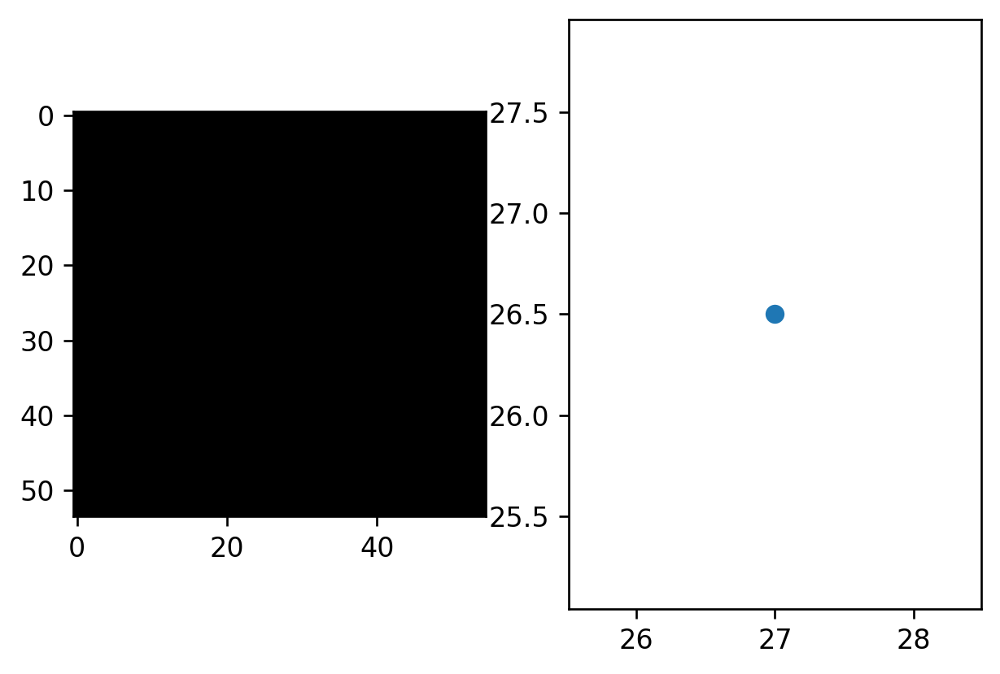

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf]


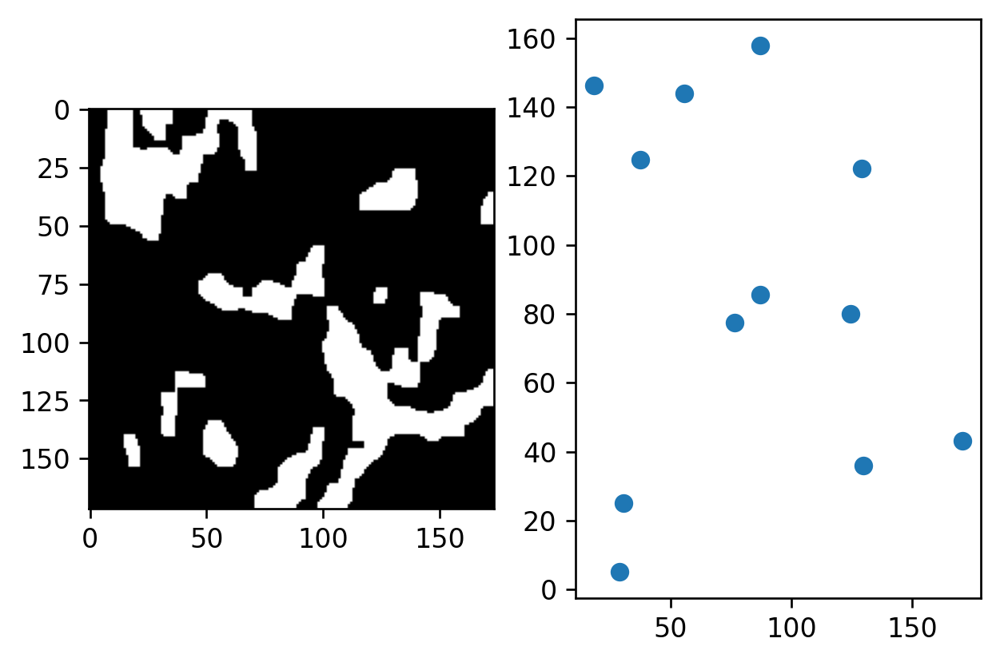

10.390962034693818
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024]


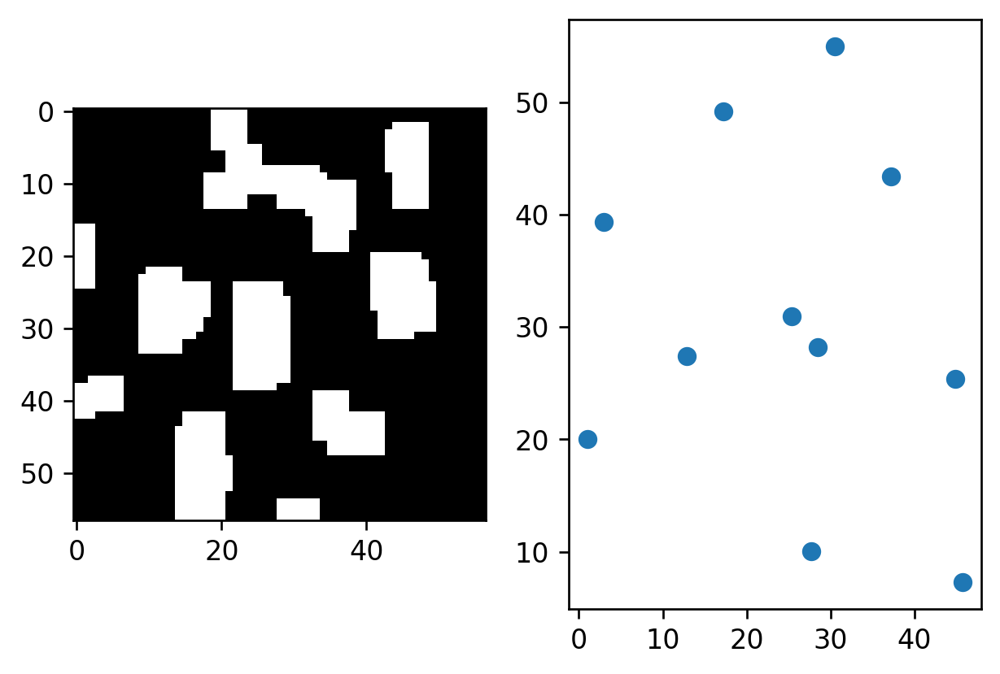

4.595258263546359
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067]


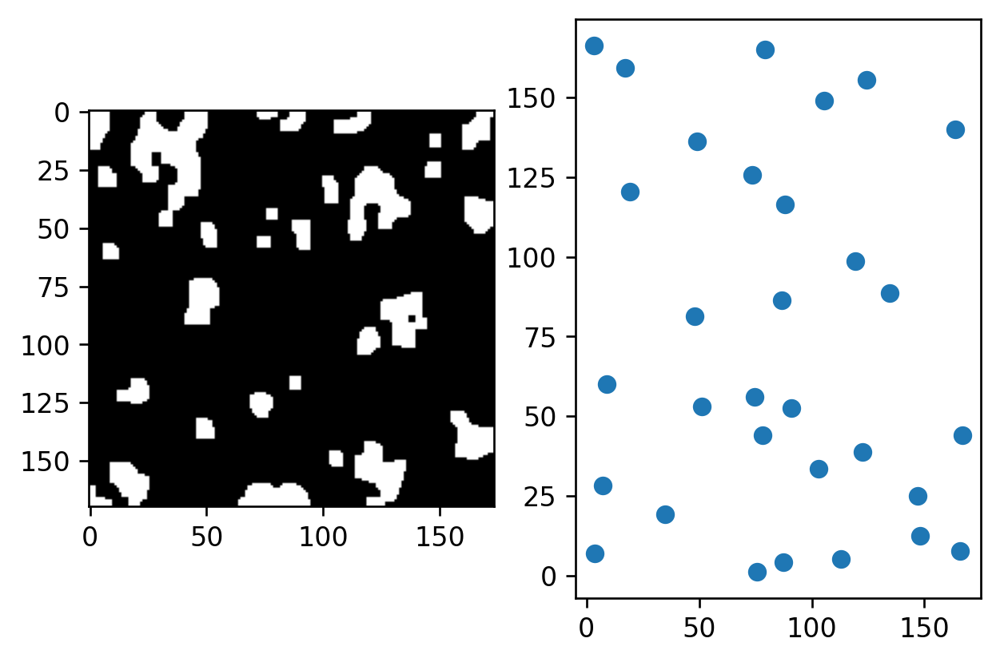

7.484572563786996
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608]


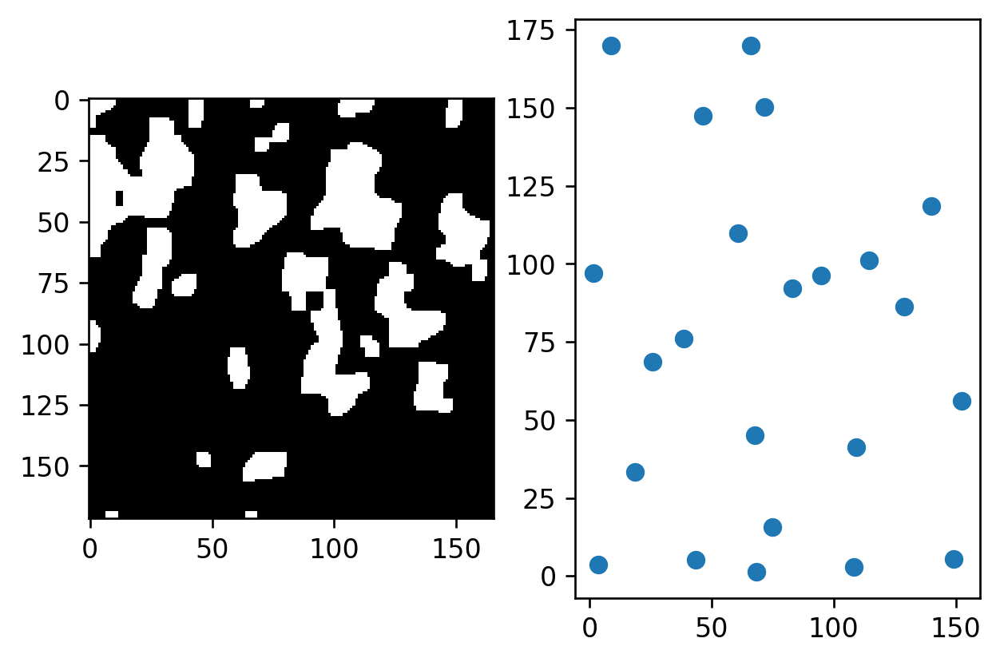

9.653569050079893
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613]


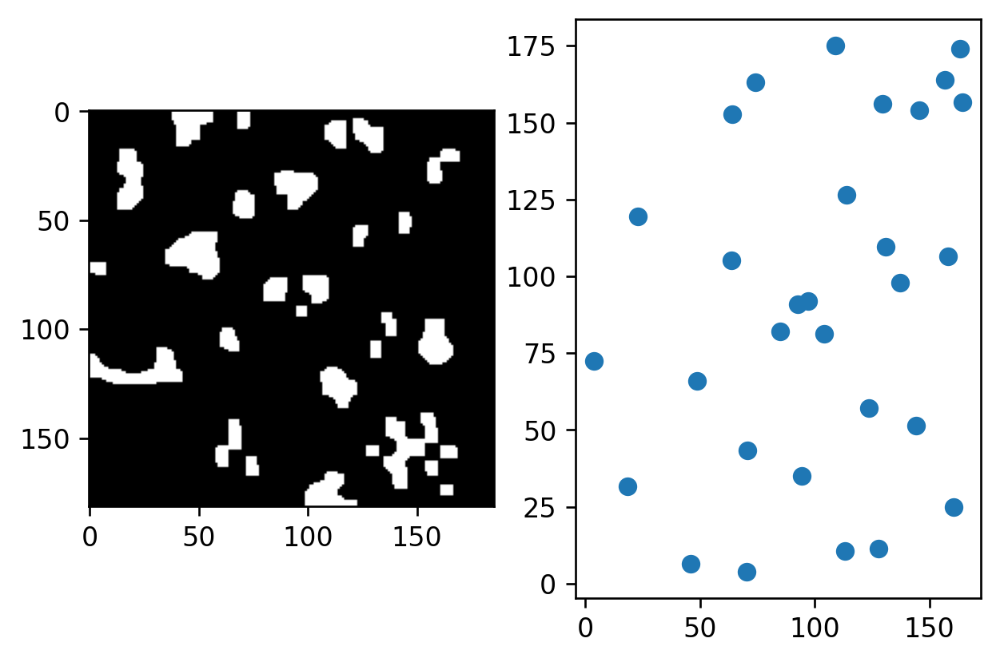

10.077611200539444
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607]


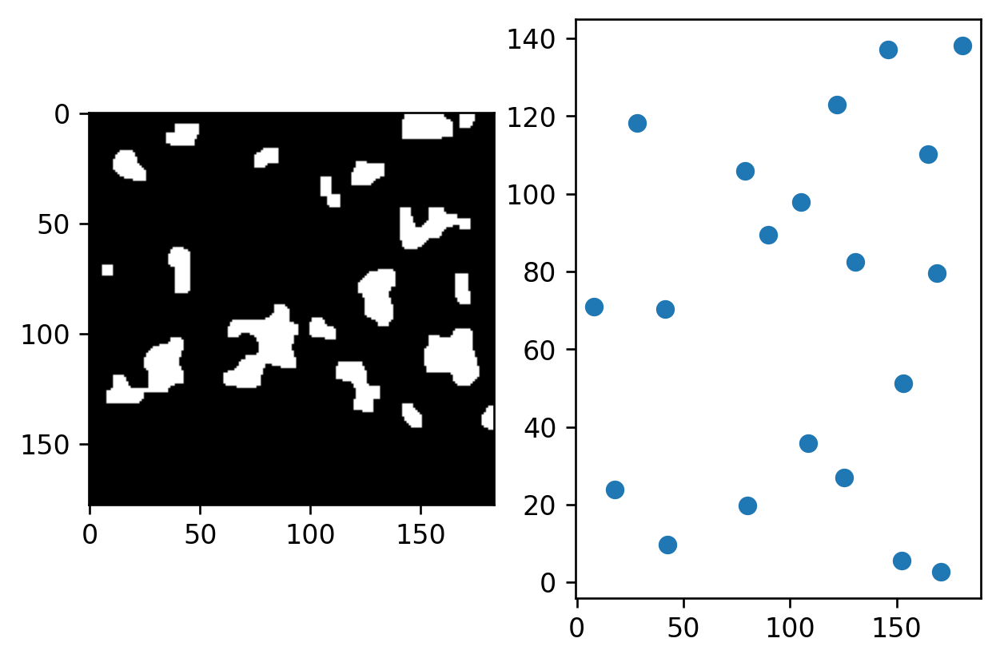

7.842783573090482
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845]


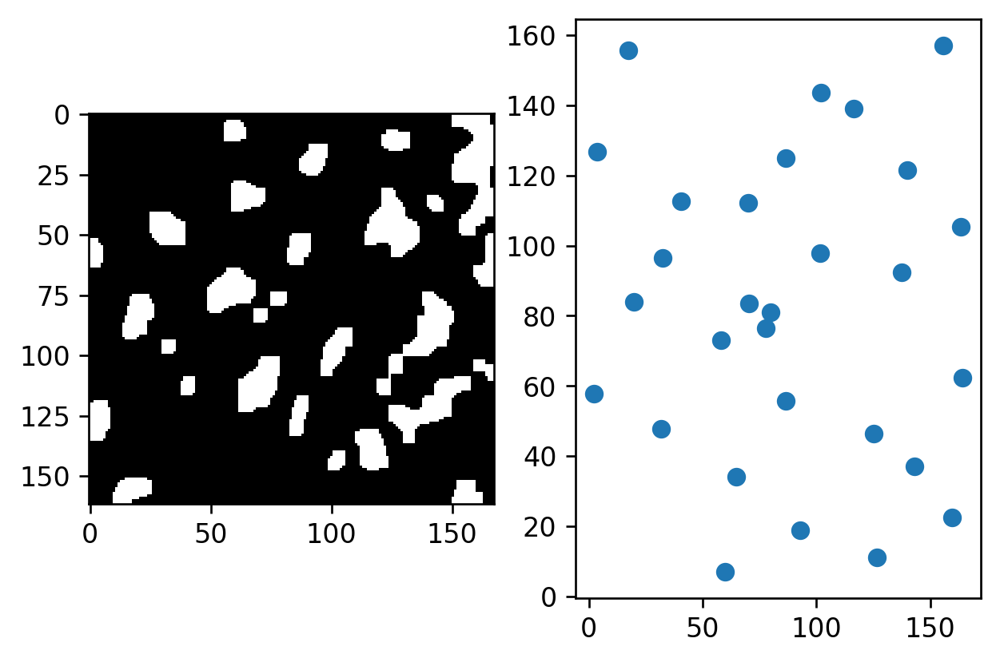

8.379045205125335
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573]


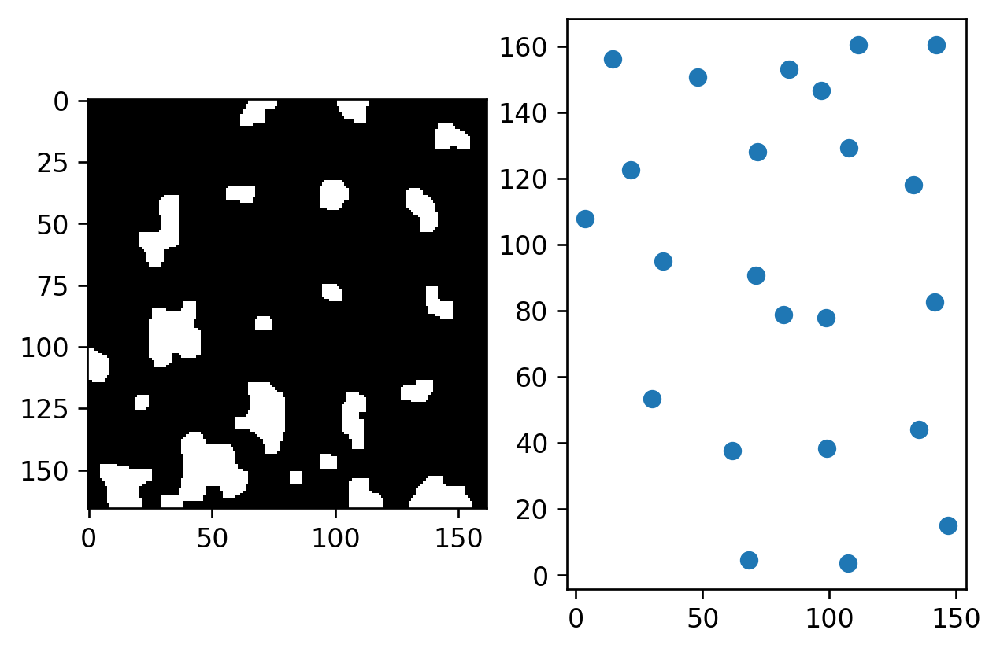

7.637039888023296
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968]


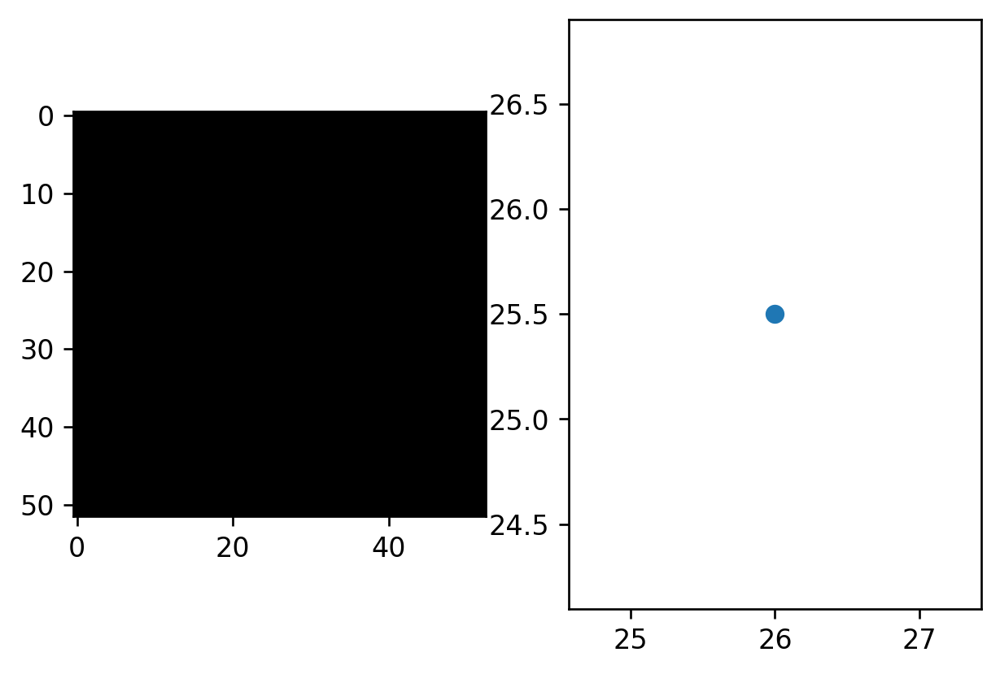

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf]


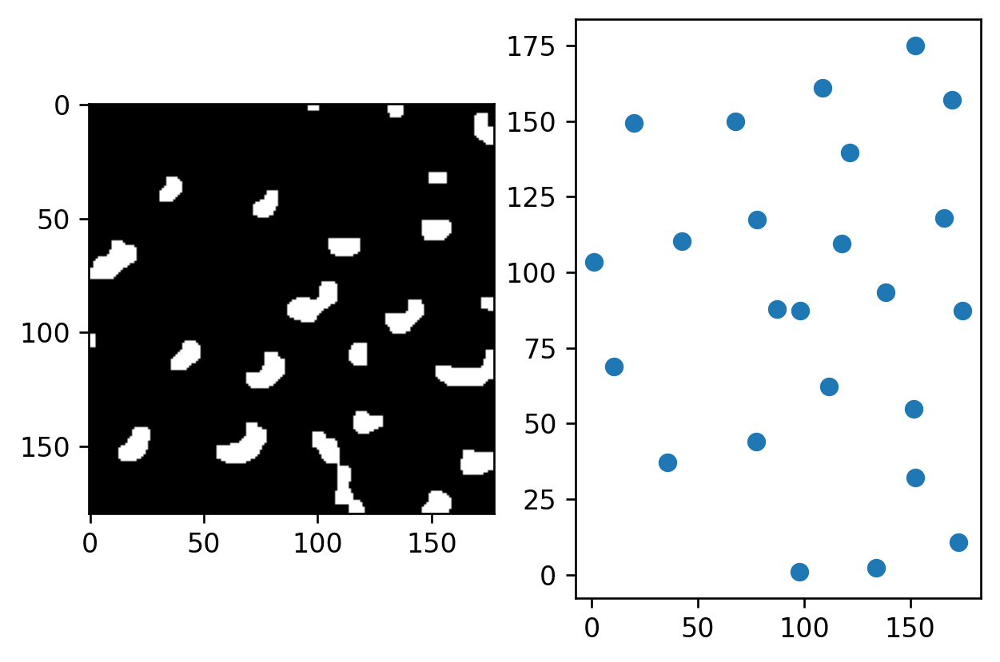

8.113192112615828
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981]


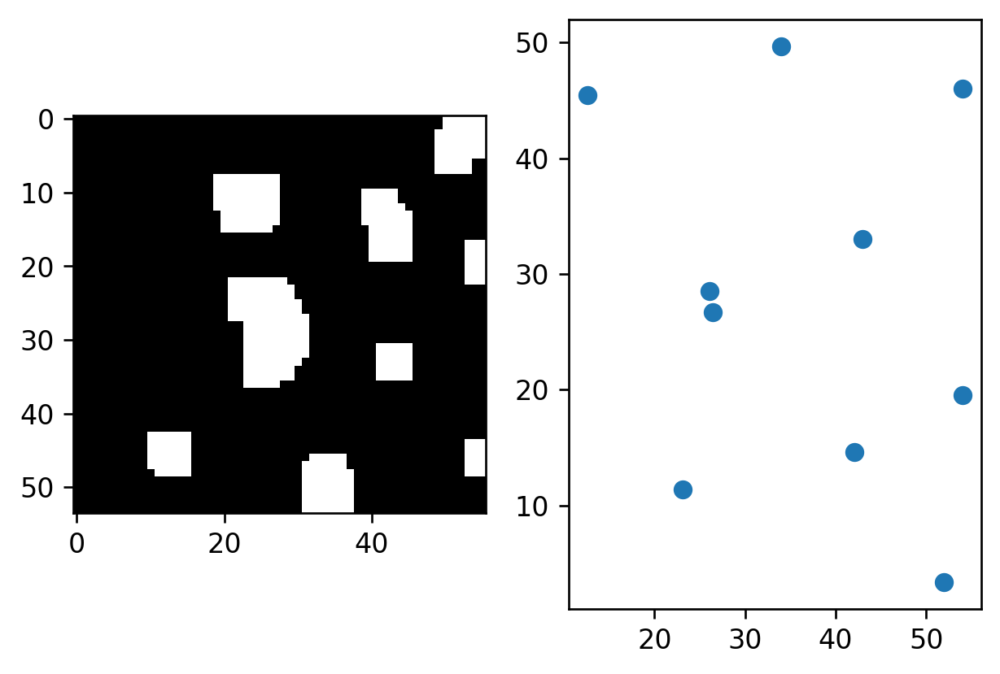

6.287745253779721
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865]


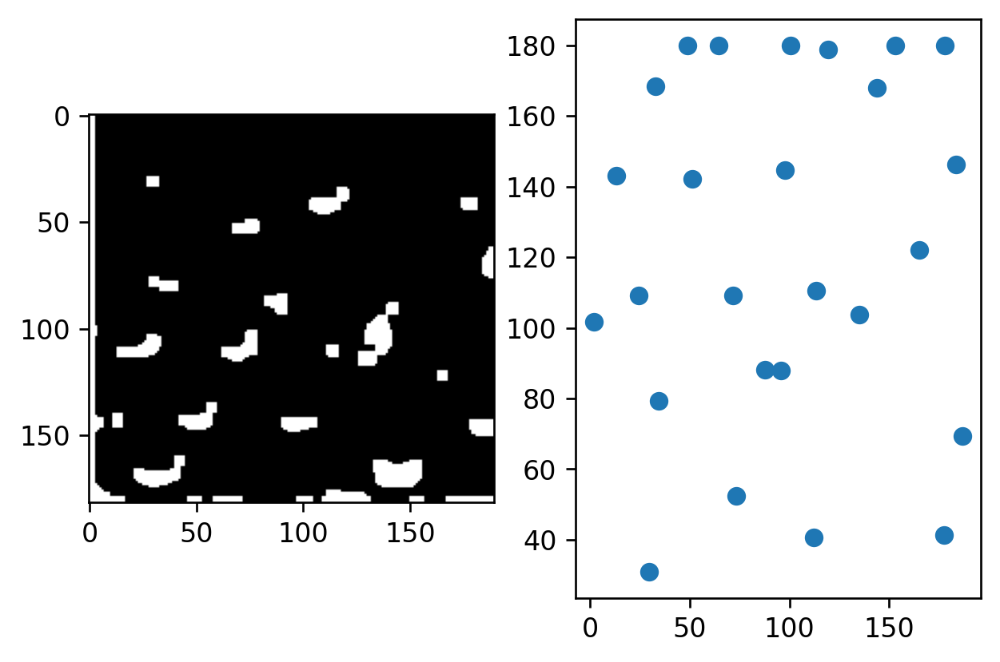

9.62516659639997
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343]


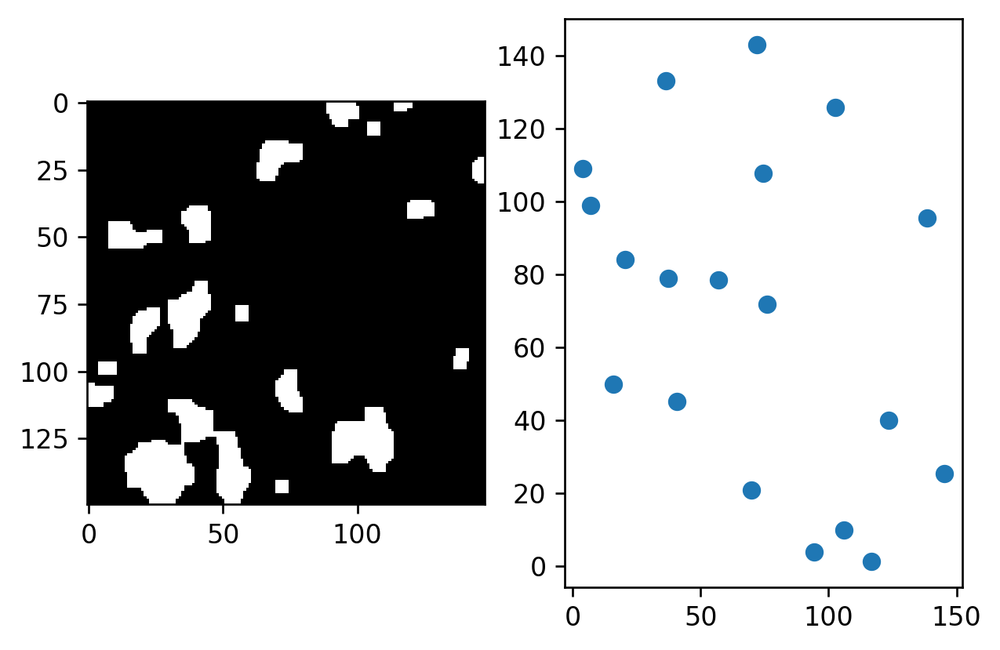

9.892308741577516
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815]


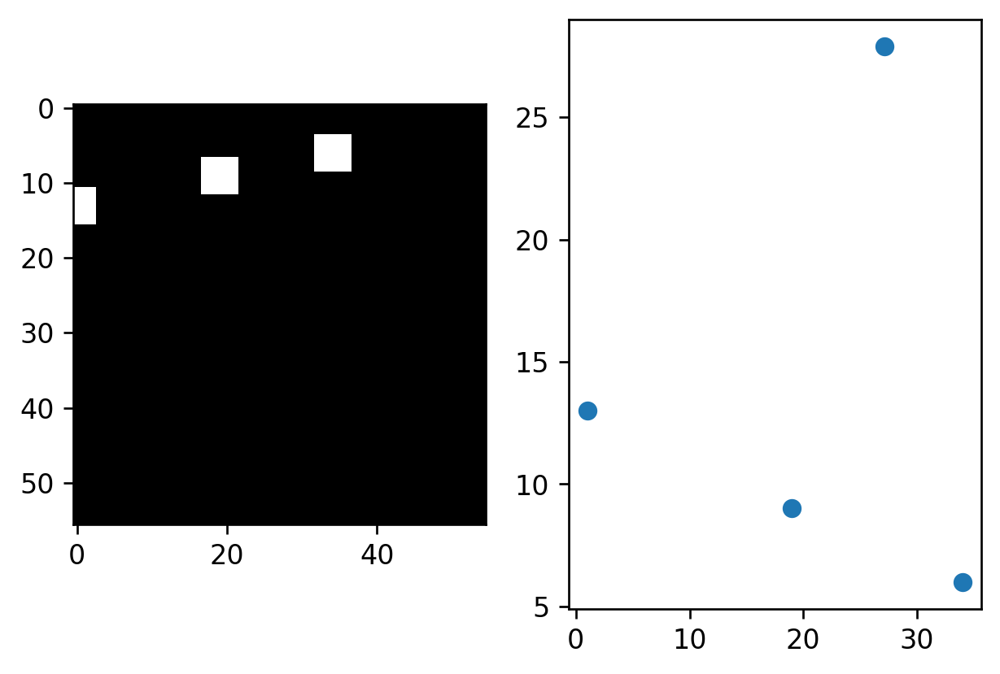

2.2384602830391622
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914]


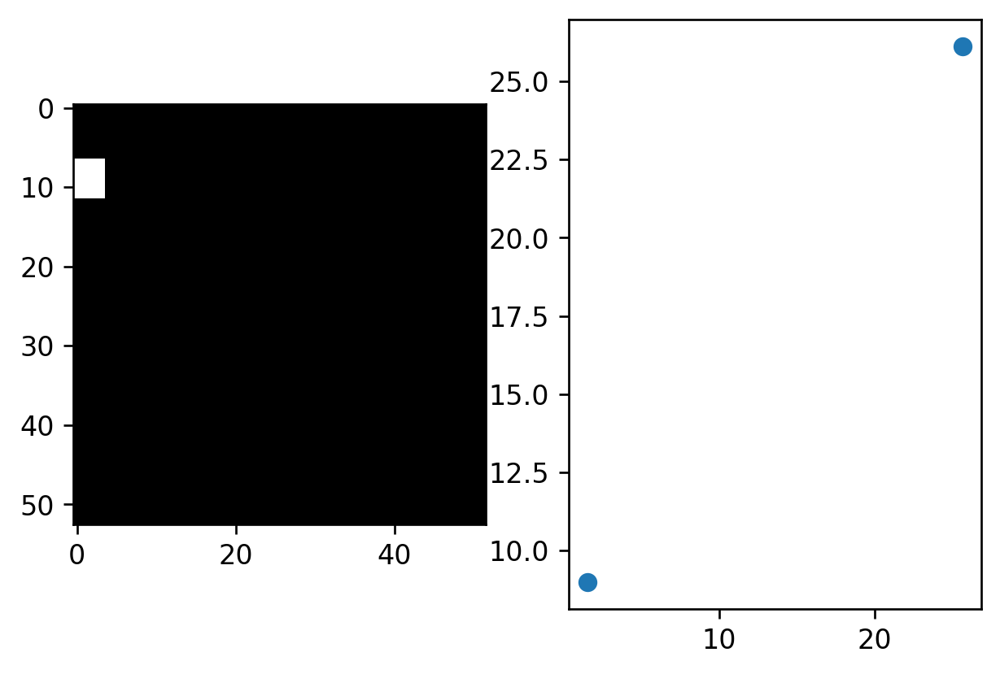

0.0
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409]


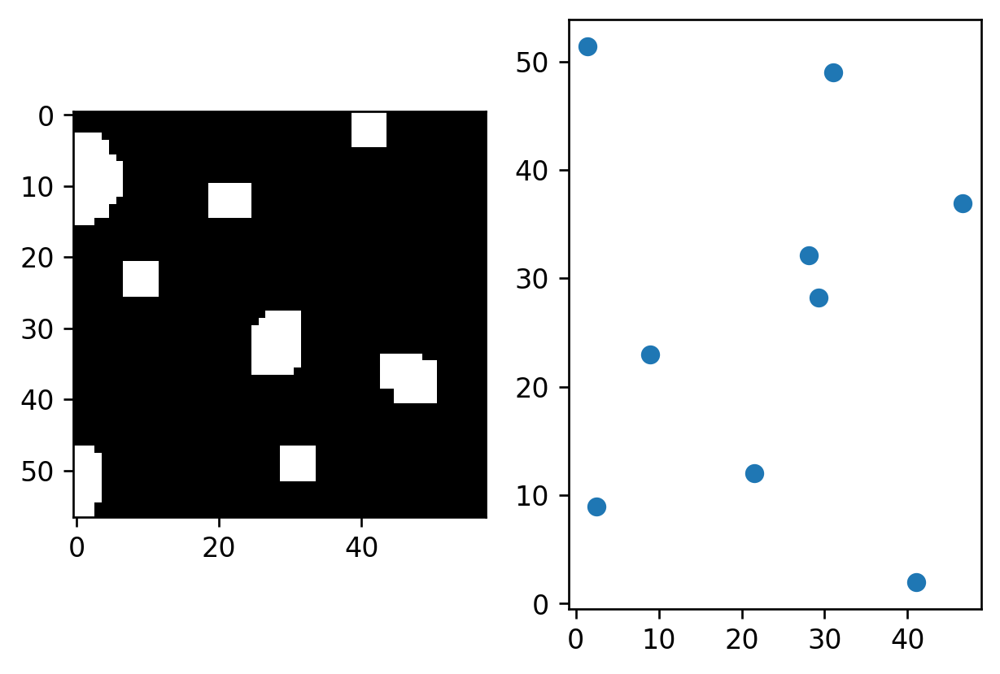

7.52687436901713
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713]


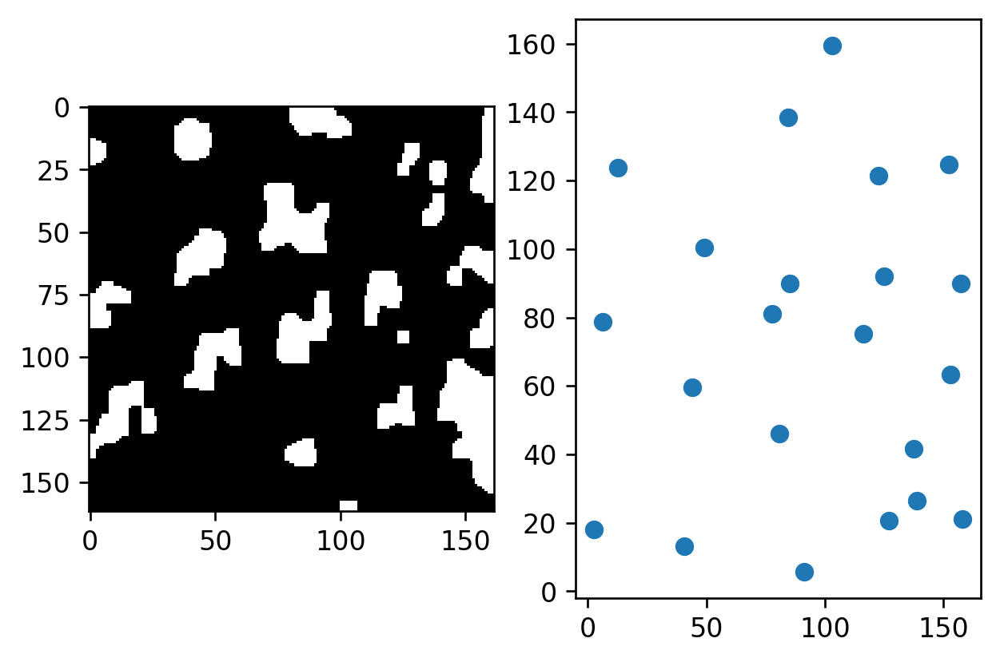

10.384253465573769
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158]


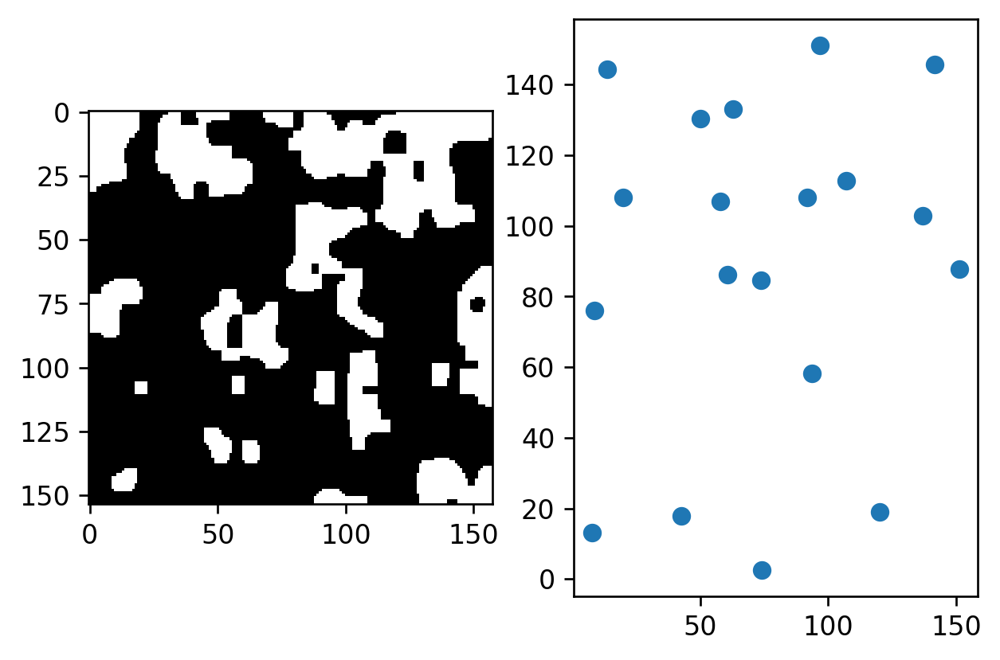

11.09168868112686
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343]


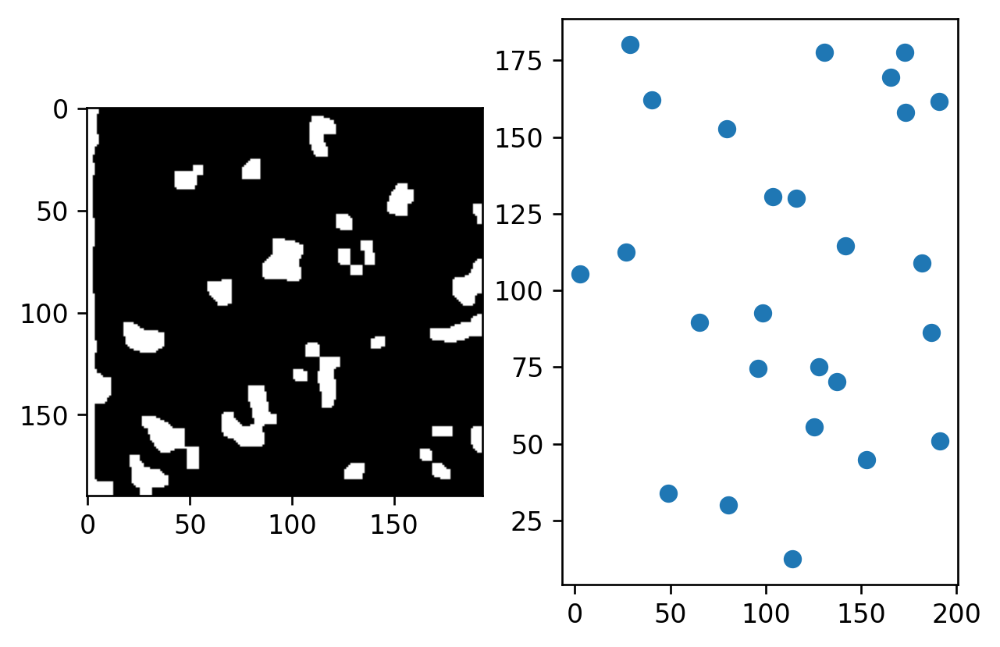

8.805587055999604
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018]


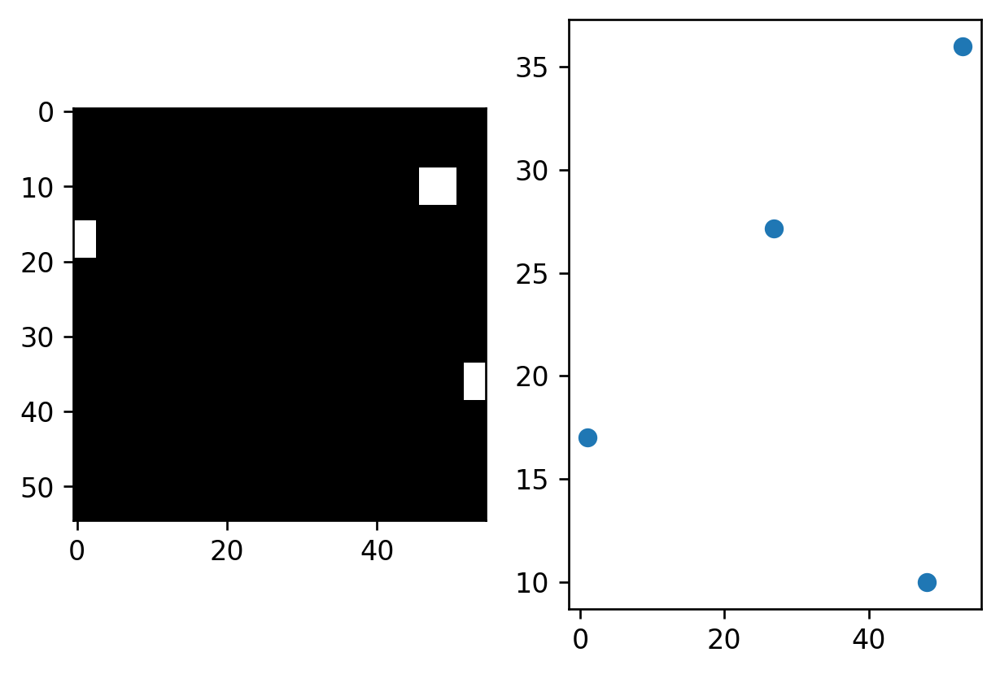

0.5398512231952929
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234]


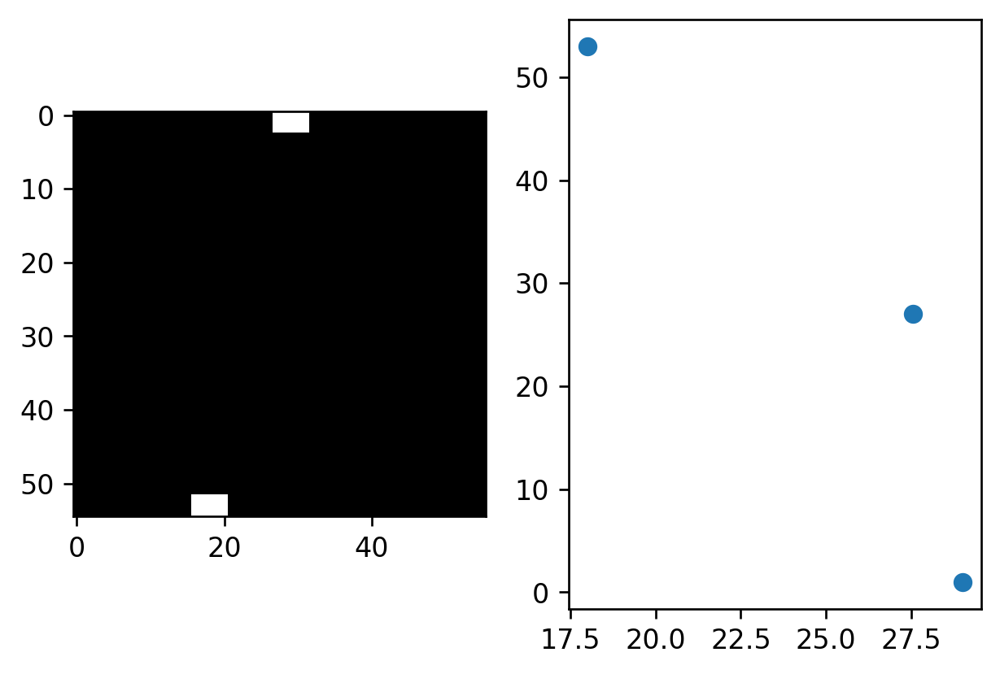

0.7795859729737813
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051]


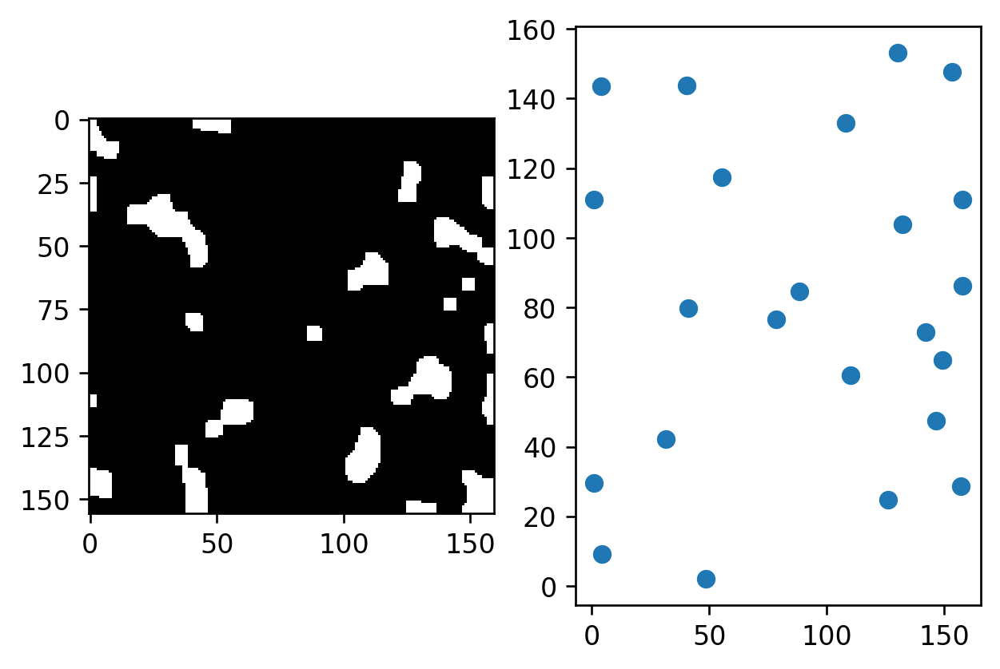

8.573035366556265
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398]


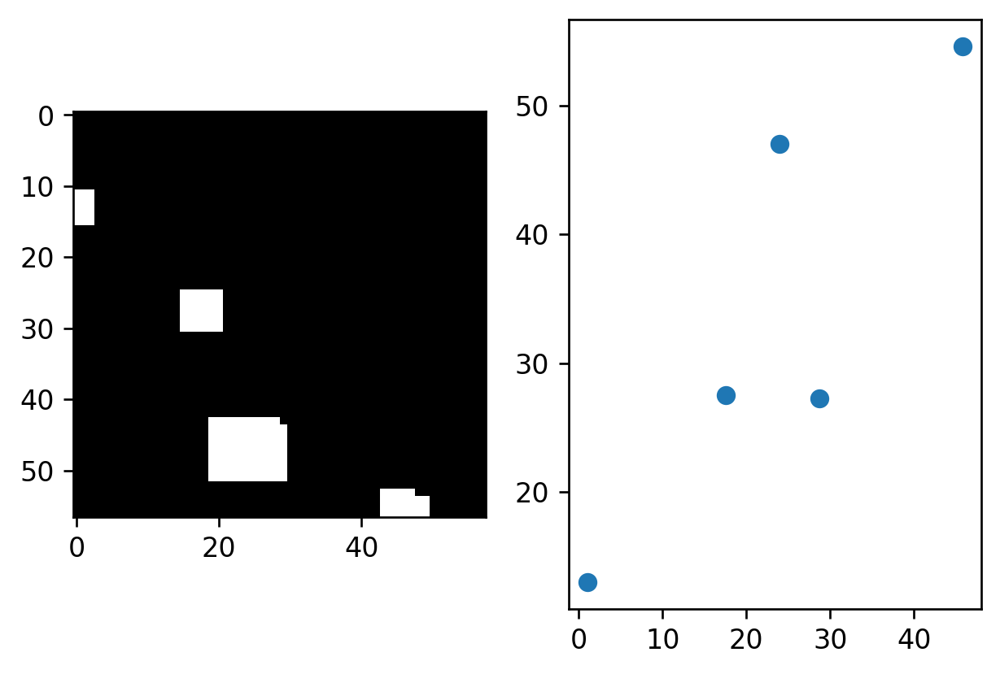

5.247576849889809
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946]


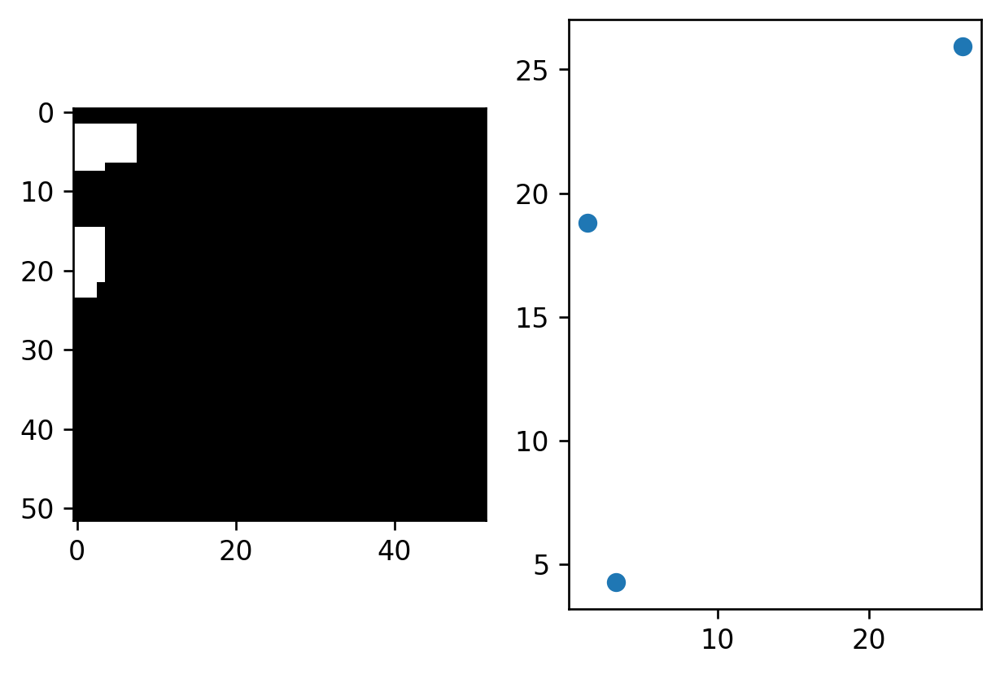

5.249828773011811
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708]


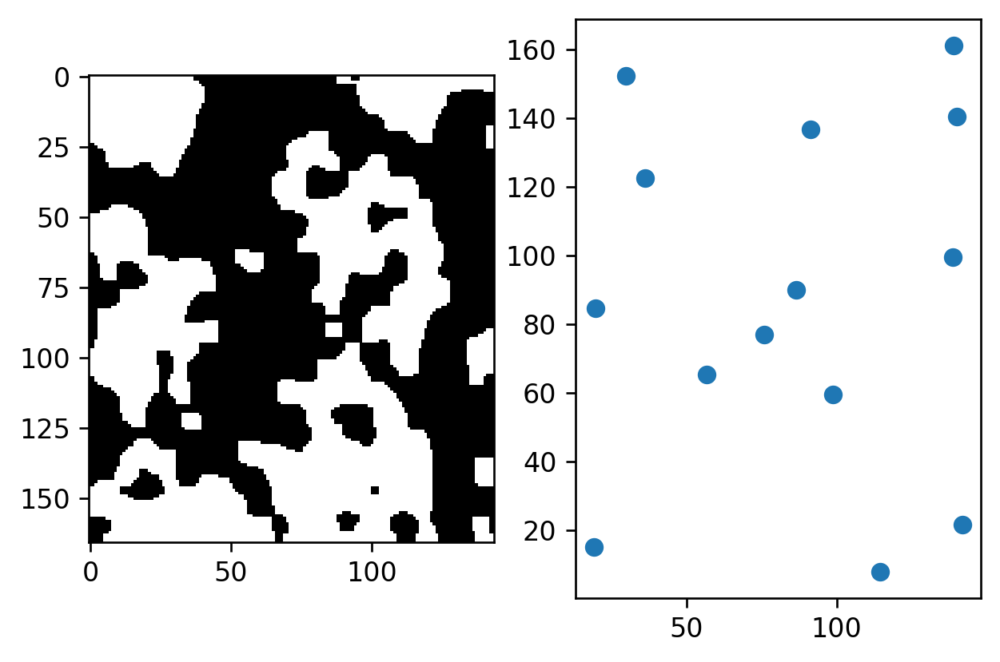

12.417840230789341
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473]


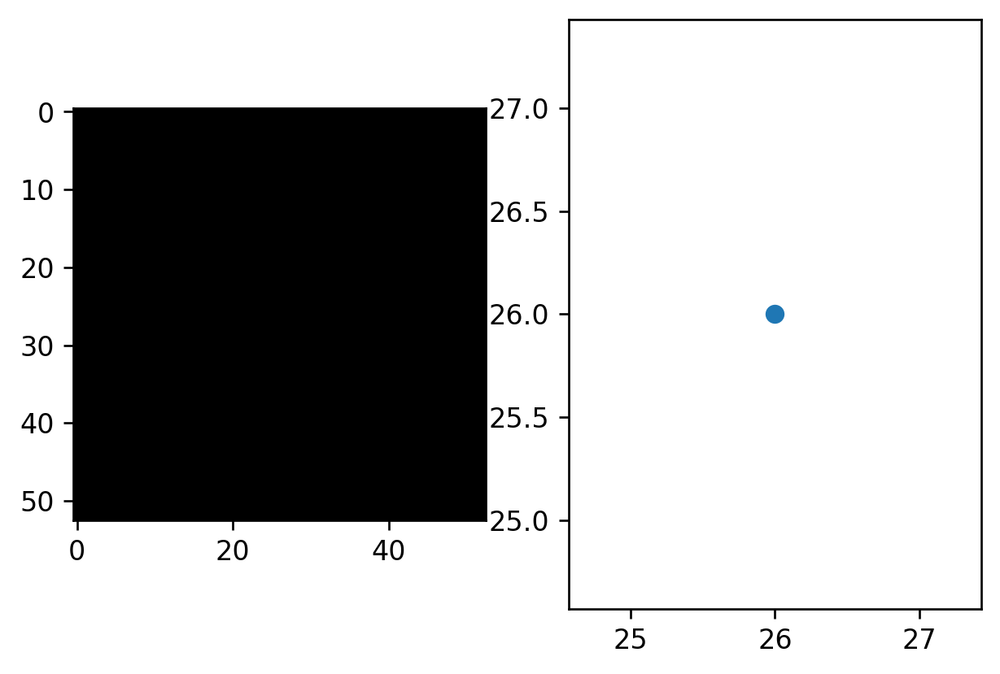

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf]


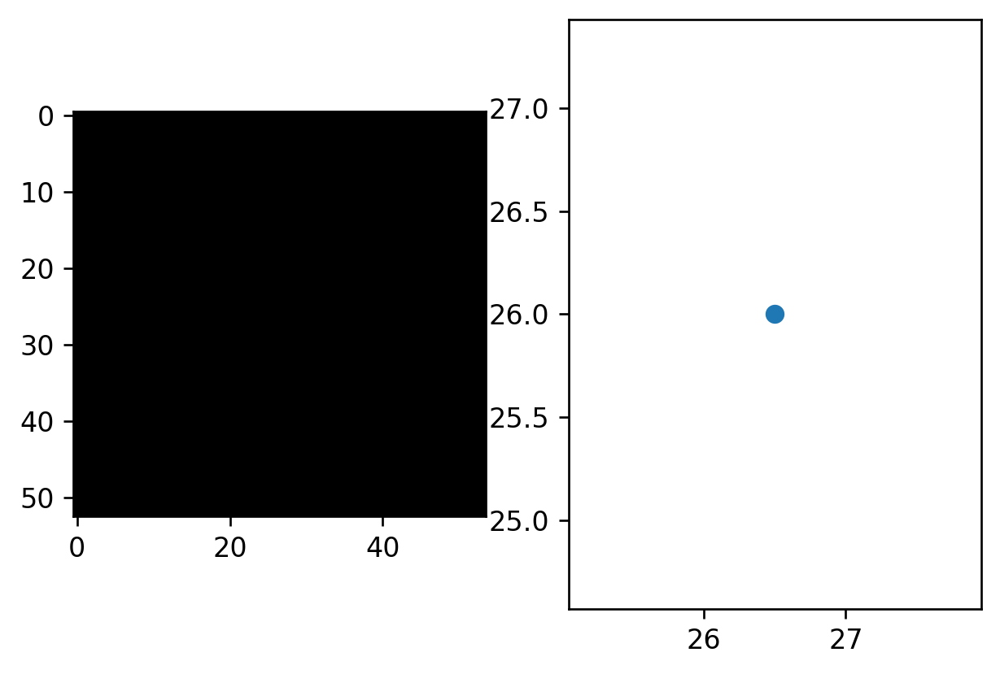

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf]


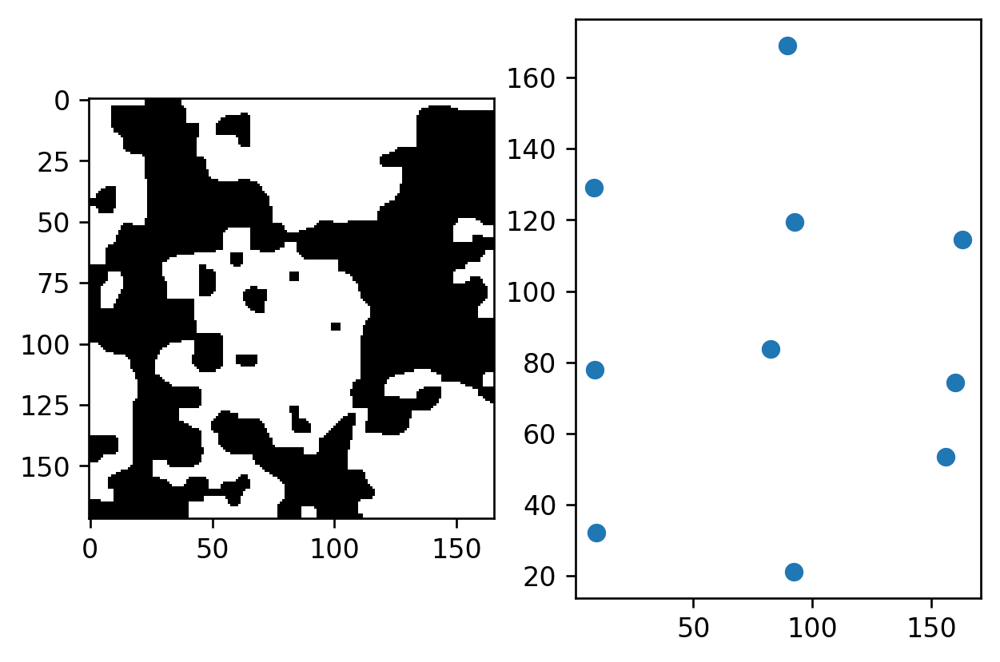

12.36976078337392
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823]


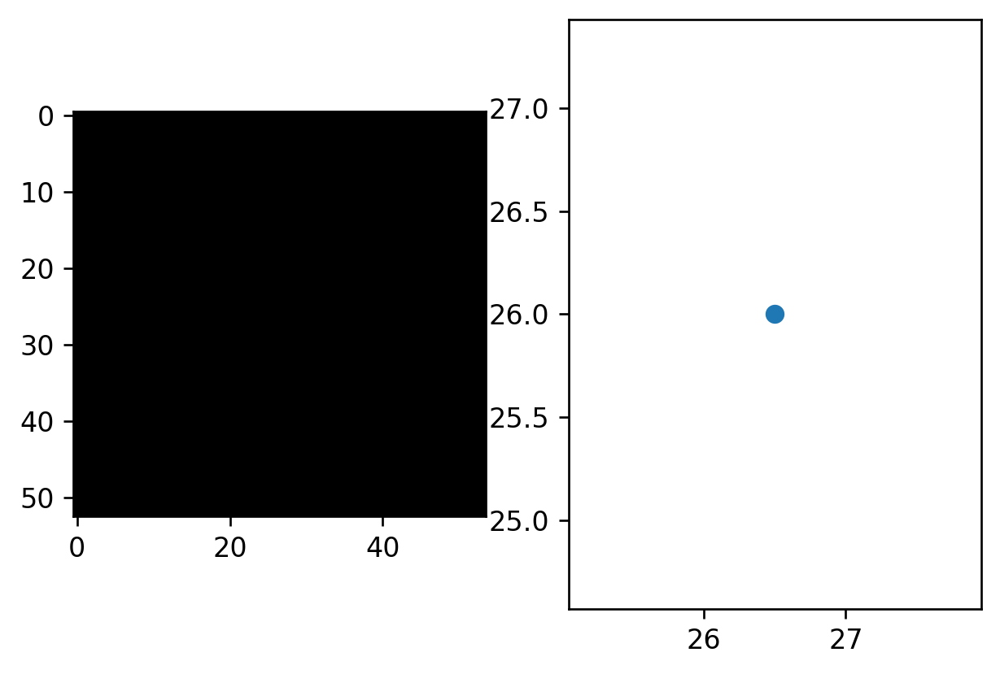

nan
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf]


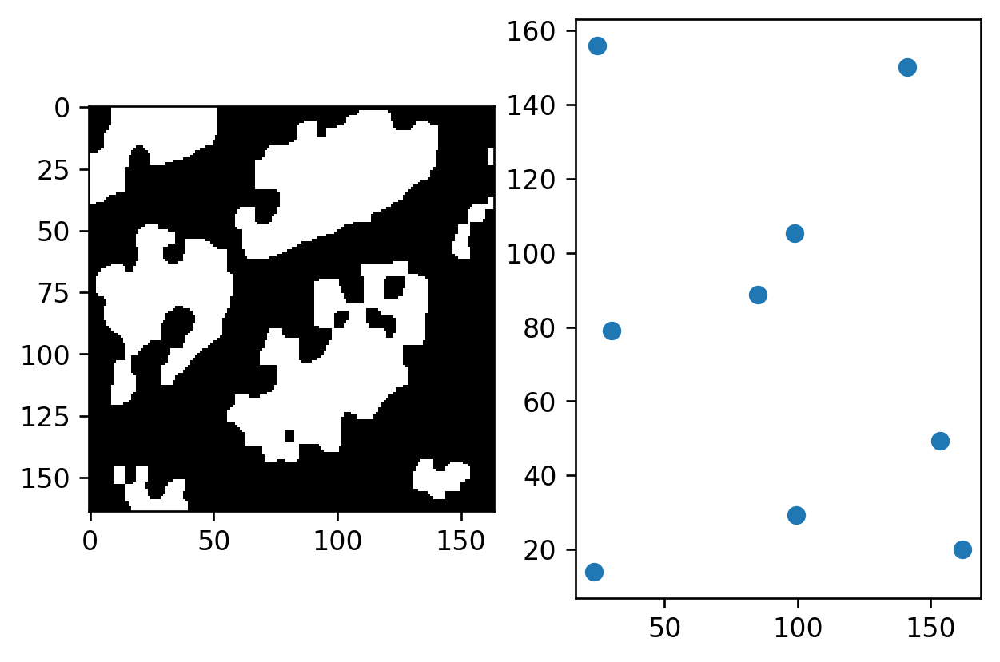

19.670818289493944
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246]


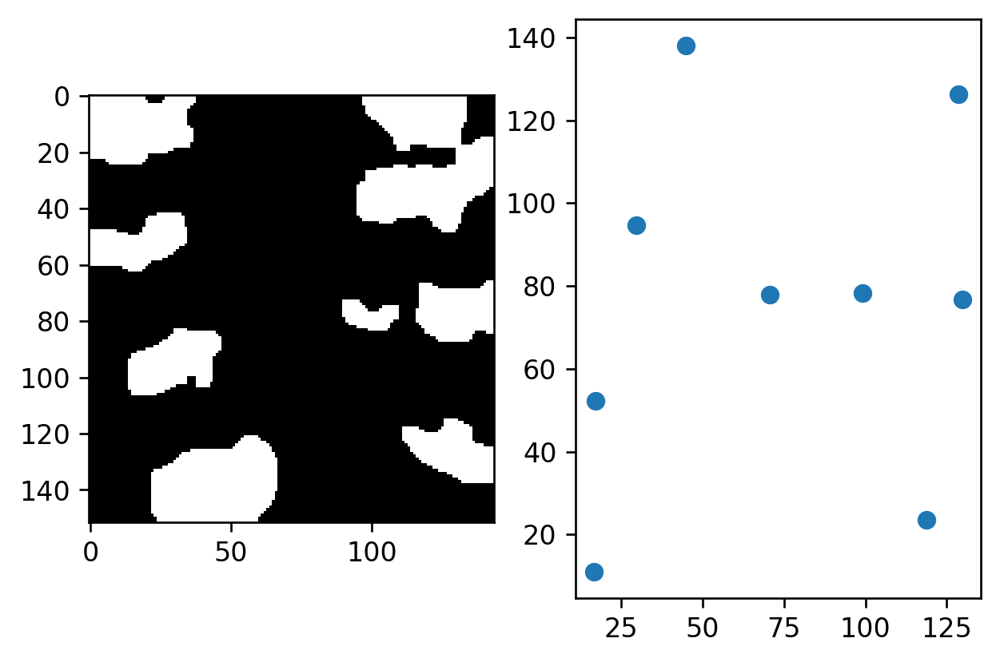

8.906726806027008
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665]


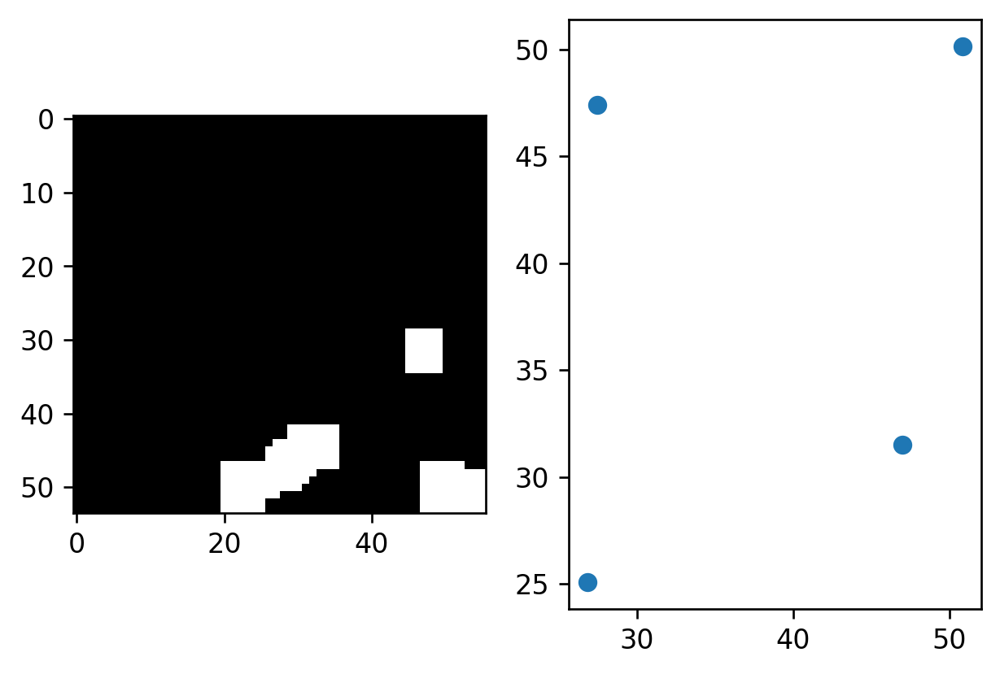

1.4195527551931695
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233]


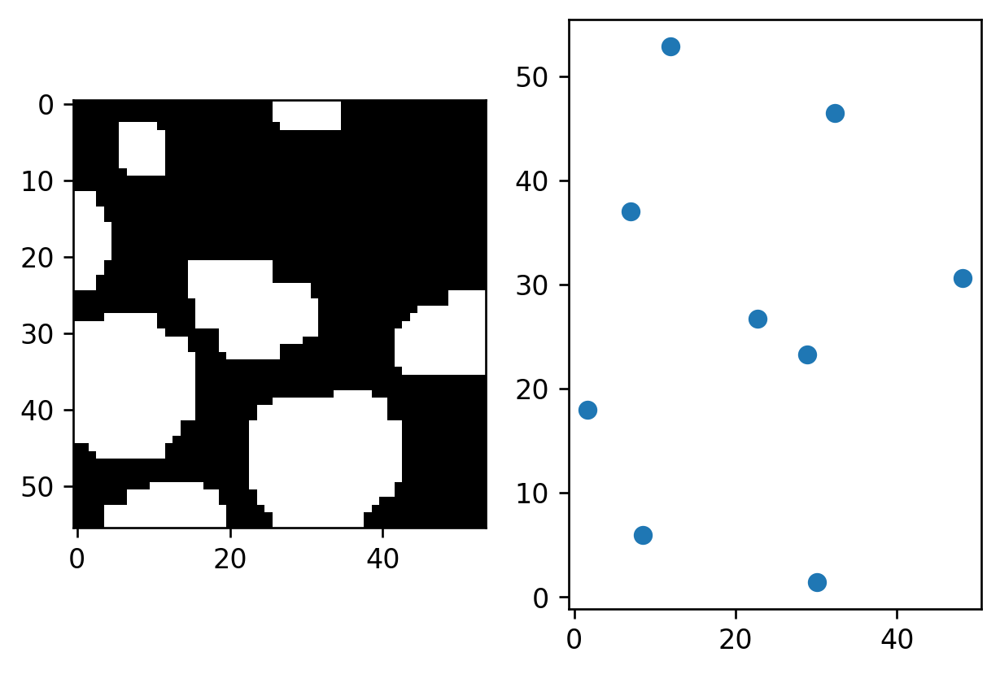

5.291294288414108
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563]


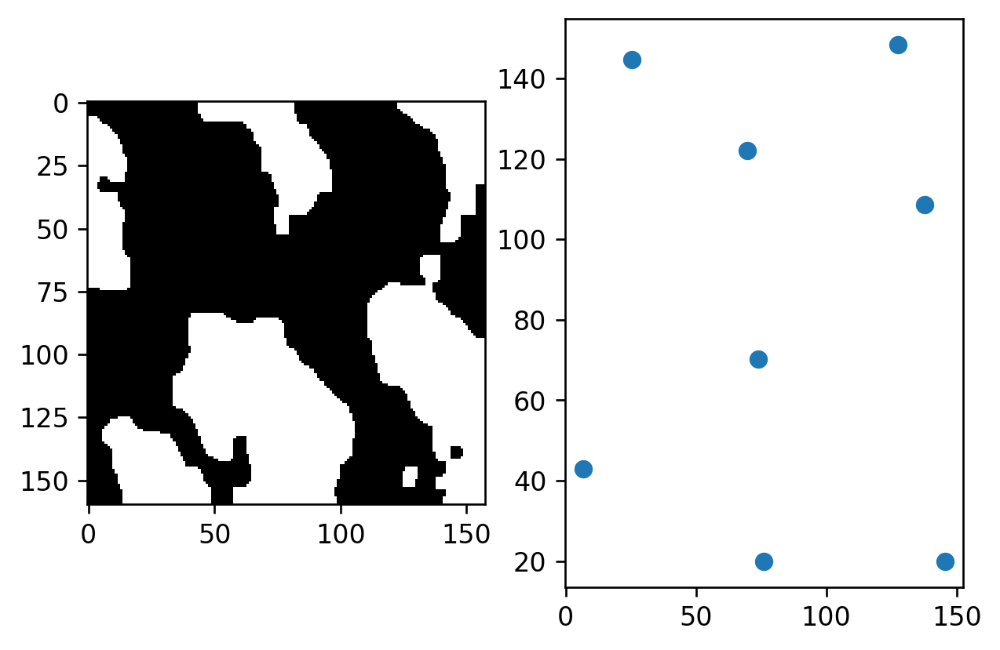

11.034473853370312
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563, 53.03053095285608]


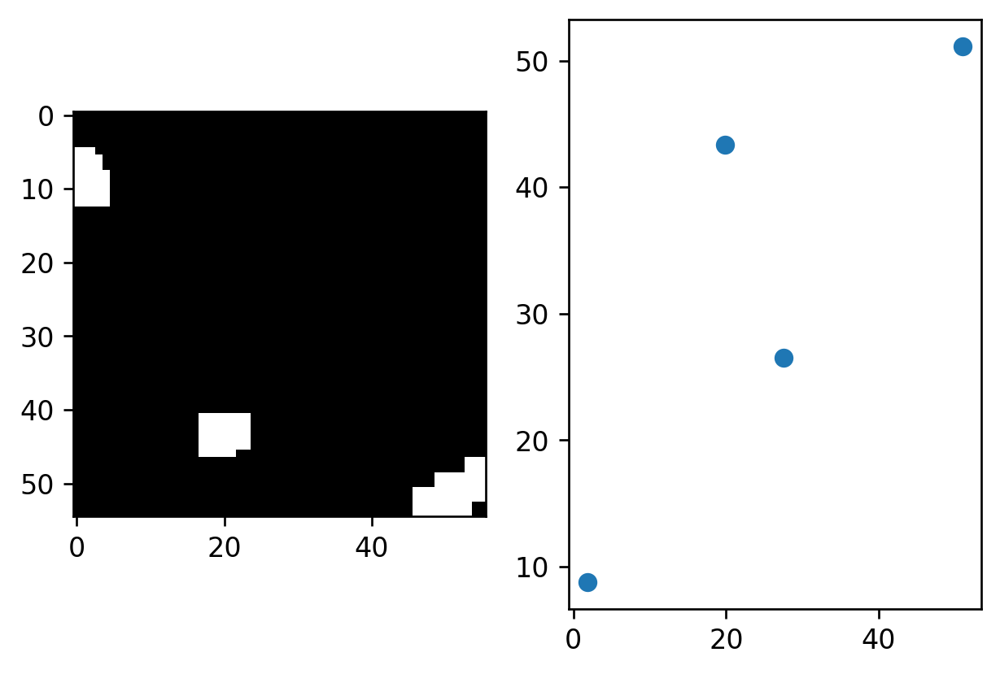

6.5833726873388825
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563, 53.03053095285608, 25.044838794468177]


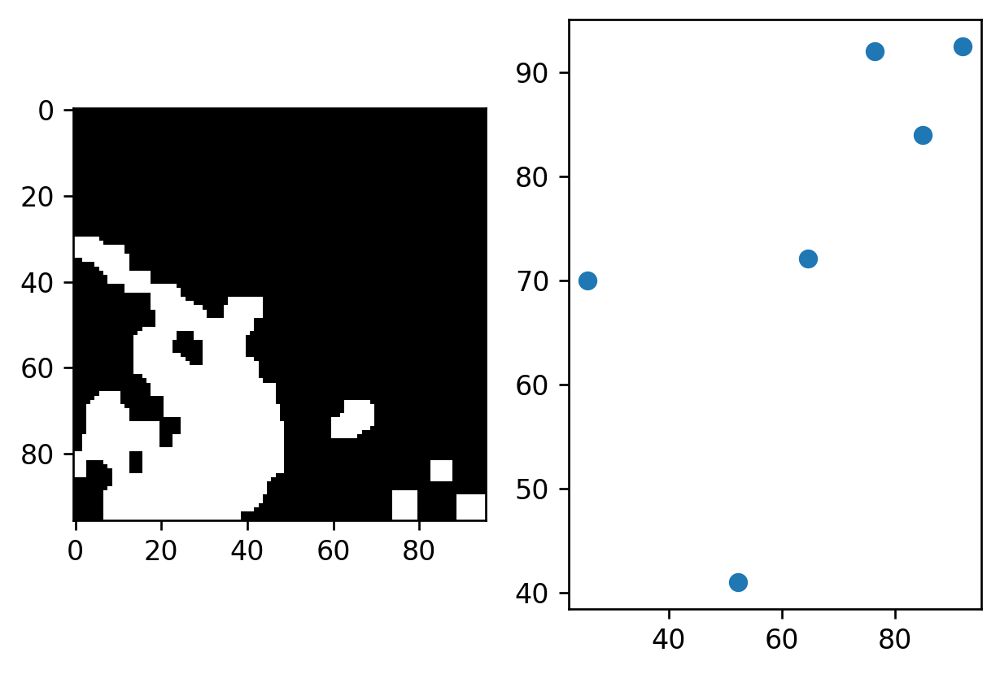

11.35107205759414
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563, 53.03053095285608, 25.044838794468177, 21.577784901725423]


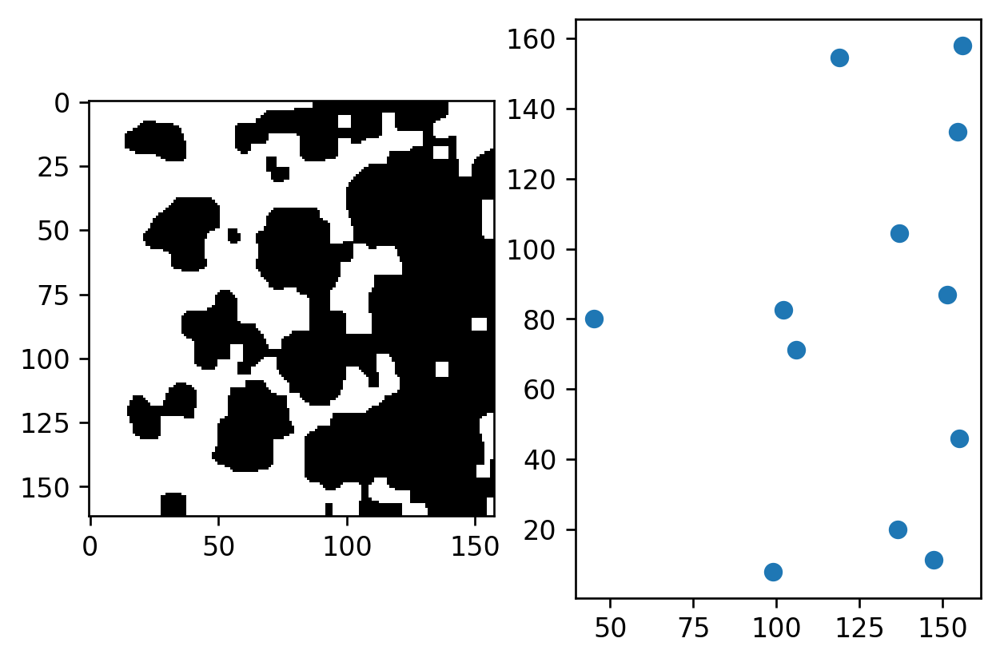

12.989567399391108
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563, 53.03053095285608, 25.044838794468177, 21.577784901725423, 25.98008383409324]


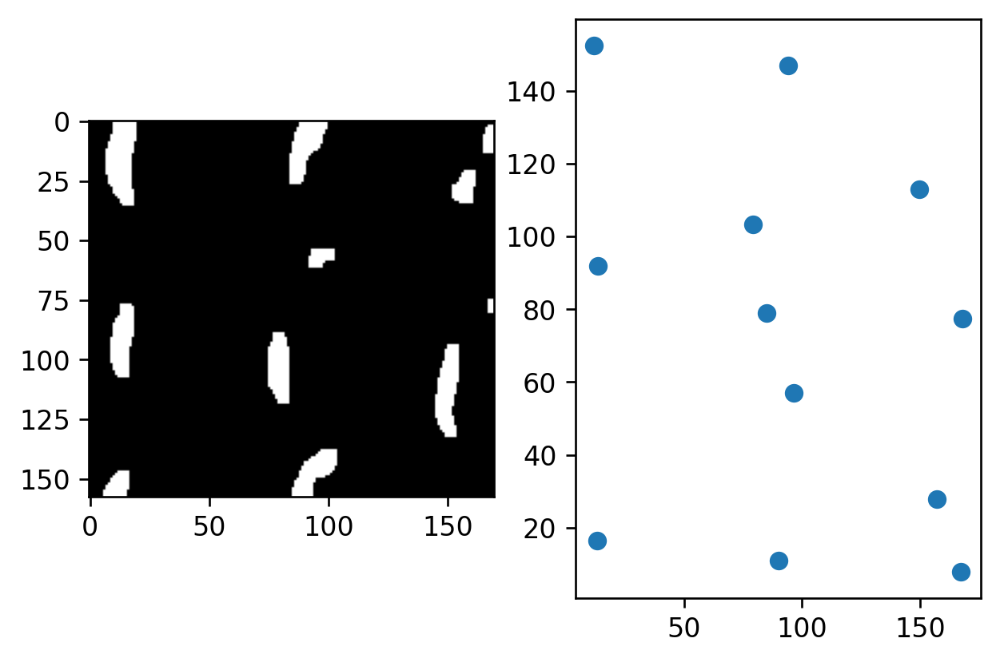

17.07543232156611
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563, 53.03053095285608, 25.044838794468177, 21.577784901725423, 25.98008383409324, 40.76595732594998]


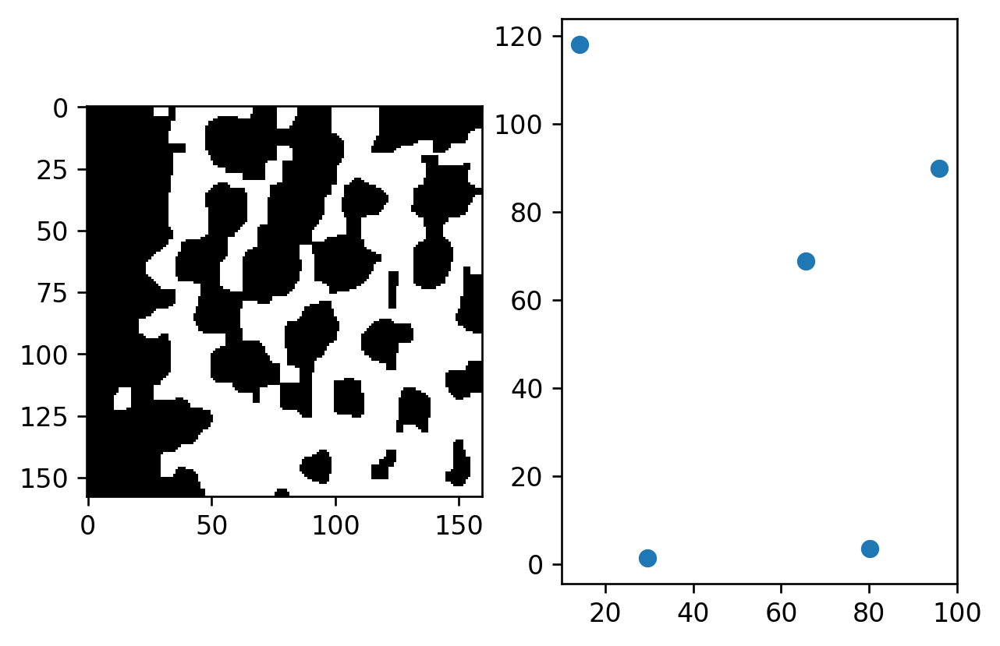

12.559706416822154
[14.684273311802274, inf, 43.49539165079401, 36.34973730199719, 36.21570366917387, inf, inf, 30.716464572426315, 37.23408353551832, inf, 14.444233490950515, inf, 32.216830599511574, inf, inf, inf, 28.866992653405024, 13.178071353732067, 21.383076572804608, 26.464266719812613, 20.621440928610607, 27.40229699845845, 23.283533438416573, 27.00107759462968, inf, 29.55844616650981, 13.499629302929865, 25.318670043372343, 23.89958545968815, 17.40353874789914, 29.62587416967409, 15.943488108848713, 27.33099928037158, 27.30788397060343, 22.798149802691018, 26.986908656005234, 26.59224734426051, 25.219242713343398, 17.594982944716946, 18.358185722712708, 31.4765214946473, inf, inf, 41.28499851600823, inf, 46.893823733697246, 40.44926249405665, 20.404154700887233, 15.426350103029563, 53.03053095285608, 25.044838794468177, 21.577784901725423, 25.98008383409324, 40.76595732594998, 49.25326910665039]


In [11]:
standard_deviations = []
def shortest_distance(n):
    min_dis = np.inf
    for i in c:
        if (i[0] != n[0] or i[1] != n[1]) and sum((n - i)**2)**.5 < min_dis :
             min_dis = sum((n - i)**2)**.5
                
    return min_dis
            
count = 0 

average_shortest_distance_squared = []
block_size = []
for c in centers:
    plt.subplot(1,2,1), plt.imshow(thr_images[count], 'gray')
    plt.subplot(1,2,2), plt.scatter(c[:,0], c[:, 1])
    plt.show()
    shortest_dis = []
    for i in c:
        shortest_dis.append(shortest_distance(i))
    print(np.std(shortest_dis))
    standard_deviations.append(np.std(shortest_dis))
    average_shortest_distance_squared.append(np.mean(shortest_dis))
    print( average_shortest_distance_squared)
    count = count +1
        


-----------SD-------------------------
55 55
[72.0909090909091, nan, 1093.1666666666667, 1033.125, 12.0, nan, nan, 1349.0, 499.77777777777777, nan, 88.125, nan, 845.8888888888889, nan, nan, nan, 582.8181818181819, 81.9, 154.33333333333334, 288.40909090909093, 141.3793103448276, 205.21052631578948, 162.89285714285714, 163.22727272727272, nan, 120.8695652173913, 50.333333333333336, 115.16, 150.77777777777777, 21.666666666666668, 20.0, 40.625, 227.33333333333334, 400.94444444444446, 172.8, 18.333333333333332, 15.0, 118.9090909090909, 43.75, 39.0, 842.4615384615385, nan, nan, 1629.7777777777778, nan, 1247.875, 702.375, 68.33333333333333, 131.875, 1474.0, 44.0, 397.2, 1160.2727272727273, 174.0909090909091, 2953.75] [3249, 3025, 26560, 28552, 2970, 3025, 2970, 29580, 27224, 3136, 3364, 3025, 27864, 3025, 2970, 2970, 29928, 3249, 29580, 28552, 33852, 32752, 27216, 26892, 2756, 32040, 3024, 34580, 22200, 3080, 2756, 3306, 26244, 24332, 36860, 3025, 3080, 24960, 3306, 2704, 23904, 2809, 2862, 2

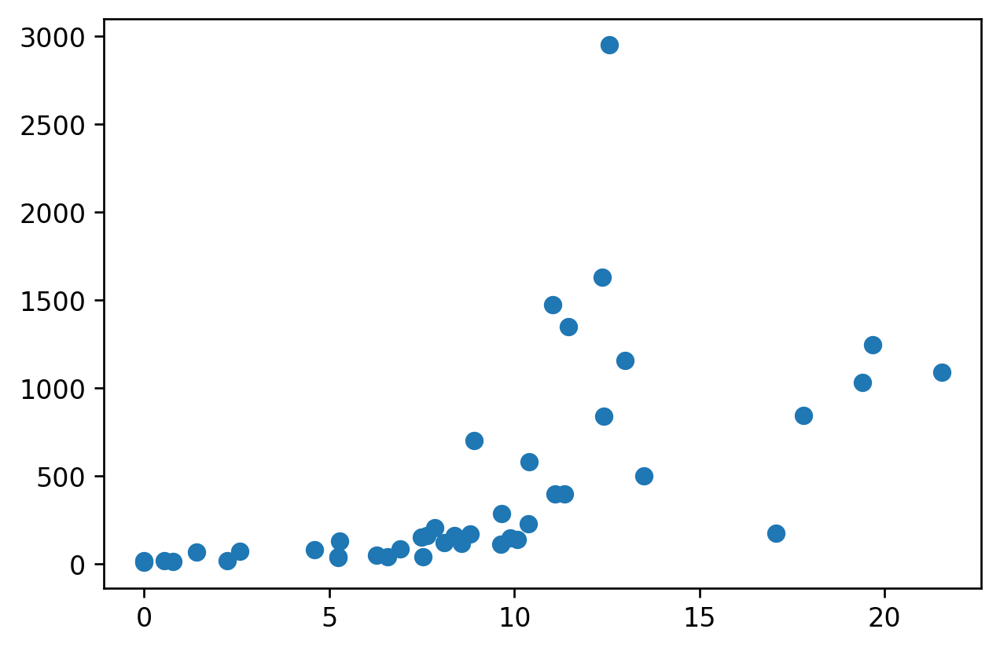

In [12]:
#print(average_size)



print("-----------SD-------------------------")

print(len(standard_deviations), len(average_size))
plt.scatter(standard_deviations, average_size)


#large average size, but huge SD indicates small scales are either being lumped together, while some small scales remain
#or that large scales are being broken apart into small scales: which is more likly?

#the ideal would be to get low SD: evenly spread out, rather than choose an arbitary value we can perhaps use machine learning
#to choose blocksize corresponding to the lowest value


#can block size be the ratio of the average size of the scale to the size of the entire image?

dimensions = []
for i in thr_images:
    dimensions.append(i.shape[0] * i.shape[1])
    
print(average_size, dimensions)
print(np.array(average_size)/np.array(dimensions))

[ 29.36854662          inf  86.9907833   72.6994746   72.43140734
          inf          inf  61.43292914  74.46816707          inf
  28.88846698          inf  64.4336612           inf          inf
          inf  57.73398531  26.35614271  42.76615315  52.92853344
  41.24288186  54.804594    46.56706688  54.00215519          inf
  59.11689233  26.99925861  50.63734009  47.79917092  34.8070775
  59.25174834  31.88697622  54.66199856  54.61576794  45.59629961
  53.97381731  53.18449469  50.43848543  35.18996589  36.71637145
  62.95304299          inf          inf  82.56999703          inf
  93.78764747  80.89852499  40.8083094   30.85270021 106.06106191
  50.08967759  43.1555698   51.96016767  81.53191465  98.50653821]
bs 29.0
it 1.0


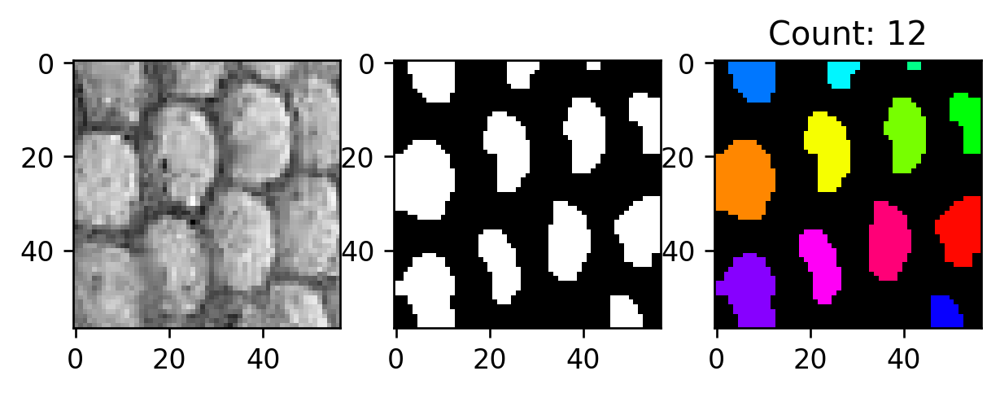

bs 87.0
it 4.0


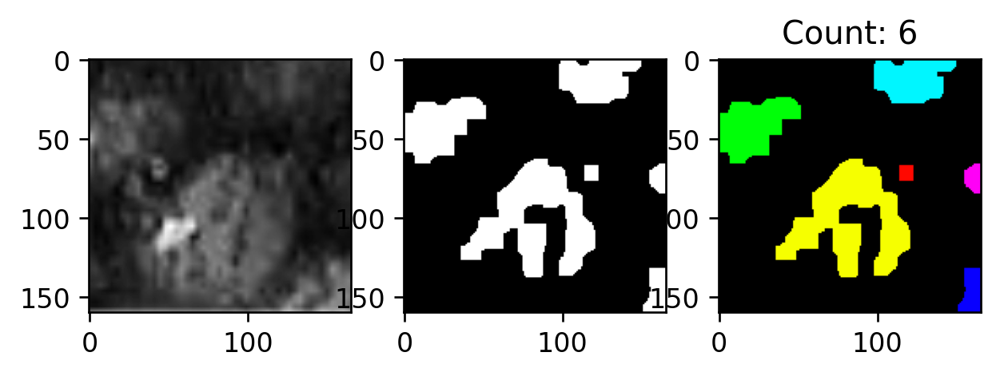

bs 73.0
it 4.0


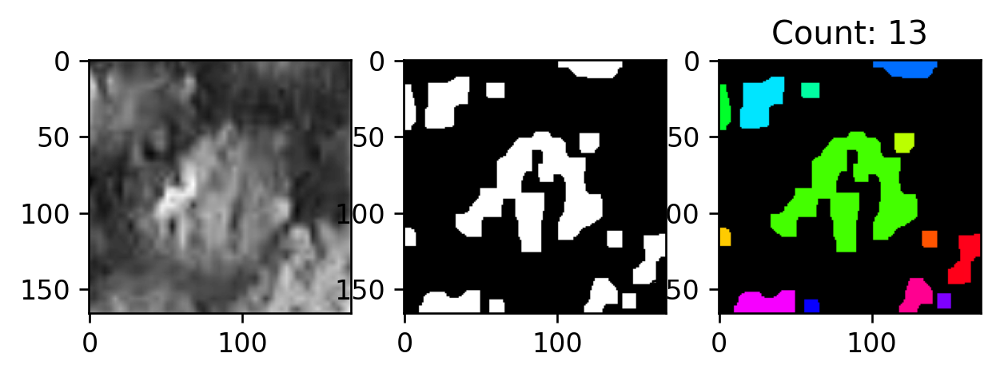

bs 73.0
it 4.0


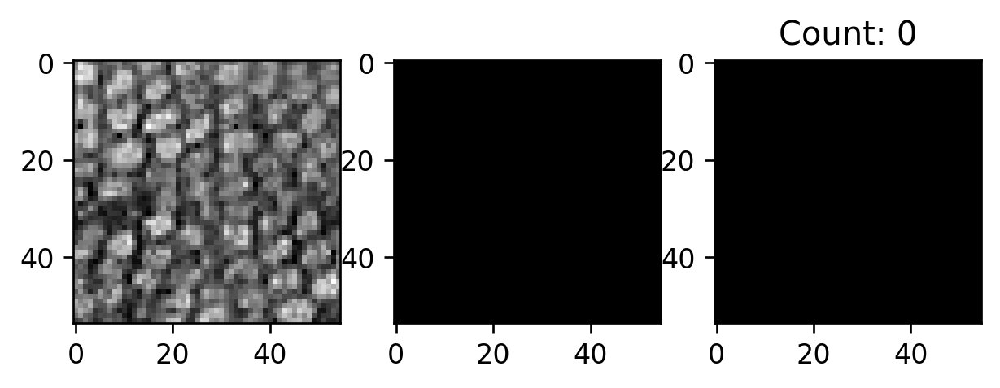

bs 61.0
it 3.0


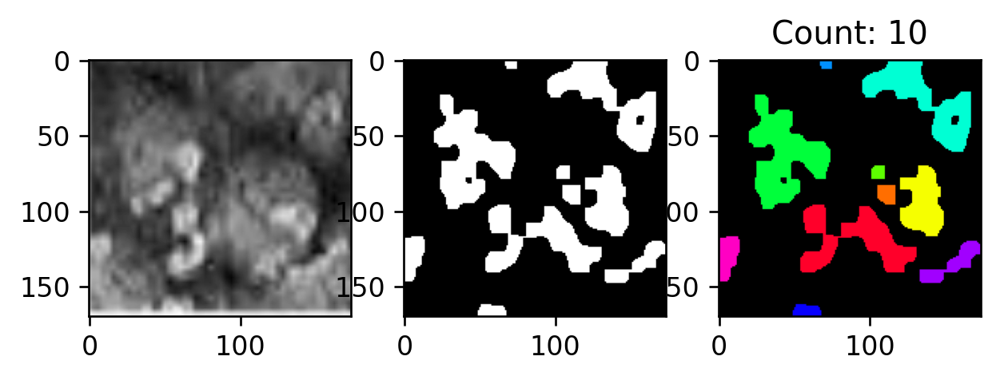

bs 75.0
it 4.0


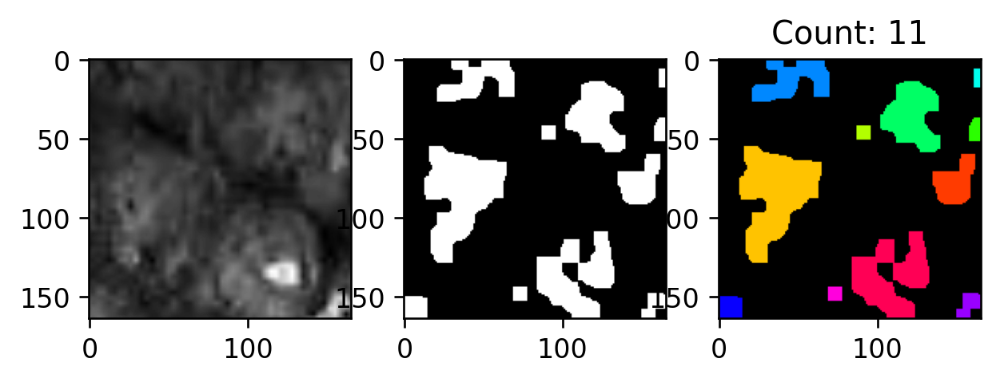

bs 29.0
it 1.0


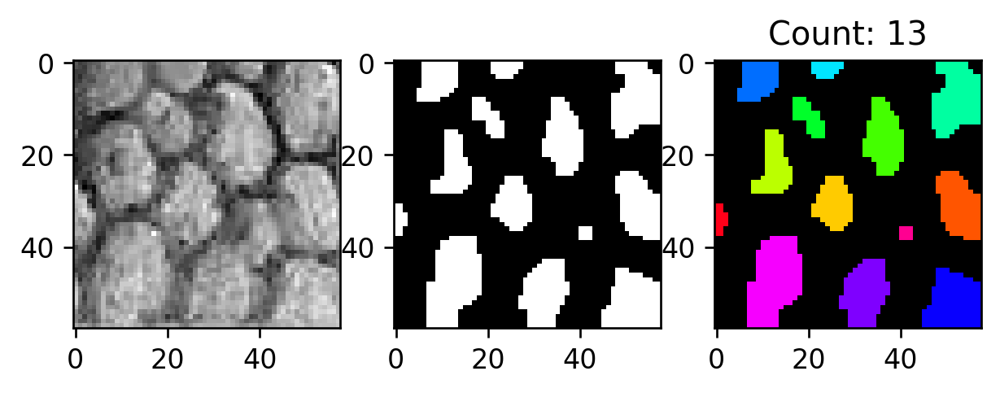

bs 65.0
it 3.0


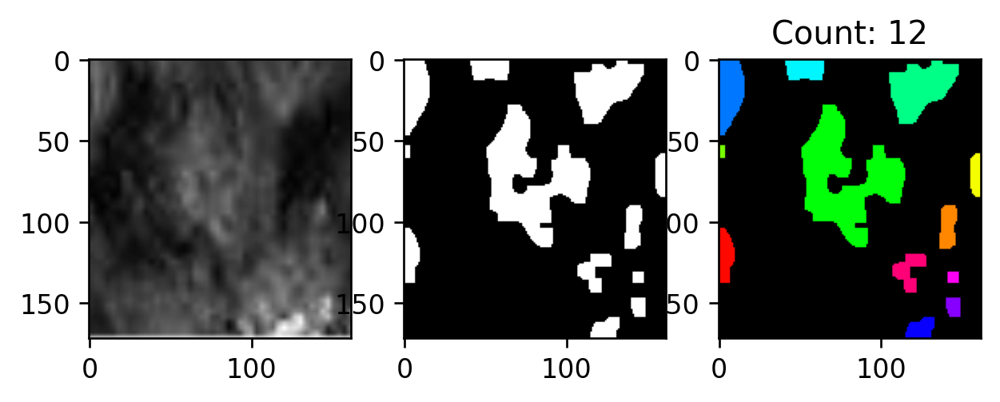

bs 59.0
it 3.0


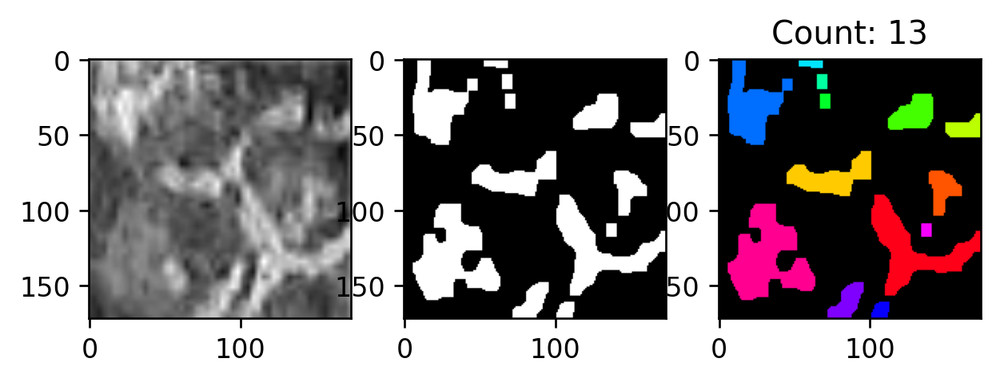

bs 27.0
it 1.0


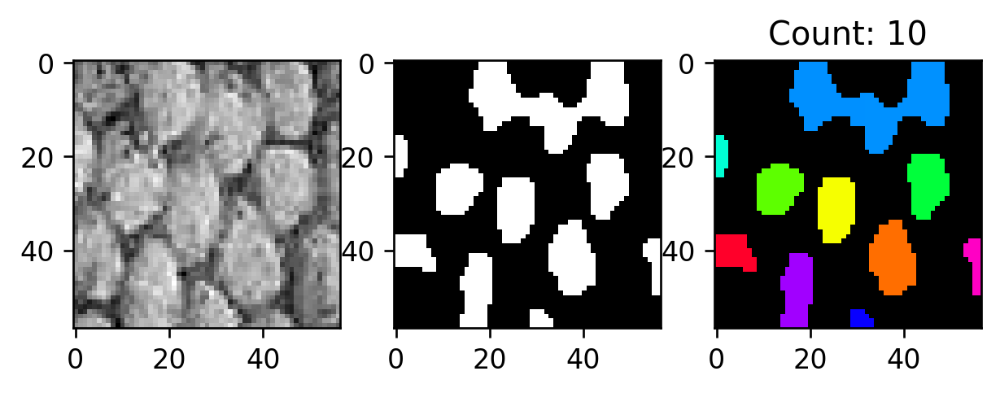

bs 43.0
it 2.0


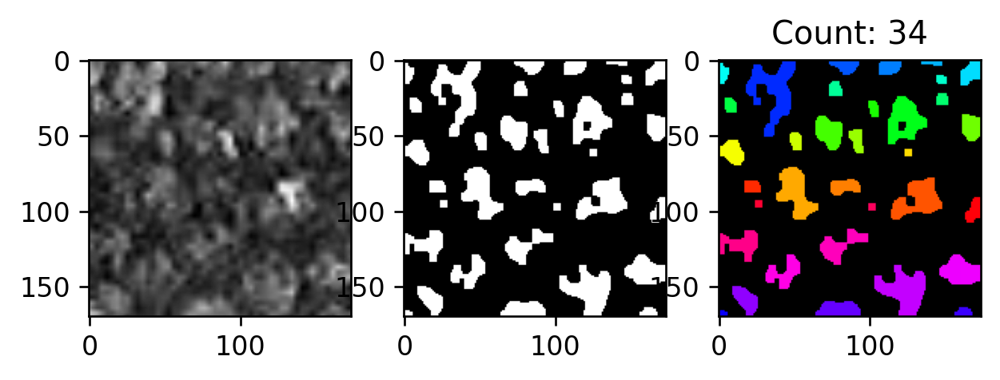

bs 53.0
it 3.0


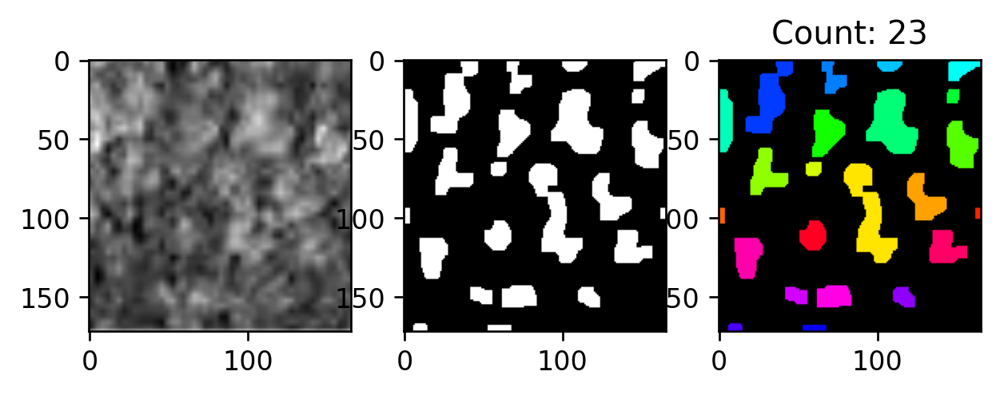

bs 41.0
it 2.0


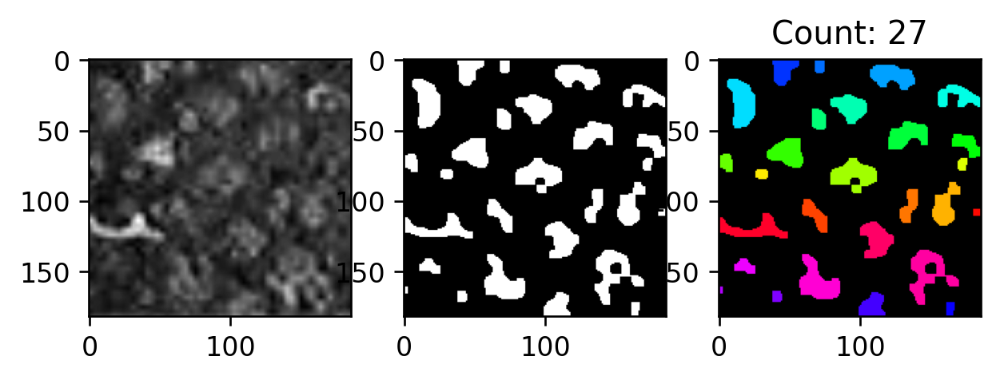

bs 55.0
it 3.0


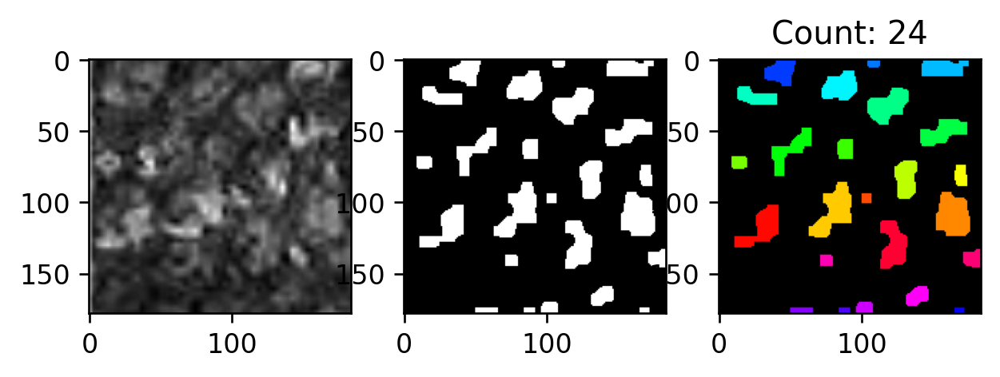

bs 47.0
it 2.0


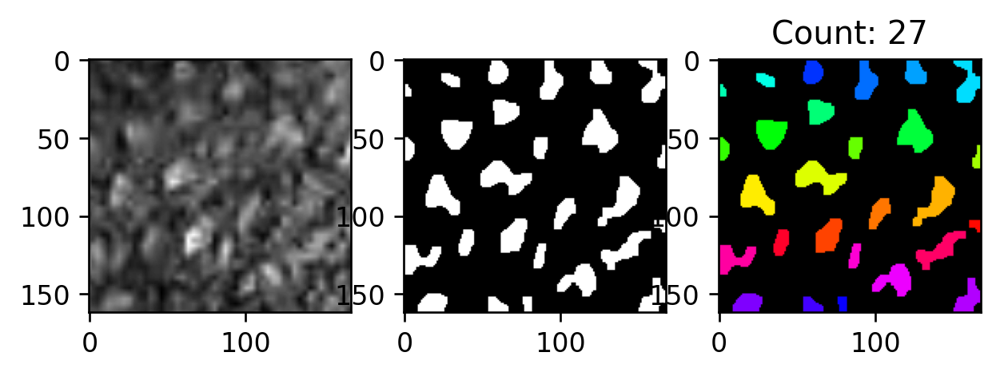

bs 55.0
it 3.0


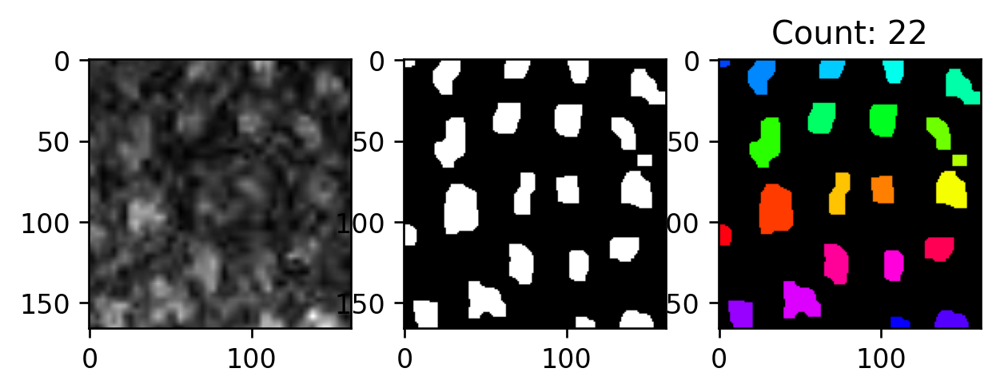

bs 59.0
it 3.0


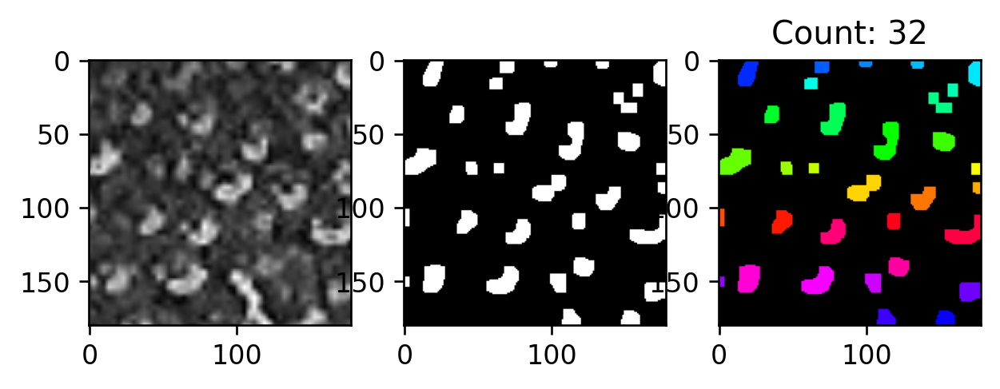

bs 27.0
it 1.0


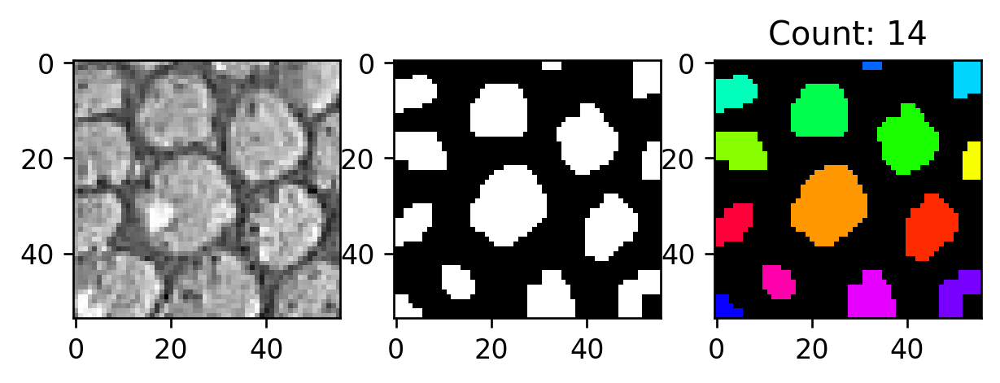

bs 51.0
it 3.0


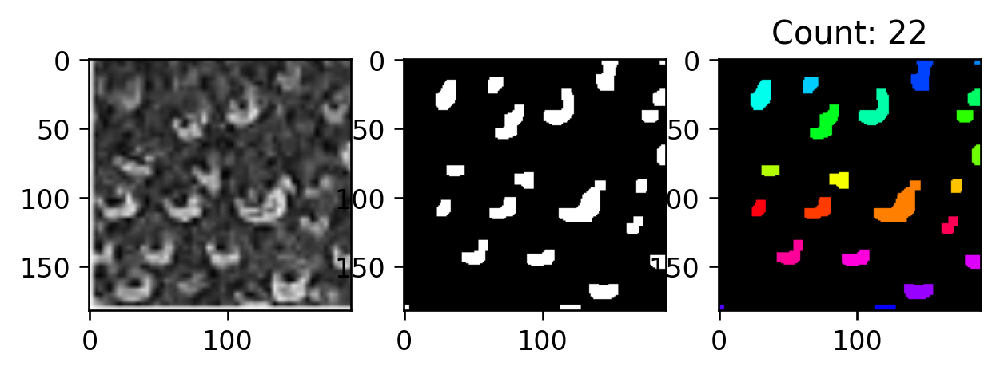

bs 49.0
it 2.0


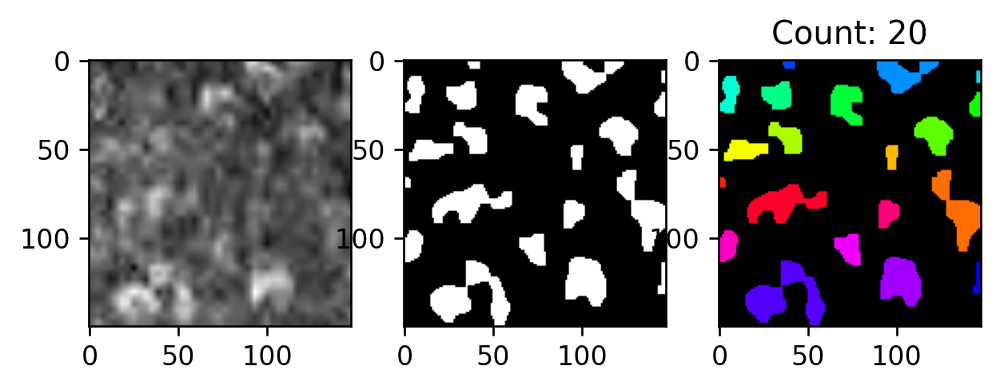

bs 35.0
it 2.0


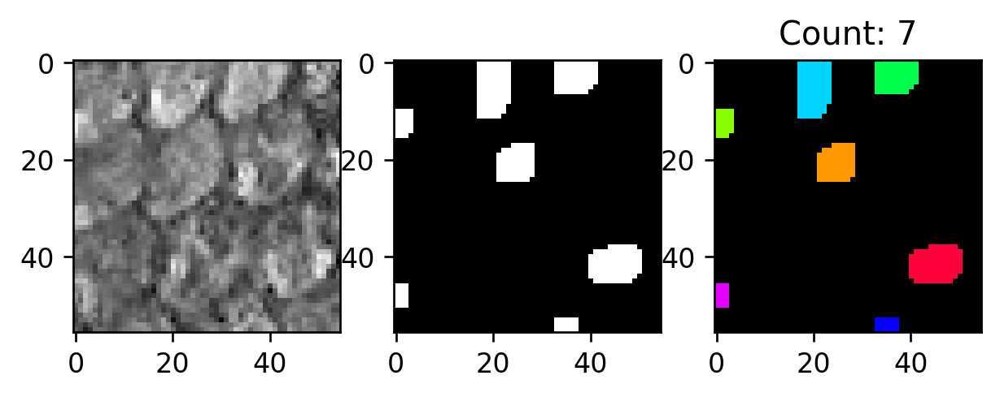

bs 59.0
it 3.0


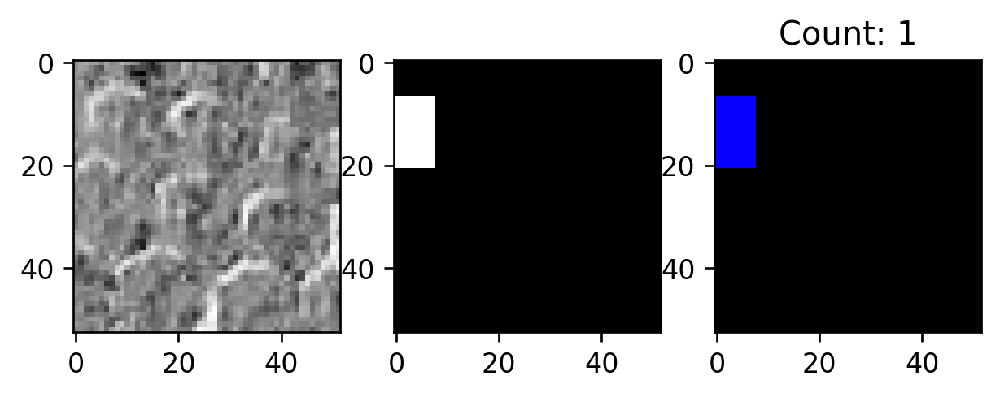

bs 33.0
it 2.0


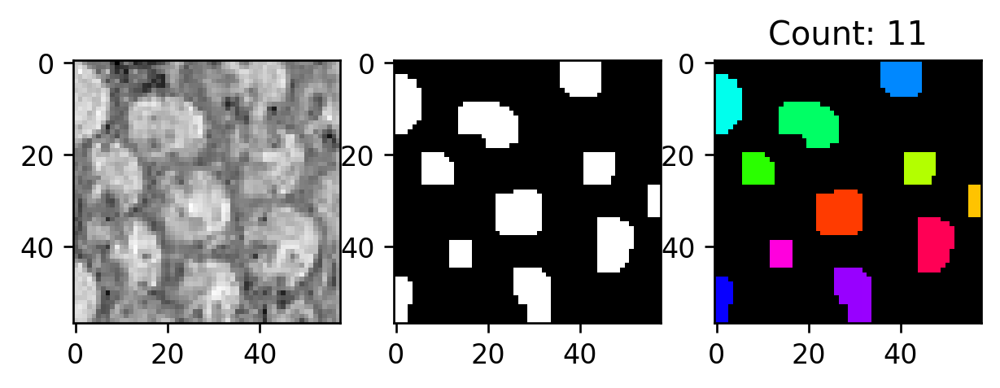

bs 55.0
it 3.0


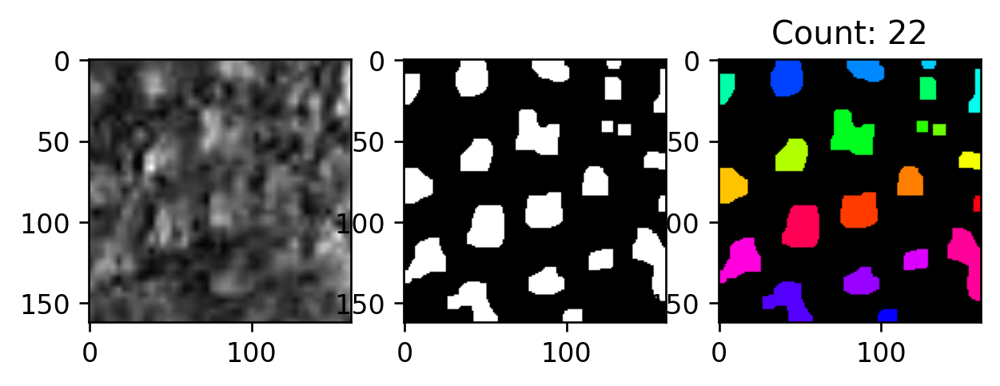

bs 55.0
it 3.0


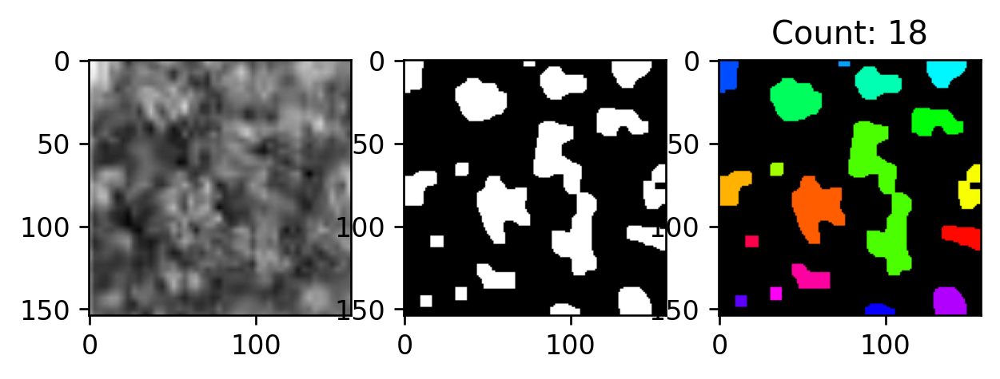

bs 47.0
it 2.0


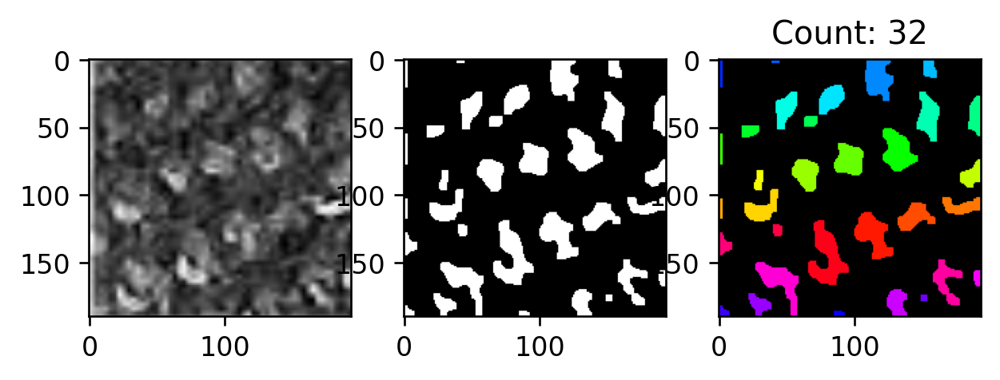

bs 55.0
it 3.0


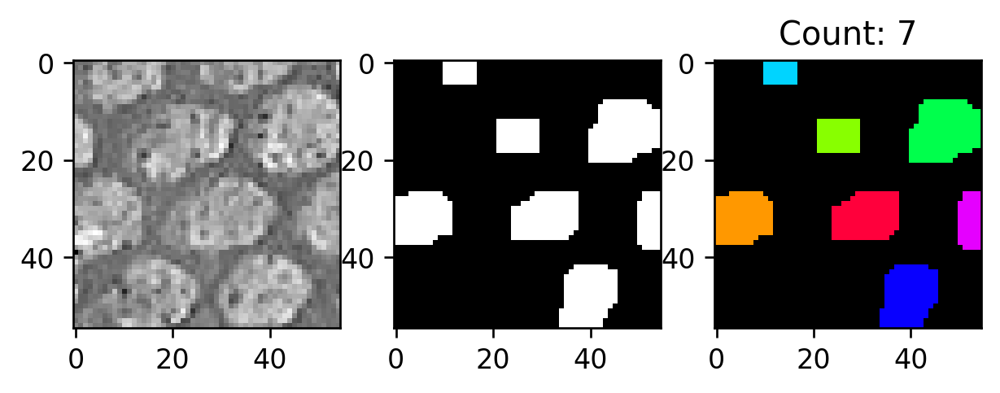

bs 53.0
it 3.0


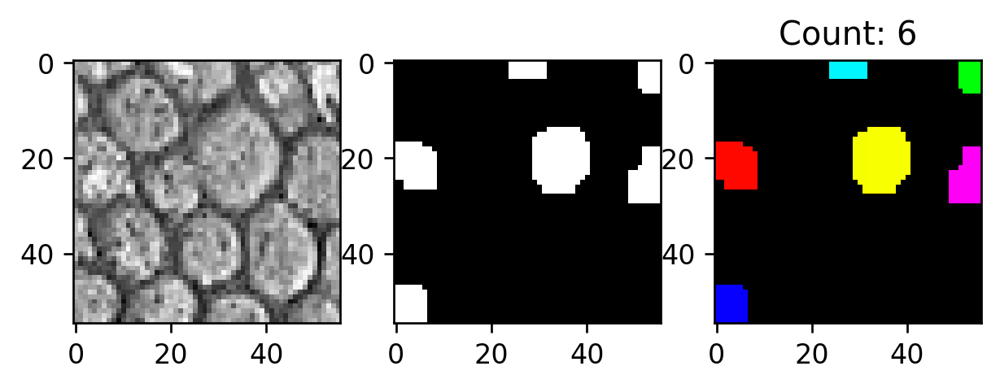

bs 51.0
it 3.0


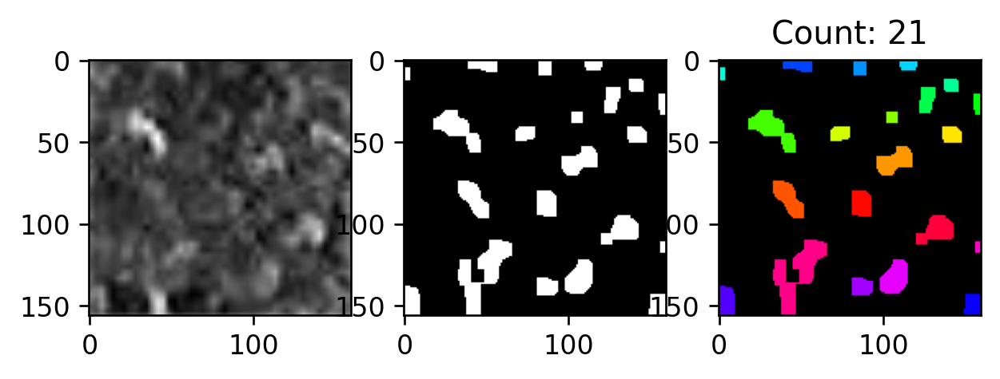

bs 35.0
it 2.0


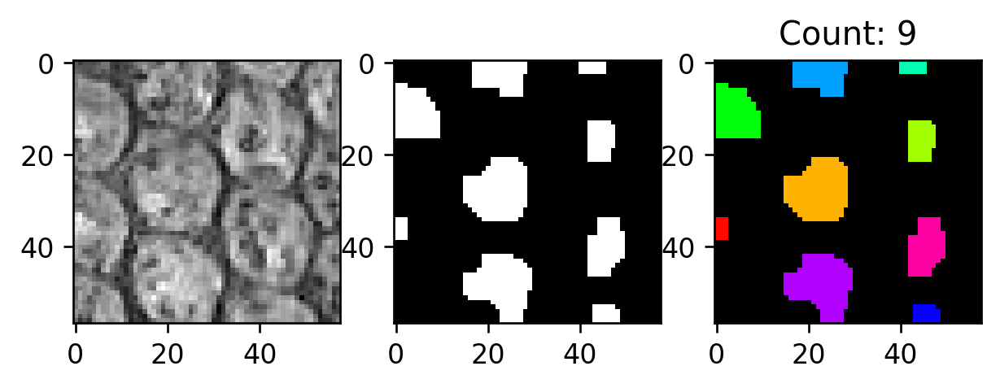

bs 37.0
it 2.0


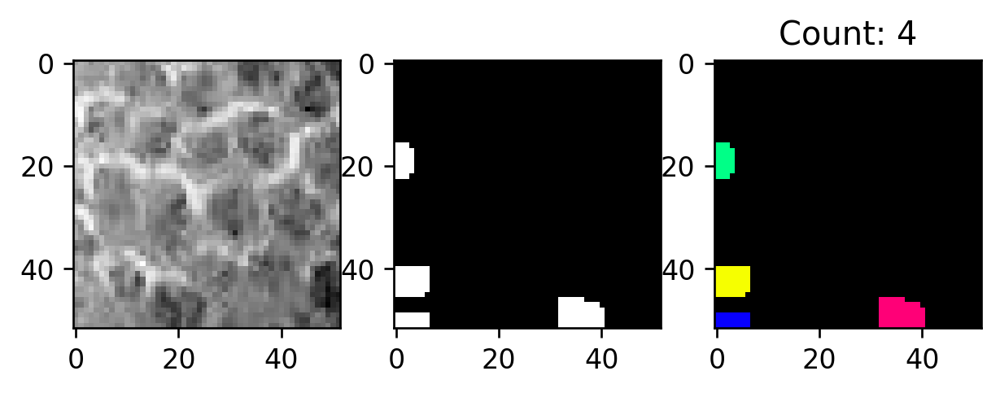

bs 63.0
it 3.0


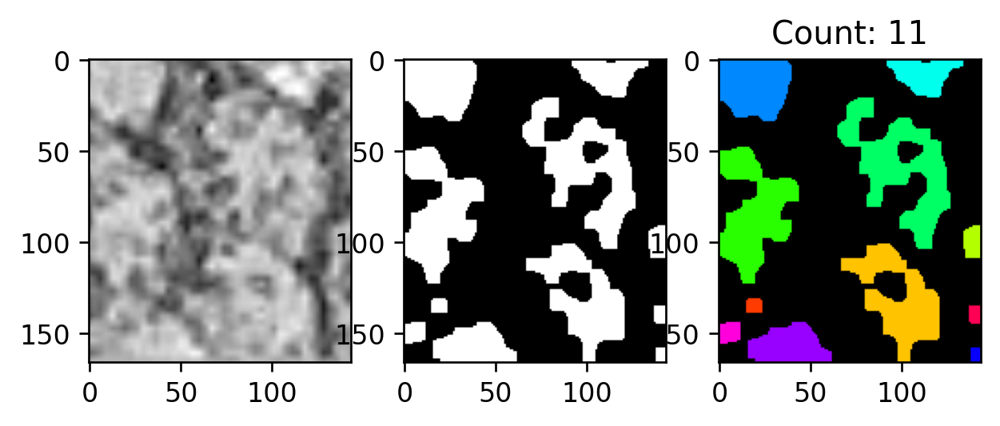

bs 83.0
it 4.0


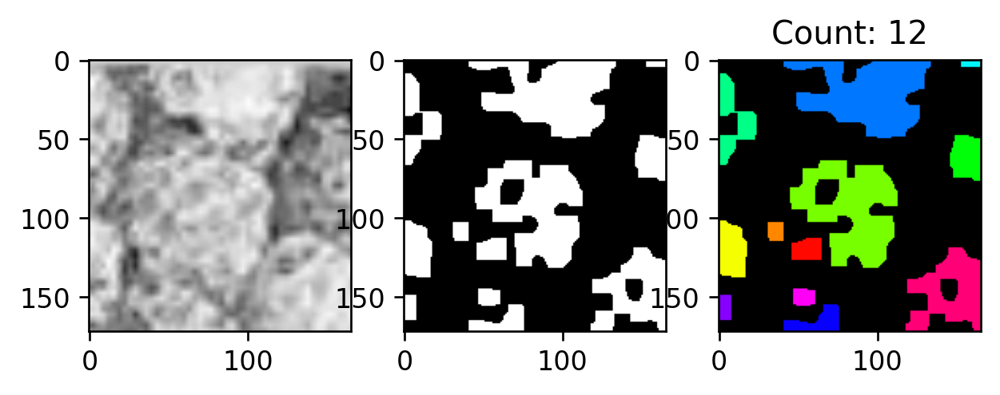

bs 95.0
it 5.0


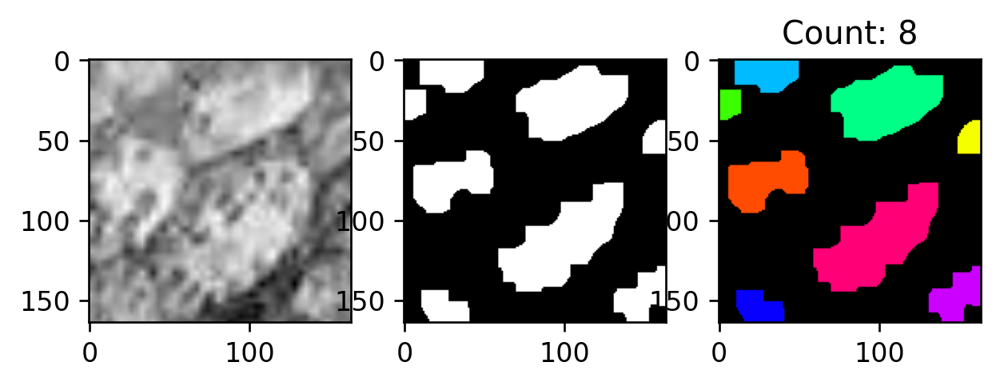

bs 81.0
it 4.0


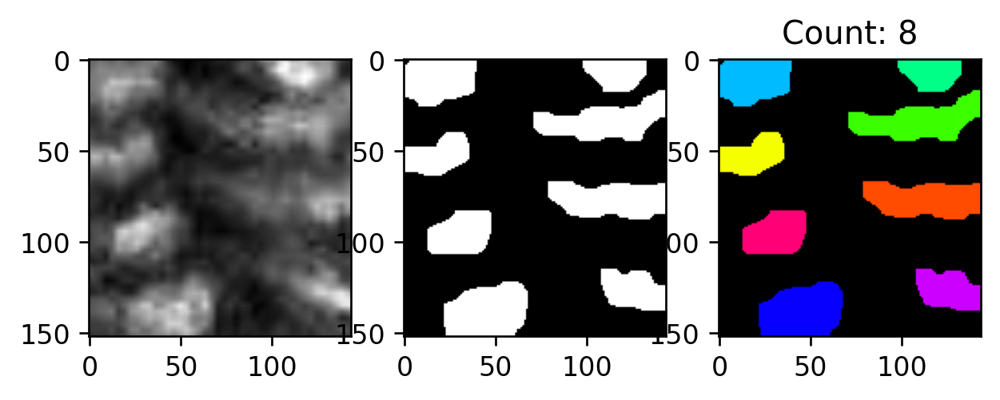

bs 41.0
it 2.0


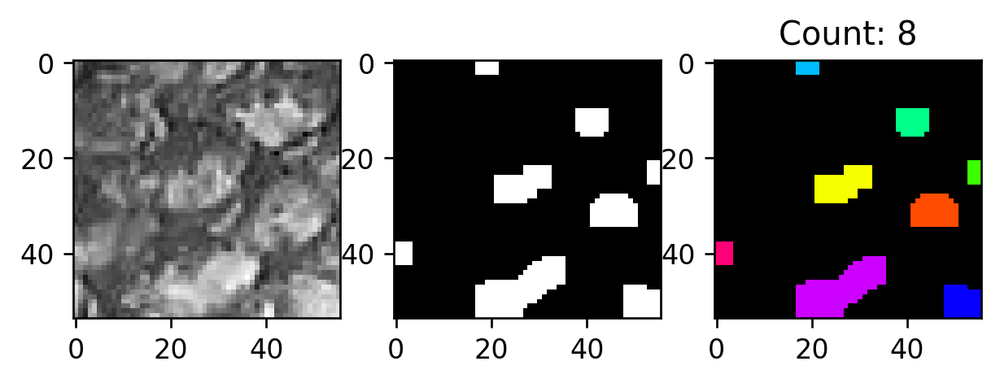

bs 31.0
it 2.0


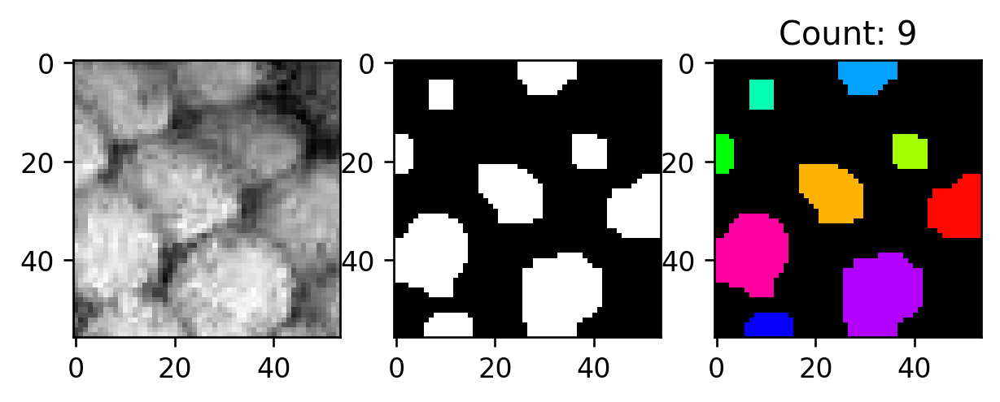

bs 107.0
it 5.0


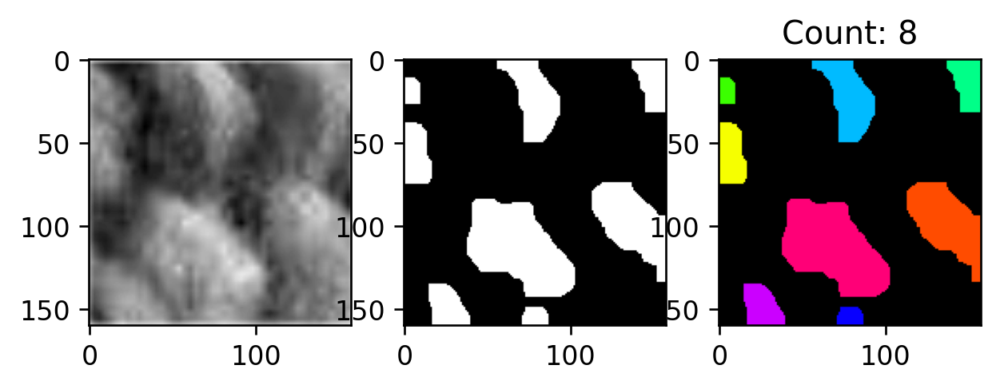

bs 51.0
it 3.0


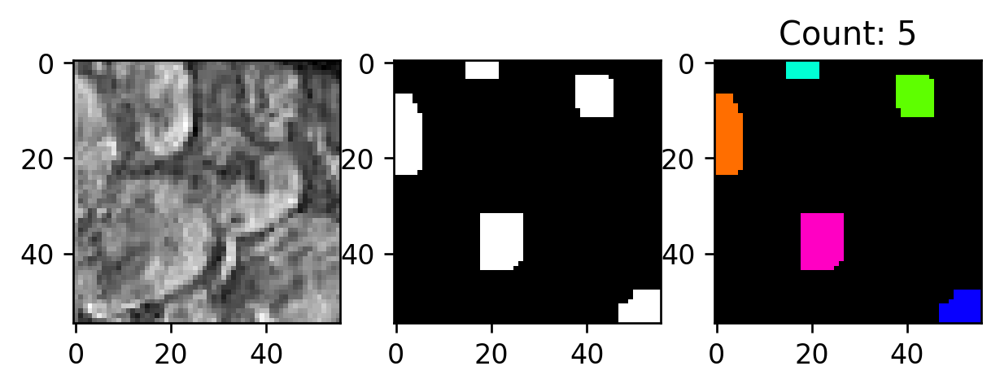

bs 43.0
it 2.0


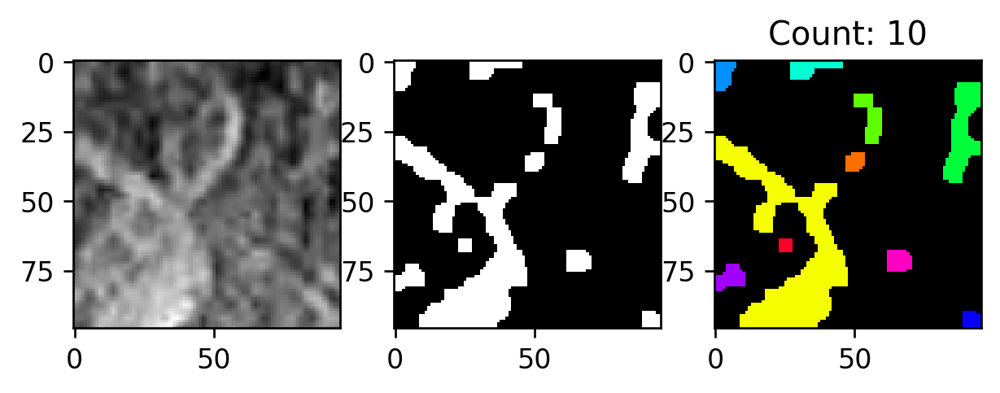

bs 53.0
it 3.0


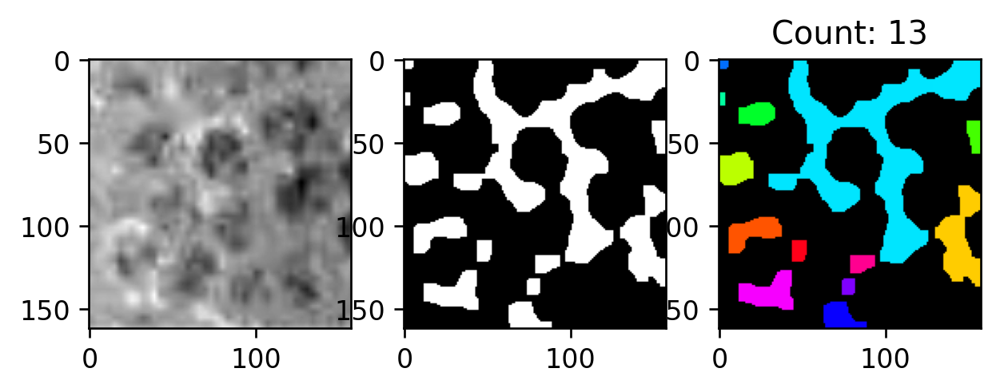

bs 83.0
it 4.0


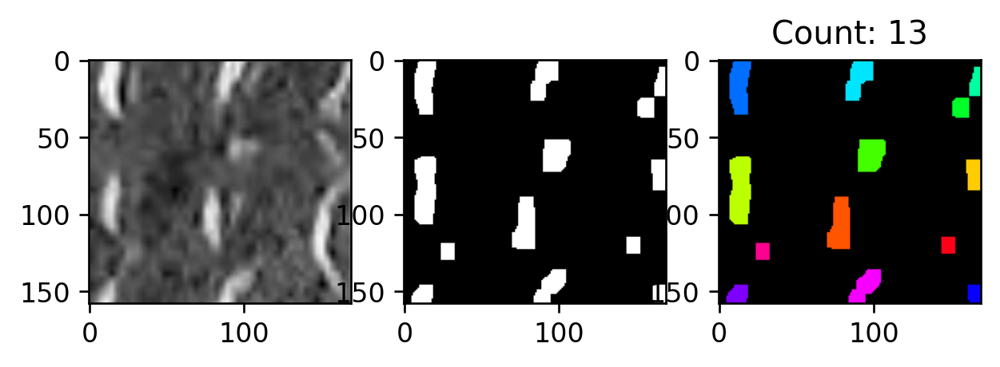

bs 99.0
it 5.0


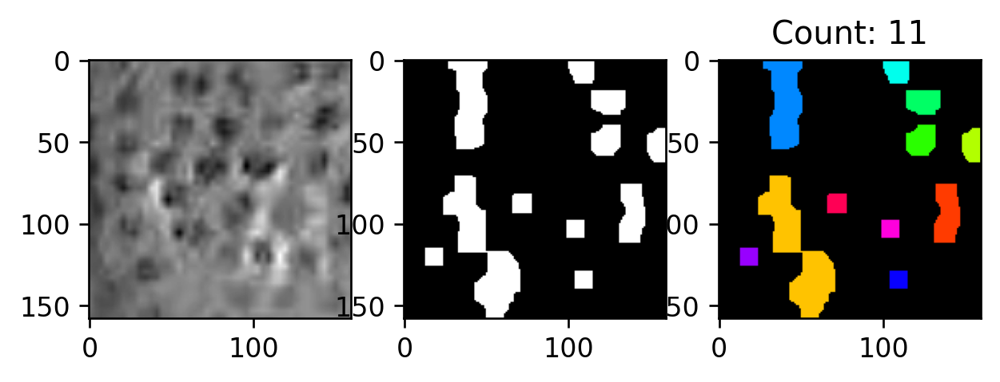

In [13]:
#to do this plotting method, should determine which factors are important: features will be the dimentionality of the array


#uniformity seems important, average size important


#maybe chooses either uniforminty ort the other
dirname = 'Anolis_cristatellus_images/'
directory = os.scandir(dirname)

block_size =  np.array(average_shortest_distance_squared) * 2
print(block_size)
thr = []

index = 0
customized = [2,3]
for img in directory:
    img_name = img.name
    if (img_name != '.ipynb_checkpoints'):
        if(len(customized) > 0 and block_size[index] < np.inf):
            image_names.append(img.name)
            
            #read the image, convert to grayscale add to array and title + blur
            img = cv2.imread(dirname + "" + img_name)
            original_img1.append(img)
            
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            original_img.append(gray)
            title = img_name
            
            
            img = gray

            blur = cv2.GaussianBlur(img,(5,5),0)
            blur = cv2.bilateralFilter(blur,10,10,100)
            
            filter_img.append(blur)
     
                
            #if customed block size has been determined
            
            if np.round(block_size[index]) % 2 != 1:
                block_size[index] = np.round(block_size[index]) + 1
            
            print("bs", np.round(block_size[index]))
            
            print("it", np.round(block_size[index]/20))
       
            thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, np.round(block_size[index]).astype(int), -2)
                
            kernel = np.ones((3,3),np.uint8)

            #if customized array is greater than size 0 iteration number has been determined
            opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations=np.round(block_size[index]/20 + 1).astype(int))

            
            # sure background area
            sure_bg = cv2.dilate(opening,kernel,iterations=1)

            # Finding sure foreground area: What does cv2.DIST do?
            dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
            ret, sure_fg = cv2.threshold(dist_transform, 1.5, 255, 0) 

            # Finding unknown region
            sure_fg = np.uint8(sure_fg)
            unknown = cv2.subtract(sure_bg,sure_fg)
            
            #adding sure_fg binarization to list of images
            images.append(sure_fg)

            plt.subplot(1,3,1), plt.imshow(gray, 'gray')
            plt.subplot(1,3,2), plt.imshow(sure_fg, 'gray')
            
            
            # Label and count (taken from maggie's code)
            # source: https://medium.com/analytics-vidhya/images-processing-segmentation-and-objects-counting-in-an-image-with-python-and-opencv-216cd38aca8e
            count, labels = cv2.connectedComponents(sure_fg)                
            count = count - 1 # background doesn't count as a scale
            label_hue = np.uint8(179 * labels / np.max(labels))
            blank_ch = 255 * np.ones_like(label_hue)
            labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
            labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
            labeled_img[label_hue == 0] = 0
            
            if(len(customized) != 0):
                labeled_imgs.append(labeled_img)

            plt.subplot(1, 3, 3), plt.imshow(labeled_img, 'gray')
            plt.title('Count: ' + str(count))
            plt.show()
            thr.append(sure_fg)
        index += 1
            
            
    

In [14]:
#https://stackoverflow.com/questions/13391073/adaptive-threshold-of-blurry-image

In [15]:
#maybe blocksize should be calculated from the average area around the specific point: the surrounding block
#the smallest? distance
average_size = []
scale_num_per_img = []
sizes_of_scales = []
total_stats = []
averages = []

print(len(images))
#iterates through images to determine average size and count of scales in␣initial binarization
for i in np.arange(len(thr)):    
    img = thr[i]
    #plt.imshow(img)
    #plt.show()
    binary_map = (img > 0).astype(np.uint8)
    connectivity = 4 # or whatever you prefer
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
    num_labels = output[0]
    # The second cell is the label matrix
    labels = output[1]
    # The third cell is the stat matrix
    stats = output[2]
    # The fourth cell is the centroid matrix
    centroids = output[3]
    #print("Sizes of all scales:", stats[1:,-1])
    #print("Number of scales detected (including noise)", num_labels - 1)
    #print("Average size of scales: ", np.average(stats[1:,-1]))
    #print("\n")
    sizes_of_scales.append((stats[1:,-1]))
    average_size.append(([num_labels, np.average(stats[1:,-1])]))
    averages.append(np.average(stats[1:,-1]))
    total_stats.append([num_labels,stats[1:,-1], stats[1:,-1]])

98


In [16]:
def overlay(bw_img, color_mask, w1=0.2, w2=0.95):
    a = cv2.cvtColor(bw_img, cv2.COLOR_GRAY2RGB)
    a -= np.min(a)
    a = a/np.max(a)*255
    a = np.clip(a, a_min=0, a_max=255).astype(int)
    #a = np.array([[i.tolist()+[0] if np.max(i)==0 else i.tolist()+[255] for i␣,in j] for j in a])
    b = np.clip(color_mask, a_min=0, a_max=255).astype(int)
    #b = np.array([[i.tolist()+[255] for i in j] for j in b])
    c = cv2.addWeighted(b,w1,a,w2,0)
    return c

TRYING TO CLEAN UP THE IMAGES AND REMOVE SMALL SPECKELS: SHOULD TAKE INTO ACCOUNT DISTANCE AND SIZE
Images 43 55
43
2
scales: 12
na [13, 92.25]

avg 9.604686356149273
bs 29.368546623604548


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


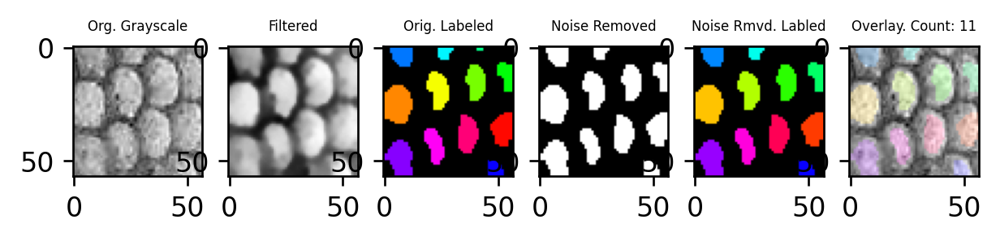

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 6
na [7, 1017.3333333333334]

avg 31.89566323708183
bs 86.99078330158802


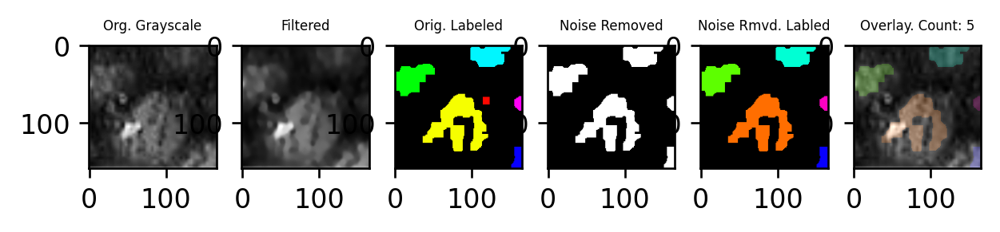

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 13
na [14, 504.7692307692308]

avg 22.46706991953403
bs 72.69947460399437


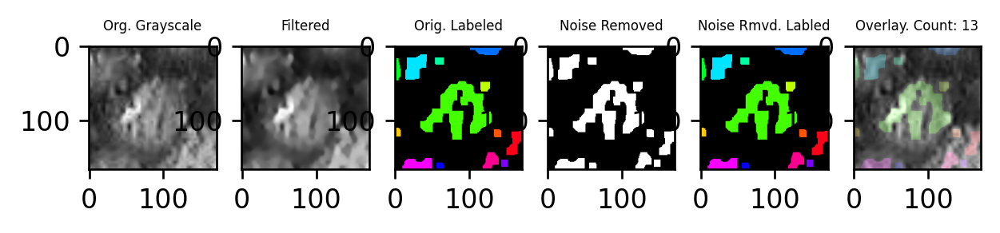

2
scales: 0
na [1, nan]

avg nan
bs 73.0


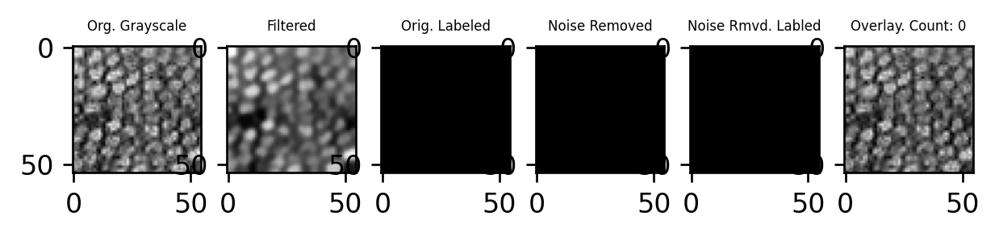

2
scales: 10
na [11, 736.5]

avg 27.13853349022382
bs 61.43292914485263


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


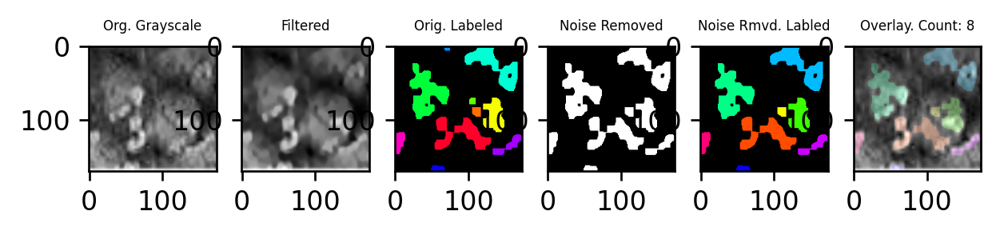

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 11
na [12, 633.2727272727273]

avg 25.164910635103144
bs 75.0


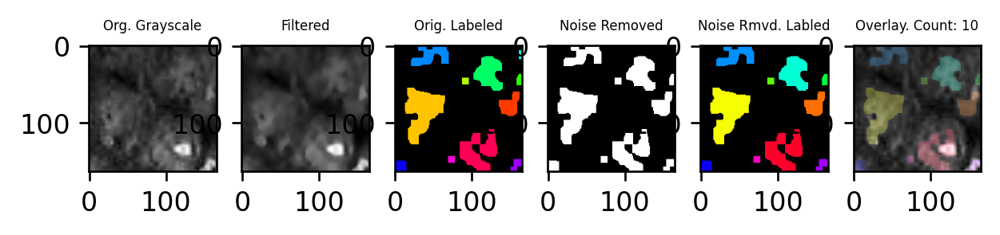

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 13
na [14, 85.76923076923077]

avg 9.261167894452123
bs 28.88846698190103


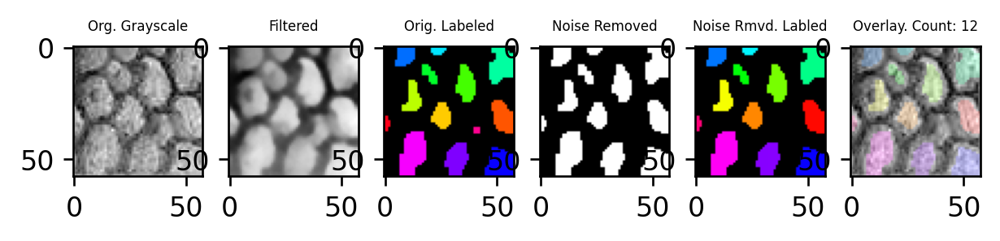

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 12
na [13, 489.4166666666667]

avg 22.122763540450066
bs 65.0


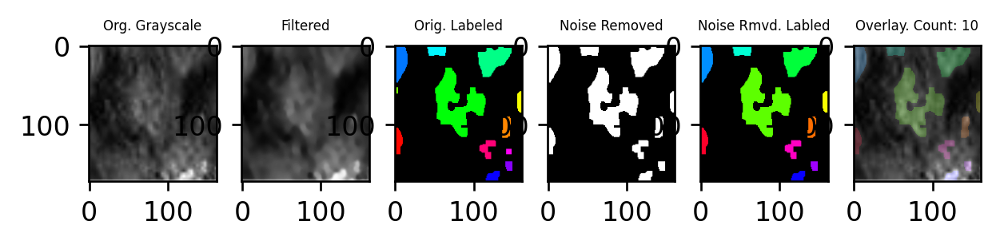

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 13
na [14, 583.7692307692307]

avg 24.1613168260596
bs 59.0


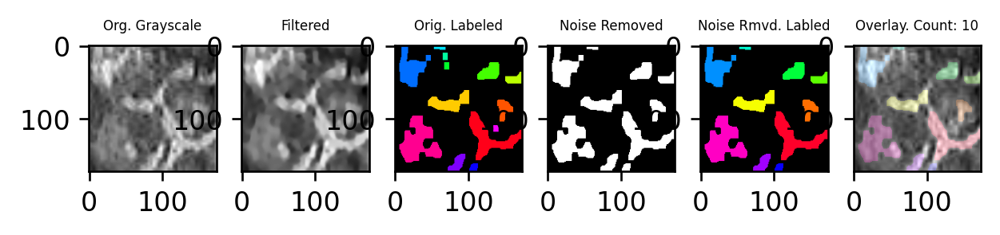

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 10
na [11, 96.0]

avg 9.797958971132712
bs 27.0


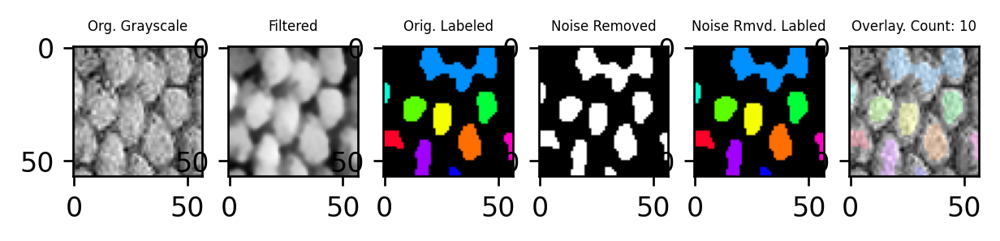

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 34
na [35, 207.41176470588235]

avg 14.401797273461474
bs 42.766153145609216


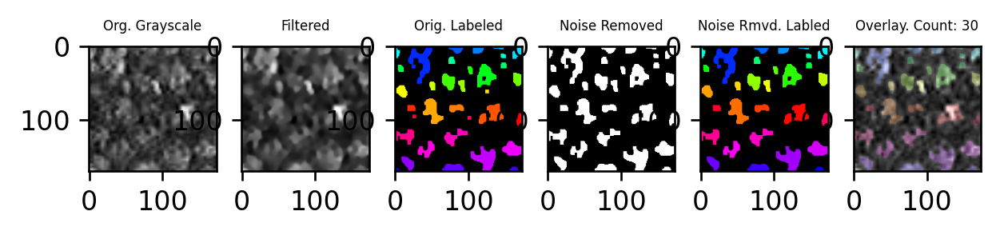

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 23
na [24, 298.4782608695652]

avg 17.27652340228106
bs 52.92853343962523


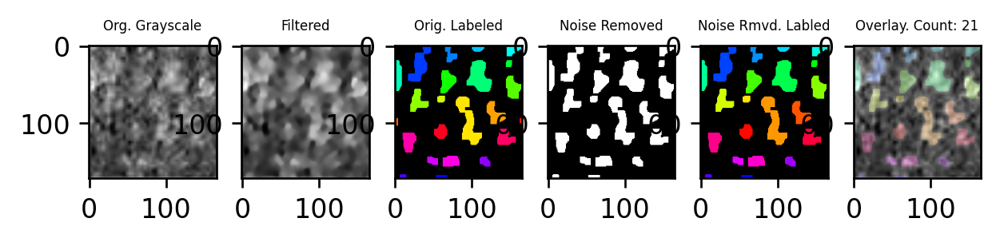

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 27
na [28, 253.14814814814815]

avg 15.910630036178585
bs 41.242881857221214


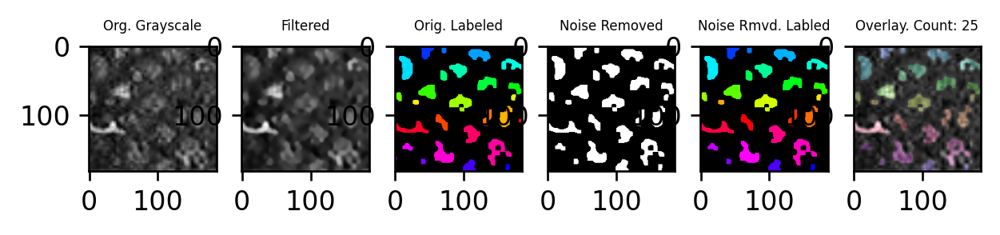

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 24
na [25, 254.41666666666666]

avg 15.950444089951436
bs 54.8045939969169


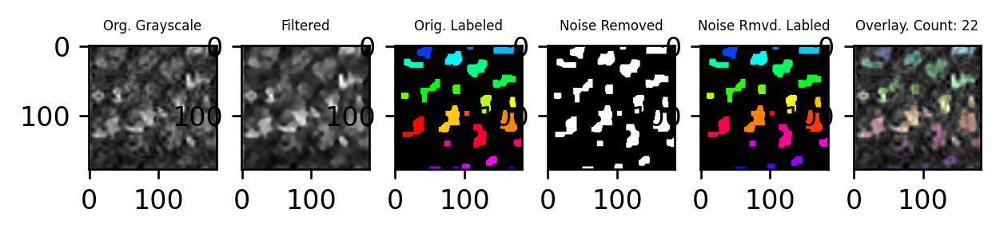

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 27
na [28, 202.14814814814815]

avg 14.217881281968427
bs 46.567066876833145


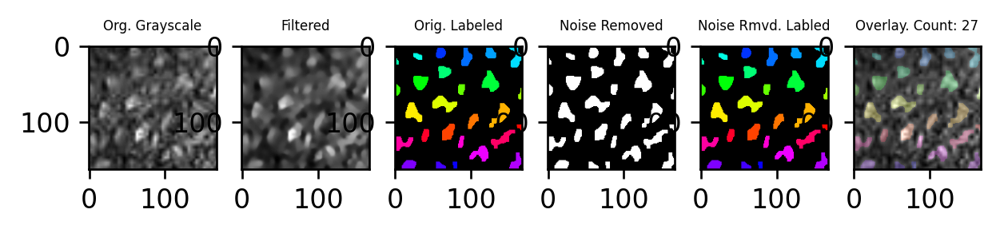

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 22
na [23, 242.63636363636363]

avg 15.576789259547798
bs 55.0


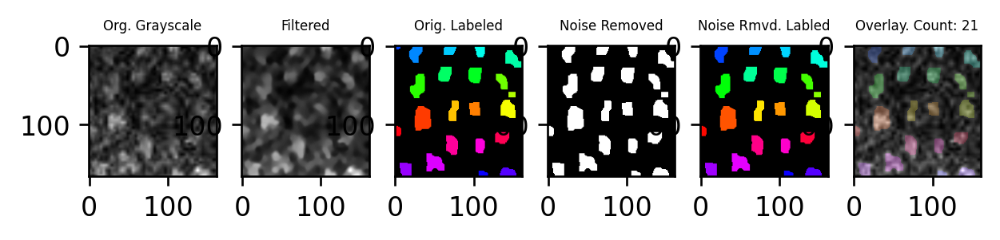

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 32
na [33, 143.03125]

avg 11.959567299864991
bs 59.11689233301962


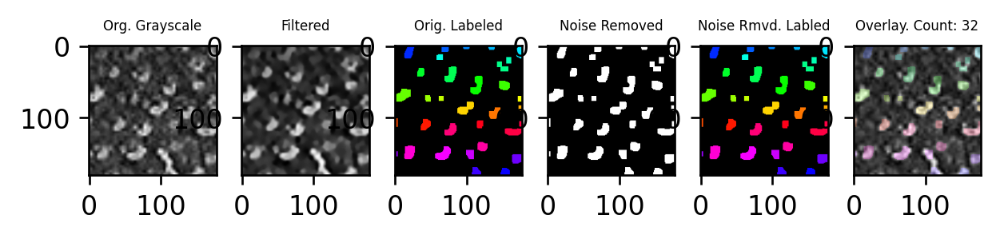

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 14
na [15, 73.21428571428571]

avg 8.556534679079242
bs 26.99925860585973


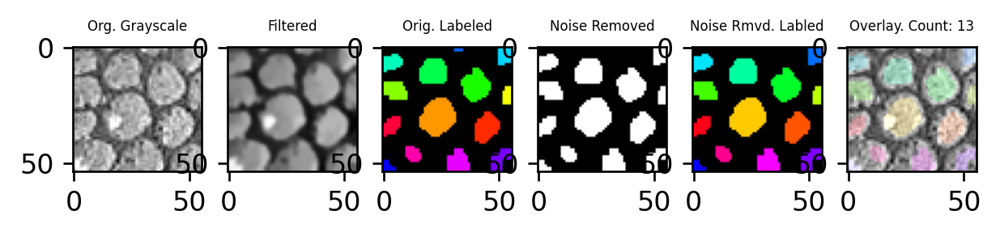

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 22
na [23, 163.8181818181818]

avg 12.799147698897057
bs 50.637340086744686


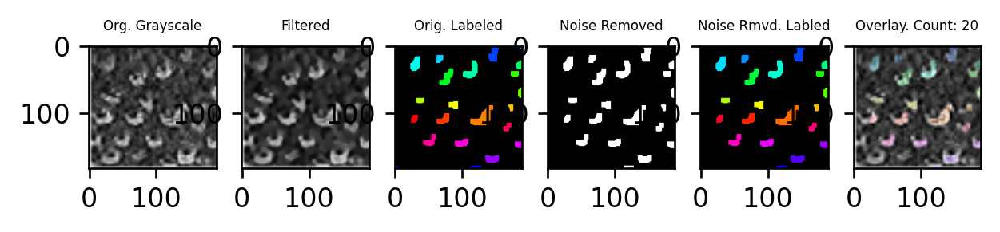

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 20
na [21, 243.1]

avg 15.591664439693409
bs 49.0


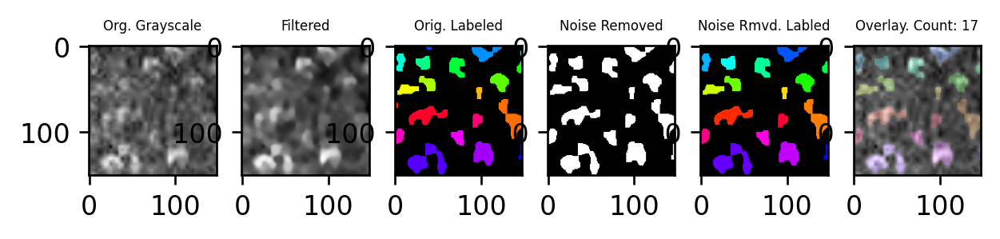

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 7
na [8, 47.142857142857146]

avg 6.8660656232559525
bs 34.80707749579828


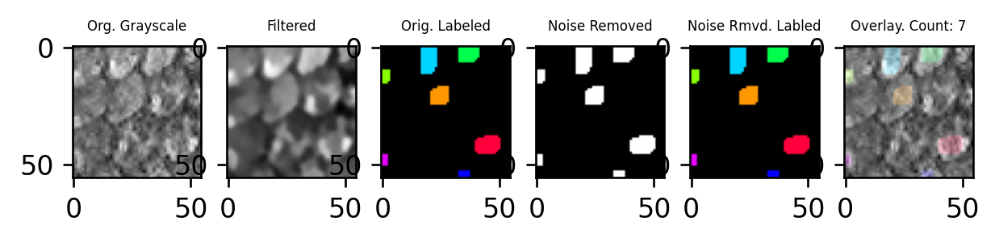

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 1
na [2, 112.0]

avg 10.583005244258363
bs 59.25174833934818


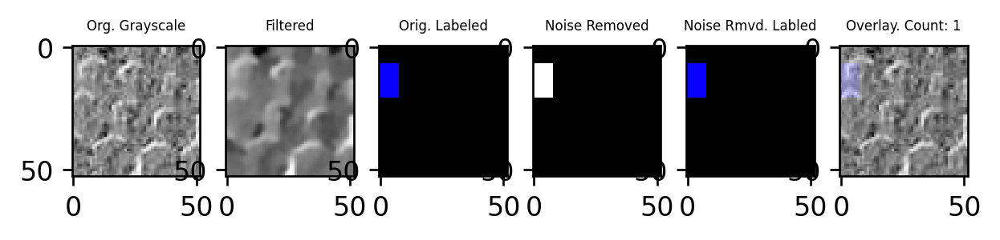

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 11
na [12, 61.18181818181818]

avg 7.821880731756154
bs 33.0


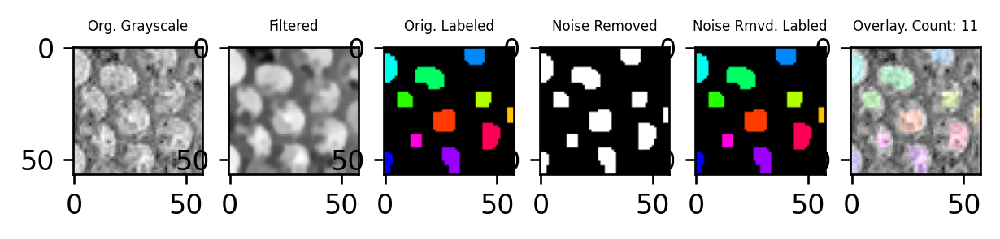

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 22
na [23, 263.22727272727275]

avg 16.224280345435133
bs 54.66199856074316


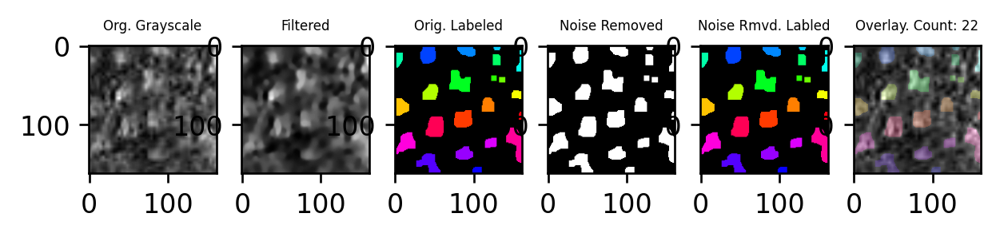

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 18
na [19, 333.44444444444446]

avg 18.260461233069783
bs 54.61576794120686


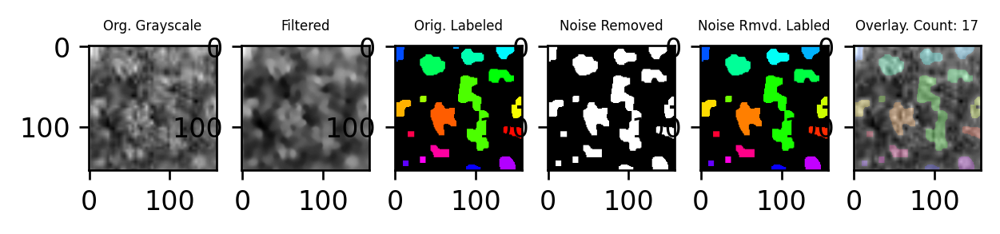

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 32
na [33, 235.65625]

avg 15.351099309170012
bs 47.0


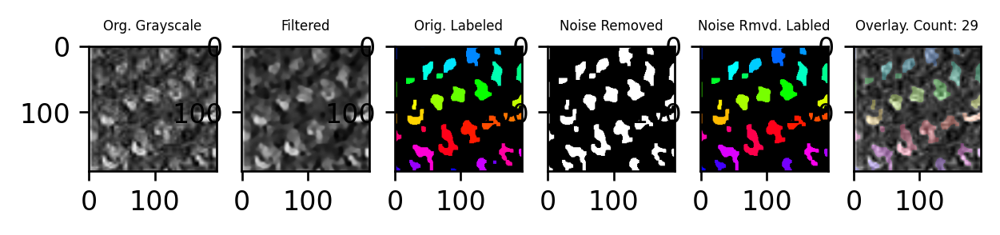

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 7
na [8, 99.42857142857143]

avg 9.9713876380658
bs 55.0


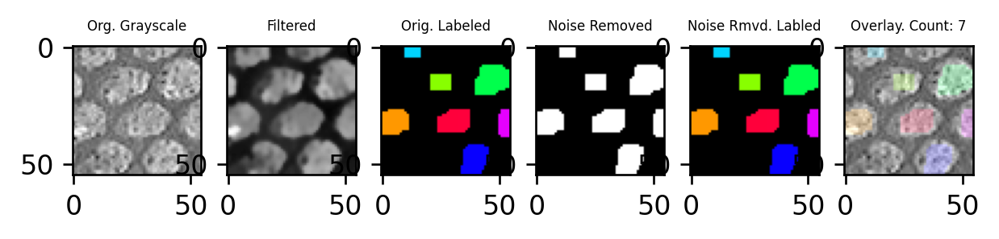

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 6
na [7, 69.83333333333333]

avg 8.356634091147782
bs 53.18449468852102


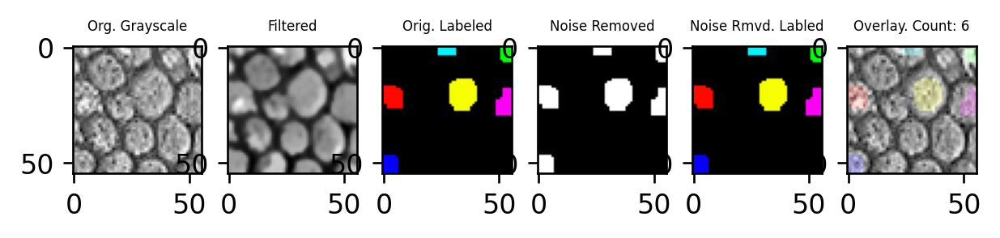

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 21
na [22, 168.23809523809524]

avg 12.970662868107214
bs 51.0


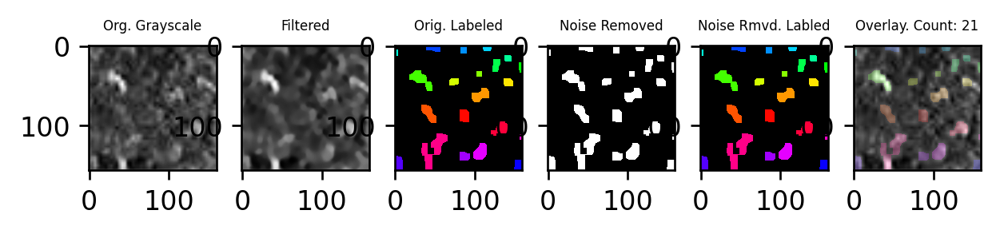

2
scales: 9
na [10, 76.11111111111111]

avg 8.724168218868268
bs 35.18996588943389


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


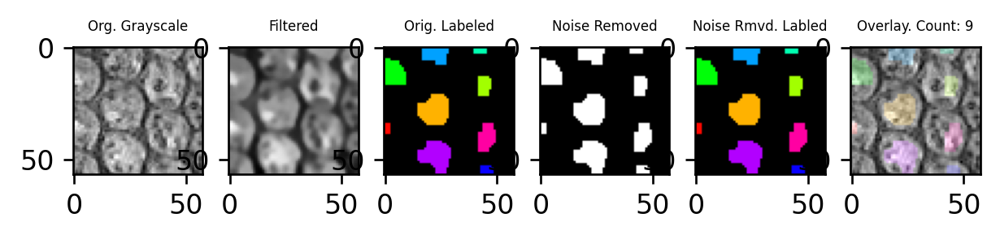

2
scales: 4
na [5, 34.25]

avg 5.852349955359813
bs 36.716371445425416


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


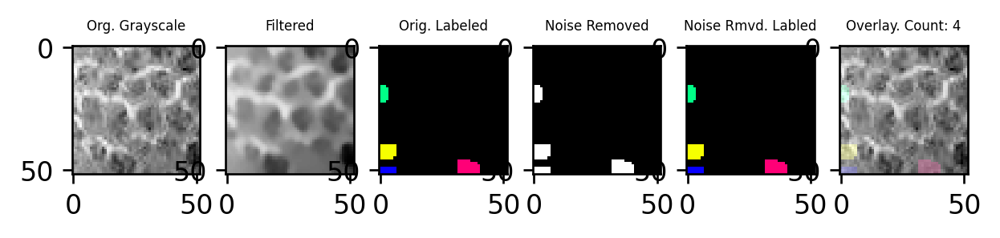

2
scales: 11
na [12, 753.0]

avg 27.440845468024488
bs 62.9530429892946


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


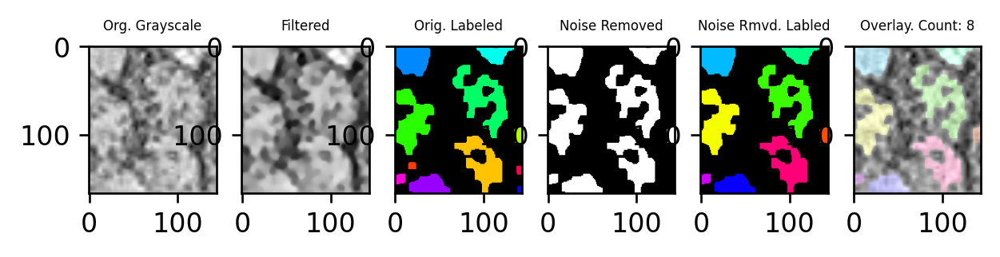

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 12
na [13, 811.8333333333334]

avg 28.492689120778568
bs 82.56999703201646


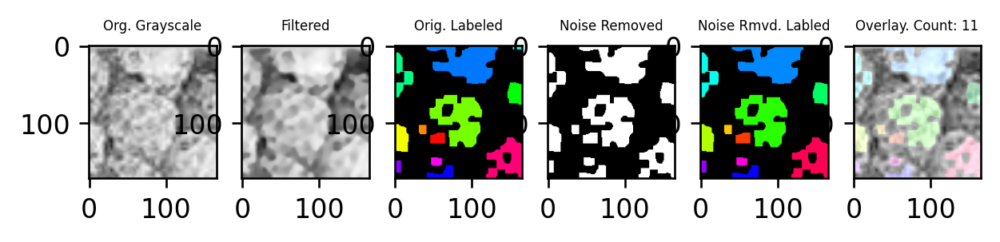

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 8
na [9, 1080.25]

avg 32.86715685908959
bs 95.0


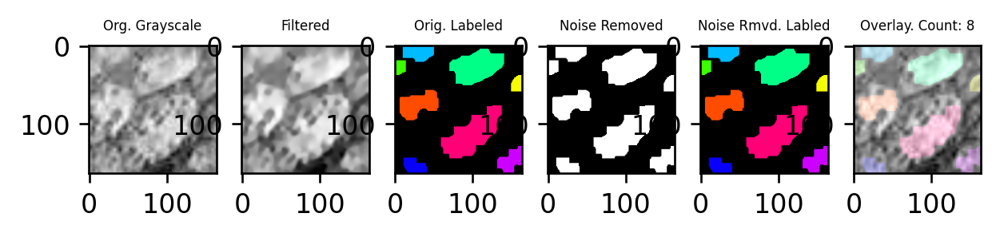

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 8
na [9, 839.25]

avg 28.96981187374195
bs 80.8985249881133


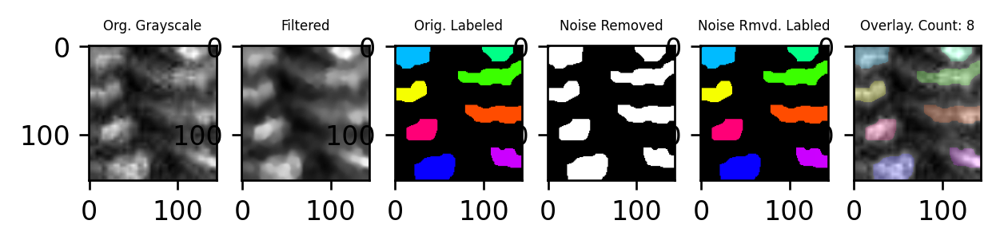

2
scales: 8
na [9, 53.25]

avg 7.297259759663212
bs 40.808309401774466


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


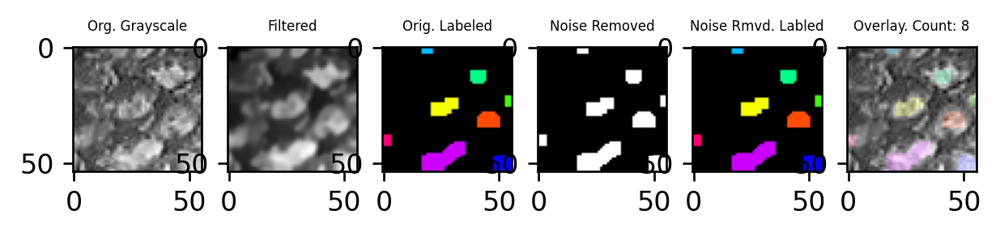

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 9
na [10, 98.88888888888889]

avg 9.944289260117532
bs 30.852700206059126


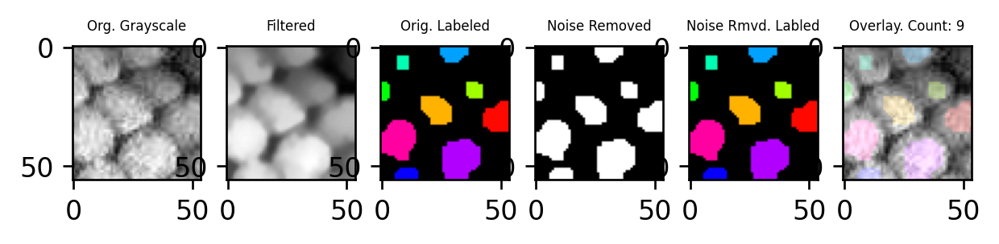

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 8
na [9, 868.75]

avg 29.47456530637899
bs 107.0


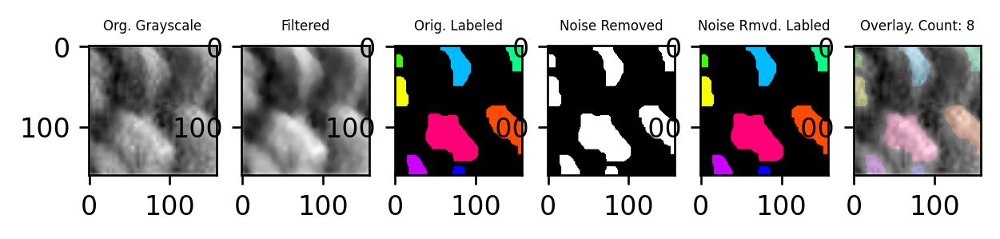

2
scales: 5
na [6, 70.4]

avg 8.390470785361213
bs 51.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


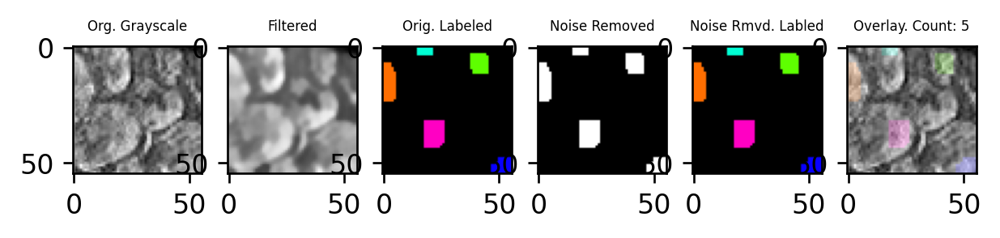

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 10
na [11, 195.2]

avg 13.971399357258385
bs 43.155569803450845


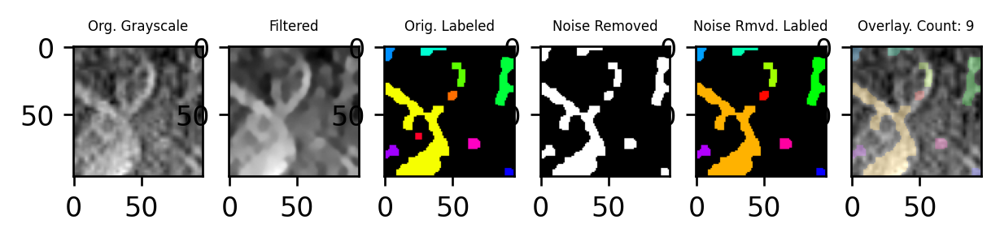

2
scales: 13
na [14, 586.9230769230769]

avg 24.226495349577018
bs 53.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


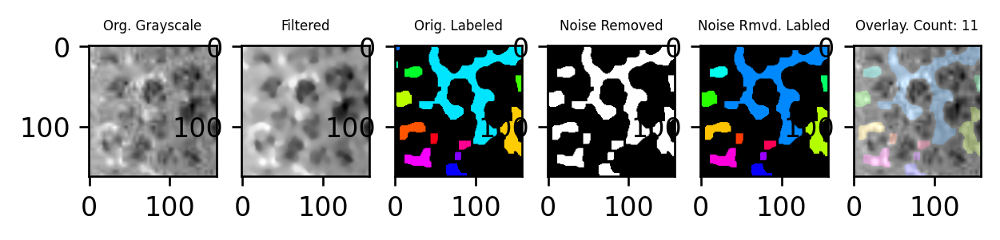

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 13
na [14, 247.92307692307693]

avg 15.745573248474535
bs 83.0


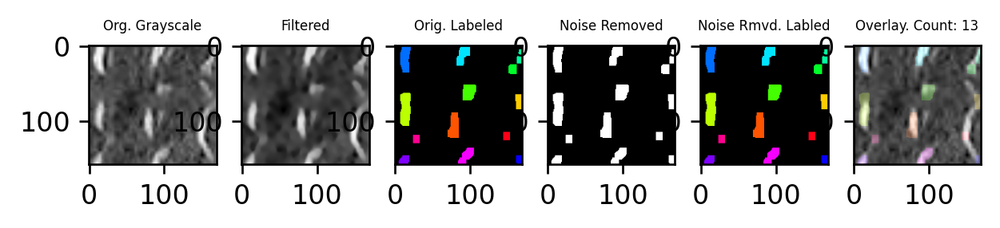

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
scales: 11
na [12, 418.3636363636364]

avg 20.453939384960453
bs 98.50653821330079


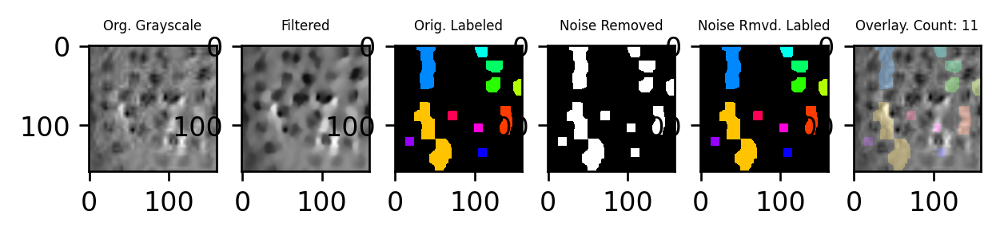

In [17]:
without_r = []
#find a way to draw the contors to see what is detected
#use a different thing????

print("TRYING TO CLEAN UP THE IMAGES AND REMOVE SMALL SPECKELS: SHOULD TAKE INTO ACCOUNT DISTANCE AND SIZE")

index = 0;
final_counts = []

print("Images", len(thr), len(block_size))

block_size2 = []
for i in block_size:
    if i < np.inf:
        block_size2.append(i)
        
print(len(block_size2))
        

for img in thr:
    binary_map = (img > 0).astype(np.uint8)
    connectivity = 4 # or whatever you prefer
    output = cv2.connectedComponentsWithStats(binary_map, connectivity, cv2.CV_32S)
    stats = output[2]

    kernel = np.ones((3,3),np.uint8)
    #opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1)
    #closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations = 1)


    #review: what exactly does this do?
    cnts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    print(len(cnts))
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]


    print("scales:", len(cnts))
    print("na", average_size[index])
    print()


    for c in cnts:
        area = cv2.contourArea(c)
        if area < (averages[index]/10):
            img = cv2.drawContours(img, [c], -1, (0,0,0), -1)

    print("avg", np.sqrt(averages[index]))
    print("bs", block_size2[index])



    plt.subplot(1,6,1), plt.imshow(original_img[index], 'gray')
    plt.title("Org. Grayscale", fontsize=5)
    plt.subplot(1,6,2), plt.imshow(filter_img[index], 'gray')
    plt.title("Filtered", fontsize=5)
    plt.subplot(1,6,3), plt.imshow(labeled_imgs[index], 'gray')
    plt.title("Orig. Labeled", fontsize=5)
    plt.subplot(1,6,4), plt.imshow(img, 'gray')
    plt.title("Noise Removed", fontsize=5)


        # Label and count (taken from maggie's code)
        # source: https://medium.com/analytics-vidhya/images-processing-segmentation-and-objects-counting-in-an-image-with-python-and-opencv-216cd38aca8e
    count, labels = cv2.connectedComponents(img)                
    count = count - 1 # background doesn't count as a scale
    label_hue = np.uint8(179 * labels / np.max(labels))
    blank_ch = 255 * np.ones_like(label_hue)
    labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
    labeled_img[label_hue == 0] = 0
    without_r.append(labeled_img)

    plt.subplot(1, 6, 5), plt.imshow(labeled_img, 'gray')
    plt.title("Noise Rmvd. Labled", fontsize=5)
    plt.subplot(1, 6, 6), plt.imshow(overlay(original_img[index], labeled_img))

    final_counts.append(count)
    plt.title("Overlay. Count: " + str(count), fontsize=5)



    plt.show()
    index = index + 1





In [18]:
#do over and over with different interation sizes untill a good uniformity is reached? and there is a low size Sd?
#base block size on distance?
#it works well for the ones that come out uniform in the OTSU: the ones that don't come out uniform are eiter too broken up with some bigs ones
#or not present
#increase iteration until uniform with SD below?
#graphing the features some combination that result in the best blocksize must be possible